In [1]:
import xarray as xr
import os
import dask
import h5netcdf
import re
import scipy
import numpy as np
import pandas as pd
from datetime import timedelta
import datetime
import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib.colors import TwoSlopeNorm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker  
import pint
from pint import UnitRegistry
ureg = UnitRegistry()
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'large',
         'axes.labelsize': 22,
         'axes.titlesize':'large',
         'xtick.labelsize':18,
         'ytick.labelsize':18,
         'figure.figsize':[10,7],
         'figure.titlesize':22}
pylab.rcParams.update(params)

import sys
sys.path.append(".")  # Ensures the current directory is in the Python path
sys.path.append("/home/paaa/python_scripts/")
import my_functions as mfun
from my_classes import DatasetProcessor

In [64]:
runid = 'iyw7'
case_study = 'Cabauw'
inidate="20220515"
z_path =f'/perm/paaa/Les/Cases/Catrine/Martin/input/{runid}_les_input_{case_study}_{inidate}.nc'
ds_iyw7 = xr.open_dataset(z_path)


In [65]:
# spatial average keeing attributes 
ds_iyw7 = ds_iyw7.mean(dim=['latitude','longitude'],keep_attrs=True)

In [5]:
## open obs
dir_obs = "/perm/paaa/observations"
obs_name = "cesar_surface_flux"
datestamp = "2022"
str_time = '2022-05-15'
end_time = '2022-05-17'

################
#####  OPEN OBSERVATIONS #####
################

#### CABAUW ####
################
ds_cabauw = {}

# 1) #######################
####  obs_surf_flx  ####
########################
# Surface
print ('Dataset name: obs_surf_flx')
obs_name = "cesar_surface_flux"
datestamp = "2022"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and datestamp in f and f.endswith('.nc')]
obs_surf_flx    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))
# convert UTC to local time (+2 hours)
obs_surf_flx['time'] = obs_surf_flx['time'].astype('datetime64[ns]') + np.timedelta64(2,'h')
ds_cabauw['obs_surf_flx'] = obs_surf_flx.resample(time='1h',label='right').mean()  ## Label right or left??????
################################################

# 2) ########################
####  obs_tower_flx  ####
#########################
# Tower
print ('Dataset name: obs_tower_flx')
obs_name = "cesar_tower_flux"
datestamp = "2022"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and datestamp in f and f.endswith('.nc')]
obs_tower_flx    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))
# convert UTC to local time (+2 hours)
# obs_tower_flx['time'] = obs_tower_flx['time'].astype('datetime64[ns]') + np.timedelta64(2,'h')
# obs_tower_flx = obs_tower_flx.resample(time='1h',label='right').mean()  ## Label right or left??????
ds_cabauw['obs_tower_flx'] = obs_tower_flx.rolling(time=6, center=True).mean()
################################################


# 3) ############################
####  Cabauw_CO2_May2022 ####
#############################
### import CO2 concentration ## 
file = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if 'CO2' in f and f.endswith('.csv')][0]
print ('Dataset name: '+file[30:-4])
# Read the first two rows separately
headers =  pd.read_csv(file, nrows=1).columns.tolist()

# Read the actual data, skipping the units row
df = pd.read_csv(file)
df.columns.values[0] = "time"
df = df.set_index("time")

# # Convert to xarray
ds = df.to_xarray()
for var in ds.variables:
    if var =='time':
        continue
    elif 'flag' in var:
        ds[var].attrs["units"] = ''
    else: 
        ds[var].attrs["units"] = 'PPM'
# # Optional: parse the time if it's not already datetime
ds["time"] = pd.to_datetime(df.index) + np.timedelta64(2,'h') # to LT (CEST)
# # Now you can assign it to your dict:
ds_cabauw[file[30:-4]] = ds
################################################

# 1) #######################
####  obs_tower_meteo  ####
########################
# Surface
print ('Dataset name: obs_tower_meteo')
obs_name = "cesar_tower_meteo"
datestamp = "2022"
files = [os.path.join(dir_obs+'/Cesar', f) for f in os.listdir(dir_obs+'/Cesar') if f.startswith(obs_name) and datestamp in f and f.endswith('.nc')]
obs_tower_meteo    = xr.open_mfdataset(files,combine='by_coords').sel(time=slice(str_time,end_time))
# convert UTC to local time (+2 hours)
obs_tower_meteo['time'] = obs_tower_meteo['time'].astype('datetime64[ns]') + np.timedelta64(2,'h')
ds_cabauw['obs_tower_meteo'] = obs_tower_meteo.resample(time='1h',label='right').mean()  ## Label right or left??????
################################################


Dataset name: obs_surf_flx
Dataset name: obs_tower_flx
Dataset name: Cabauw_CO2_May2022
Dataset name: obs_tower_meteo


In [6]:
temp_radio = {}
files = [os.path.join(dir_obs, "Loobos/Radiosondes", f) 
         for f in os.listdir(os.path.join(dir_obs, "Loobos/Radiosondes")) 
         if f.endswith(".csv")]

# define a standard pressure grid
p_grid = np.arange(101700, 47912, -20)
z_grid = np.arange(0, 7000, 5)  # standard height grid in meters

vertical_coordinate = "Height" # or "Pressure", depending on your choice

for file in files:
    # --- extract time from filename ---
    fname = os.path.basename(file).replace(".edited.csv", "")
    # e.g. 2022-05-17_0656_0456UTC
    match = re.match(r"(\d{4}-\d{2}-\d{2})_(\d{4})", fname)
    if match:
        date, hhmm = match.groups()
        file_time = pd.to_datetime(f"{date} {hhmm}", format="%Y-%m-%d %H%M")
    else:
        file_time = pd.NaT  # fallback

    print("Dataset name:", fname, "time:", file_time)

    # --- read the CSV ---
    df = pd.read_csv(file)
    df = df.drop(df.columns[0], axis=1)
    273,15

    if vertical_coordinate == "Pressure":
        ## option 1
        # --- use Pressure as vertical coordinate ---
        df = df.set_index(" Pressure (Pascal)")
        ds = df.to_xarray()
        ds = ds.rename({" Pressure (Pascal)": "Pressure"})  # cleaner name
        ds['Pressure'].attrs["units"] = 'Pa'
        # --- average duplicates along Pressure
        ds_avg = ds.groupby("Pressure").mean(dim="Pressure", skipna=True)
        ds_avg = ds_avg.sortby("Pressure", ascending=False)  # descending for vertical
        # --- interpolate to the standard pressure grid ---
        ds_interp = ds_avg.interp(Pressure=p_grid,kwargs={"fill_value": np.nan})
    elif vertical_coordinate == "Height":
        ## option 2
        # --- use Altitude as vertical coordinate ---
        df = df.set_index("Altitude (m MSL)")
        ds = df.to_xarray()
        ds = ds.rename({"Altitude (m MSL)": "Height"})  # cleaner name
        ds['Height'].attrs["units"] = 'm'
        # --- average duplicates along Pressure
        ds_avg = ds.groupby("Height").mean(dim="Height", skipna=True)
        ds_avg = ds_avg.sortby("Height", ascending=False)  # descending for vertical
        # --- interpolate to the standard pressure grid ---
        ds_interp = ds_avg.interp(Height=z_grid,kwargs={"fill_value": np.nan})

    # --- add time as a new dimension ---
    ds_interp = ds_interp.expand_dims("time").assign_coords(time=[file_time])

    # --- (optional) split variable names and units ---
    for col in df.columns:
        if "(" in col and ")" in col:
            name, unit = col.split("(", 1)
            name, unit = name.strip(), unit.strip(") ")
            ds_interp = ds_interp.rename({col: name})
            ds_interp[name].attrs["units"] = unit

    temp_radio[fname] = ds_interp

loobos_radio = xr.concat(temp_radio.values(), dim="time")
loobos_radio = loobos_radio.sortby("time")

## fix some variables
loobos_radio['T'] = loobos_radio['Temperature'] + 273.15  # convert to Kelvin
loobos_radio['T'].attrs["units"] = 'K'


Dataset name: 2022-05-18_0707_0507UTC time: 2022-05-18 07:07:00
Dataset name: 2022-05-17_1449_1249UTC time: 2022-05-17 14:49:00
Dataset name: 2022-05-17_0925_0725UTC time: 2022-05-17 09:25:00
Dataset name: 2022-05-17_1825_1625UTC time: 2022-05-17 18:25:00
Dataset name: 2022-05-18_1804_1604UTC time: 2022-05-18 18:04:00
Dataset name: 2022-05-17_1122_0922UTC time: 2022-05-17 11:22:00
Dataset name: 2022-05-18_1530_1330UTC time: 2022-05-18 15:30:00
Dataset name: 2022-05-17_0656_0456UTC time: 2022-05-17 06:56:00
Dataset name: 2022-05-18_1253_1053UTC time: 2022-05-18 12:53:00
Dataset name: 2022-05-18_0916_0716UTC time: 2022-05-18 09:16:00
Dataset name: 2022-05-17_1319_1119UTC time: 2022-05-17 13:19:00


In [7]:
#### LOOBOS ####
################
obs_name = "Loobos_"

files = [os.path.join(dir_obs+'/Loobos', f) for f in os.listdir(dir_obs+'/Loobos') if f.startswith(obs_name) and f.endswith('.csv')]

ds_loobos = {}
for file in files:
    print ('Dataset name: '+file[38:-4])
    # loobos[file[38:-4]] = pd.read_csv(file,skiprows=[1])
    # loobos[file[38:-4]] = loobos[file[38:-4]].to_xarray()

    # Read the first two rows separately
    headers = pd.read_csv(file, nrows=1).columns.tolist()
    units = pd.read_csv(file, nrows=1).iloc[0].tolist()

    # Read the actual data, skipping the units row
    df = pd.read_csv(file, skiprows=[1])

    # Set correct headers
    df.columns = headers

    # Convert to xarray
    ds = df.to_xarray()

    # Assign units as attributes to the DataArray variables
    for var_name, unit in zip(headers[1:], units[1:]):  # skip Timestamp
        if var_name in ds:
            ds[var_name].attrs["units"] = unit

    # Optional: parse the time if it's not already datetime
 
    ds["time"] = pd.to_datetime(df[df.columns[0]])
    
    ds['index'] = ds['time']
    
    ds = ds.drop_vars('time')
    ds = ds.drop_vars('dim_0')
    ds = ds.rename({'index': 'time'})
    ds = ds.set_coords("time")
    # ds = ds.rename({'dim_0': 'index'})
    ds = ds.swap_dims({'dim_0': 'time'})
    # Now you can assign it to your dict:
    ds_loobos[file[38:-4]] = ds

Dataset name: Meteorology
Dataset name: Tower_co2_flux
Dataset name: airsamples_O2_CO2
Dataset name: Aircraft_morn_flux
Dataset name: Air_Quality
Dataset name: Fluxes
Dataset name: airsamples_vertical_all
Dataset name: Aircraft_co2_mol
Dataset name: Aircraft_aft_flux


In [8]:
def to_local_time(ds,ref_time,delta=+2):
    ds = ds.copy()
    # Convert seconds to ns-precision timedelta
    delta_t_ns = (ds['time'].values.astype('int64') * 1_000_000_000).astype('timedelta64[ns]')
    ds['time'] = ref_time + delta_t_ns + np.timedelta64(delta, 'h')
    return ds
    
# Define the reference time
ref_time_1 = np.datetime64('2022-05-15T04:00:00')
ref_time_2 = np.datetime64('2022-05-16T04:00:00')
dir_in_dales = '/perm/paaa/Les/Cases/Catrine/Martin/'

#########################
### first exp
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1)
profiles2 = to_local_time(profiles2,ref_time_2)
profiles = xr.concat([profiles1, profiles2], dim='time')
profiles['th'] = mfun.calc_th_from_thl(profiles['thl'], profiles['ql'], profiles['presh'])
profiles['T']  = mfun.calc_T(profiles['th'], profiles['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1)
tmser2 = to_local_time(tmser2,ref_time_2)
tmser = xr.concat([tmser1, tmser2], dim='time')

#########################
## no rad experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1-norad/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2-norad/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1)
profiles2 = to_local_time(profiles2,ref_time_2)
profiles_norad = xr.concat([profiles1, profiles2], dim='time')
profiles_norad['th'] = mfun.calc_th_from_thl(profiles_norad['thl'], profiles_norad['ql'], profiles_norad['presh'])
profiles_norad['T']  = mfun.calc_T(profiles_norad['th'], profiles_norad['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1-norad/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2-norad/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1)
tmser2 = to_local_time(tmser2,ref_time_2)
tmser_norad = xr.concat([tmser1, tmser2], dim='time')

#########################
## 0600 experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1-0600lt/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2-0600lt/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1+ np.timedelta64(2, 'h'))
profiles2 = to_local_time(profiles2,ref_time_2+ np.timedelta64(2, 'h'))
profiles_0600lt = xr.concat([profiles1, profiles2], dim='time')
profiles_0600lt['th'] = mfun.calc_th_from_thl(profiles_0600lt['thl'], profiles_0600lt['ql'], profiles_0600lt['presh'])
profiles_0600lt['T']  = mfun.calc_T(profiles_0600lt['th'], profiles_0600lt['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1-0600lt/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2-0600lt/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1+ np.timedelta64(2, 'h'))
tmser2 = to_local_time(tmser2,ref_time_2+ np.timedelta64(2, 'h'))
tmser_0600lt = xr.concat([tmser1, tmser2], dim='time')

#########################
## half hour experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1_halfhour/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2_halfhour/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1+ np.timedelta64(2, 'h'))
profiles2 = to_local_time(profiles2,ref_time_2+ np.timedelta64(2, 'h'))
profiles_halfhour = xr.concat([profiles1, profiles2], dim='time')
profiles_halfhour['th'] = mfun.calc_th_from_thl(profiles_halfhour['thl'], profiles_halfhour['ql'], profiles_halfhour['presh'])
profiles_halfhour['T']  = mfun.calc_T(profiles_halfhour['th'], profiles_halfhour['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1_halfhour/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2_halfhour/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1+ np.timedelta64(2, 'h'))
tmser2 = to_local_time(tmser2,ref_time_2+ np.timedelta64(2, 'h'))
tmser_halfhour = xr.concat([tmser1, tmser2], dim='time')

#########################
## half hour experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1_interpls/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2_interpls/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1+ np.timedelta64(2, 'h'))
profiles2 = to_local_time(profiles2,ref_time_2+ np.timedelta64(2, 'h'))
profiles_interpls = xr.concat([profiles1, profiles2], dim='time')
profiles_interpls['th'] = mfun.calc_th_from_thl(profiles_interpls['thl'], profiles_interpls['ql'], profiles_interpls['presh'])
profiles_interpls['T']  = mfun.calc_T(profiles_interpls['th'], profiles_interpls['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1_interpls/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2_interpls/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1+ np.timedelta64(2, 'h'))
tmser2 = to_local_time(tmser2,ref_time_2+ np.timedelta64(2, 'h'))
tmser_interpls = xr.concat([tmser1, tmser2], dim='time')

#########################
## roughness 0.8 experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1_ru08/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2_ru08/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1+ np.timedelta64(2, 'h'))
profiles2 = to_local_time(profiles2,ref_time_2+ np.timedelta64(2, 'h'))
profiles_ru08 = xr.concat([profiles1, profiles2], dim='time')
profiles_ru08['th'] = mfun.calc_th_from_thl(profiles_ru08['thl'], profiles_ru08['ql'], profiles_ru08['presh'])
profiles_ru08['T']  = mfun.calc_T(profiles_ru08['th'], profiles_ru08['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1_ru08/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2_ru08/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1+ np.timedelta64(2, 'h'))
tmser2 = to_local_time(tmser2,ref_time_2+ np.timedelta64(2, 'h'))
tmser_ru08 = xr.concat([tmser1, tmser2], dim='time')

########################
## roughness 1 experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1_ru1/profiles.001.nc')
# profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2_ru1/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1+ np.timedelta64(2, 'h'))
# profiles2 = to_local_time(profiles2,ref_time_2+ np.timedelta64(2, 'h'))
# profiles_ru1 = xr.concat([profiles1, profiles2], dim='time')
profiles_ru1 = profiles1
profiles_ru1['th'] = mfun.calc_th_from_thl(profiles_ru1['thl'], profiles_ru1['ql'], profiles_ru1['presh'])
profiles_ru1['T']  = mfun.calc_T(profiles_ru1['th'], profiles_ru1['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1_ru1/tmser.001.nc')
# tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2_ru1/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1+ np.timedelta64(2, 'h'))
# tmser2 = to_local_time(tmser2,ref_time_2+ np.timedelta64(2, 'h'))
# tmser_ru1 = xr.concat([tmser1, tmser2], dim='time')
tmser_ru1 = tmser1

#########################
## antropogenic CO2 experiment 
profiles1 = xr.open_mfdataset(dir_in_dales + 'output/d1_fco2anthr/profiles.001.nc')
profiles2 = xr.open_mfdataset(dir_in_dales + 'output/d2_fco2anthr/profiles.001.nc')
profiles1 = to_local_time(profiles1,ref_time_1+ np.timedelta64(2, 'h'))
profiles2 = to_local_time(profiles2,ref_time_2+ np.timedelta64(2, 'h'))
profiles_fco2anthr = xr.concat([profiles1, profiles2], dim='time')
profiles_fco2anthr['th'] = mfun.calc_th_from_thl(profiles_fco2anthr['thl'], profiles_fco2anthr['ql'], profiles_fco2anthr['presh'])
profiles_fco2anthr['T']  = mfun.calc_T(profiles_fco2anthr['th'], profiles_fco2anthr['presh'])

tmser1 = xr.open_mfdataset(dir_in_dales + 'output/d1_fco2anthr/tmser.001.nc')
tmser2 = xr.open_mfdataset(dir_in_dales + 'output/d2_fco2anthr/tmser.001.nc')
tmser1 = to_local_time(tmser1,ref_time_1+ np.timedelta64(2, 'h'))
tmser2 = to_local_time(tmser2,ref_time_2+ np.timedelta64(2, 'h'))
tmser_fco2anthr = xr.concat([tmser1, tmser2], dim='time')


## input 
input = xr.open_mfdataset(dir_in_dales+'input/les_input_catrine_15_18.nc')
input['time'] = input['time'] + np.timedelta64(2,'h')

input['wspd'] = np.sqrt(input['u']**2 + input['v']**2)  # wind speed in m/s
input['wdir'] = np.arctan2(input['v'], input['u'])

In [9]:
iyw_input = xr.open_mfdataset(dir_in_dales+'input/iyw7_les_input_Cabauw_20220515.nc')
iyw_input['time'] = iyw_input['time'] + np.timedelta64(2,'h')
iyw_input = iyw_input.mean(('latitude','longitude'))

In [10]:
### Compute tendencies in DALES ###

def compute_tendencies(profiles):
    profiles['co2_tend'] = -profiles['wco2t'].differentiate('zm')
    profiles['q_tend'] = - profiles['wqtt'].differentiate('zm')
    profiles['u_tend'] = - profiles['uwt'].differentiate('zm')
    profiles['v_tend'] = - profiles['vwt'].differentiate('zm')
    profiles['co2_tend_dt'] = profiles['co2'].diff('time')/300  # tendency in concentration/second
    profiles['q_tend_dt'] = profiles['qt'].diff('time')/300  # tendency in concentration/second
    profiles['T_tend_dt'] = profiles['T'].diff('time')/300  # tendency in K/second
    profiles['u_tend_dt'] = profiles['u'].diff('time')/300  # tendency in m/s2
    profiles['v_tend_dt'] = profiles['v'].diff('time')/300  # tendency in m/s2
    profiles['wspd'] = np.sqrt(profiles['u']**2 + profiles['v']**2)  # wind speed in m/s
    profiles['wdir'] = np.arctan2(profiles['v'], profiles['u'])  # wind direction in radians
    profiles['co2_ppm'] = mfun.concentration_to_ppm('co2', profiles['co2'])
    profiles['co2_ppm_tend_dt'] = profiles['co2_ppm'].diff('time')/300  # tendency in concentration/second

    return profiles

profiles = compute_tendencies(profiles)
profiles_norad = compute_tendencies(profiles_norad)
profiles_0600lt = compute_tendencies(profiles_0600lt)
profiles_halfhour =  compute_tendencies(profiles_halfhour)
profiles_interpls =  compute_tendencies(profiles_interpls)
profiles_ru08 =  compute_tendencies(profiles_ru08)
profiles_ru1 =  compute_tendencies(profiles_ru1)
profiles_fco2anthr =  compute_tendencies(profiles_fco2anthr)

In [11]:
dir_in   = "/perm/paaa/IFS/cabauw"

exp_names = [
    ('ctrl'     , 'Cabauw_SPPoff_TKEoff' ,  'Control'),
    ('TKE'      , 'Cabauw_SPPoff_TKEon'  ,  'TKE'),
    ('dryMF'    , 'Cabauw_SPPoff_dryMFv1',  'dry MF'),
    ('ctrl_9km' , 'iq88_ctrl_9km'        ,  '9 km')
]

lead_time = 24 # do you want to analayse FC day1 (leasd_time = 0) or FC day2 (leasd_time = 24) ? 
UTC_to_LT = +2 #hours from UTC
str_time = '2022-05-15'
end_time = '2022-05-21'
daytime  = [6,21]

col = ['#D04848','#6895D2','#F3B95F','#59981A']
sty = ['-','--',':']

#######################################
# Time limits
t0 = datetime.datetime.strptime(str_time, "%Y-%m-%d")
t1 = datetime.datetime.strptime(end_time, "%Y-%m-%d")

srf_fc_slab_dict = {}
srf_fc_dict      = {}
z_fc_slab_dict   = {}
z_fc_dict        = {}

for exp, exp_longanme, label in exp_names:
    processor_fc = DatasetProcessor(exp_longanme, dir_in)
    srf_fc_slab_dict[exp] = processor_fc.get_ds_srf_slab()
    srf_fc_dict[exp]      = processor_fc.get_ds_srf()
    z_fc_slab_dict[exp]   = processor_fc.get_ds_z_slab()
    z_fc_dict[exp]        = processor_fc.get_ds_z()

    z_fc_slab_dict[exp]['time'] = z_fc_slab_dict[exp]['time'] - np.timedelta64(2,'h')

Processing Cabauw_SPPoff_TKEoff
trying to convert kg m**-2 to PPM for variable aco2nee
trying to convert kg m**-2 to PPM for variable aco2gpp
trying to convert kg m**-2 to PPM for variable aco2rec
converting kg m**-2 s**-1 to PPM for variable fco2nee, careful!
converting kg m**-2 s**-1 to PPM for variable fco2gpp, careful!
converting kg m**-2 s**-1 to PPM for variable fco2rec, careful!
Units unknown for variable u_flx_conv
Units unknown for variable v_flx_conv
Filling up units for co2_flx_conv
Units unknown for variable u_flx_diff
Units unknown for variable v_flx_diff
Filling up units for co2_flx_diff
Done_____________
Processing Cabauw_SPPoff_TKEon
trying to convert kg m**-2 to PPM for variable aco2nee
trying to convert kg m**-2 to PPM for variable aco2gpp
trying to convert kg m**-2 to PPM for variable aco2rec
converting kg m**-2 s**-1 to PPM for variable fco2nee, careful!
converting kg m**-2 s**-1 to PPM for variable fco2gpp, careful!
converting kg m**-2 s**-1 to PPM for variable fco

## PLOTS

(276.0, 297.0)

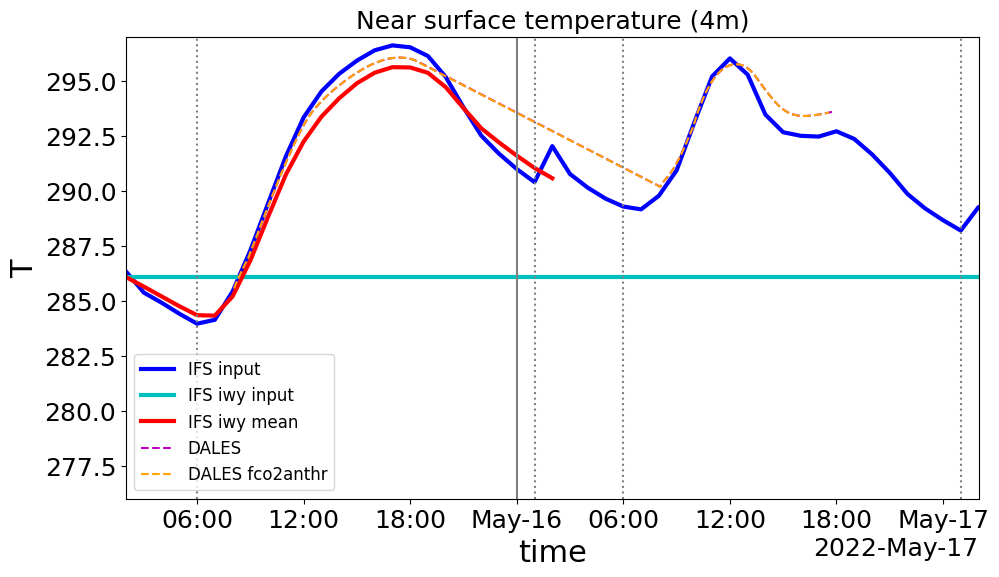

In [ ]:
plt.figure(figsize=[11,6])
input['T'].sel(z=4,method='nearest').plot(c='b',lw=3,label='IFS input')
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'), ds_iyw7['t'].sel(height=40,method='nearest'),c='r',lw=3,label='IFS iwy mean')

# (srf_fc_slab_dict[exp_names[0][0]]['t2m']).isel(time=slice(0,48)).plot(x='time',lw=3,label='IFS (2m)')
# profiles1['T'].sel(zt=4,method='nearest').plot(c='k',label='DALES')
# profiles2['T'].sel(zt=4,method='nearest').plot(c='k')
# profiles['T'].sel(zt=4,method='nearest').plot(c='k',label='DALES')
# profiles_norad['T'].sel(zt=4,method='nearest').plot(c='k',ls=':',label='DALES no-rad')
# profiles_0600lt['T'].sel(zt=4,method='nearest').plot(c='r',ls=':',label='DALES 0600LT')
# profiles_halfhour['T'].sel(zt=4,method='nearest').plot(c='g',ls='--',label='DALES 30min')
# profiles_interpls['T'].sel(zt=4,method='nearest').plot(c='m',ls='--',label='DALES interpls')
profiles_ru08['T'].sel(zt=4,method='nearest').plot(c='m',ls='--',label='DALES')
profiles_fco2anthr['T'].sel(zt=4,method='nearest').plot(c='orange',ls='--',label='DALES fco2anthr')


# imo['t'].sel(level=137).plot(c='r',lw=1,label='imo')

plt.legend()
plt.title('Near surface temperature (4m)',fontsize=18)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylim([276,297])

KeyError: "No variable named 'thlswtend'. Variables on the dataset include ['zt', 'zm', 'time', 'rhof', 'rhobf', ..., 'u_tend_dt', 'v_tend_dt', 'wspd', 'wdir', 'co2_ppm']"

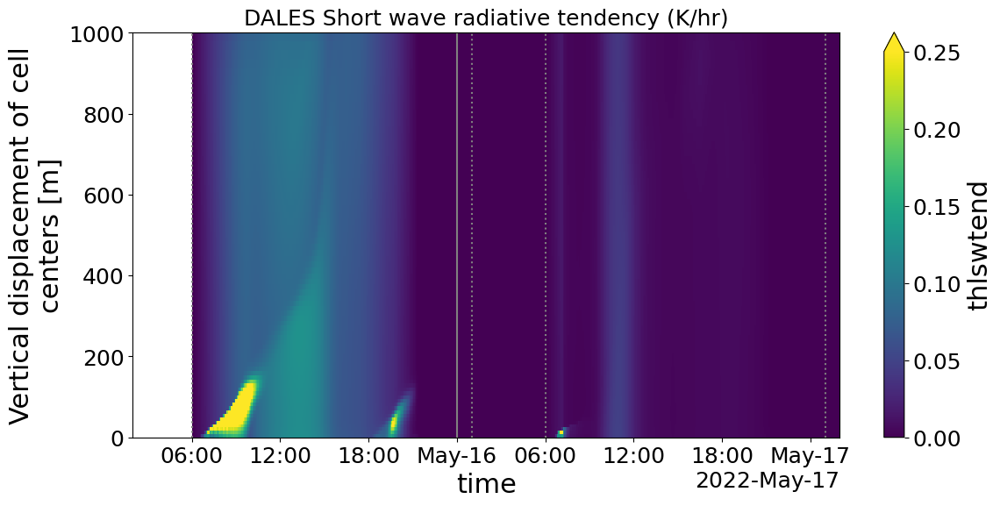

<Figure size 1300x600 with 0 Axes>

In [ ]:
## Short wave tendency
plt.figure(figsize=[13,6])
(profiles['thlswtend']*3600).sel(zt=slice(0,1000)).plot(x='time',vmin=0,vmax=0.25)
plt.title('DALES Short wave radiative tendency (K/hr)', fontsize=18)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')

plt.figure(figsize=[13,6])
(z_fc_slab_dict[exp_names[0][0]]['srta']).sel(height=slice(0,1000)).isel(time=slice(0,48)).plot(x='time',vmin=0,vmax=0.25)
plt.title('IFS Temperature tendency due to short-wave radiation', fontsize=18)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')


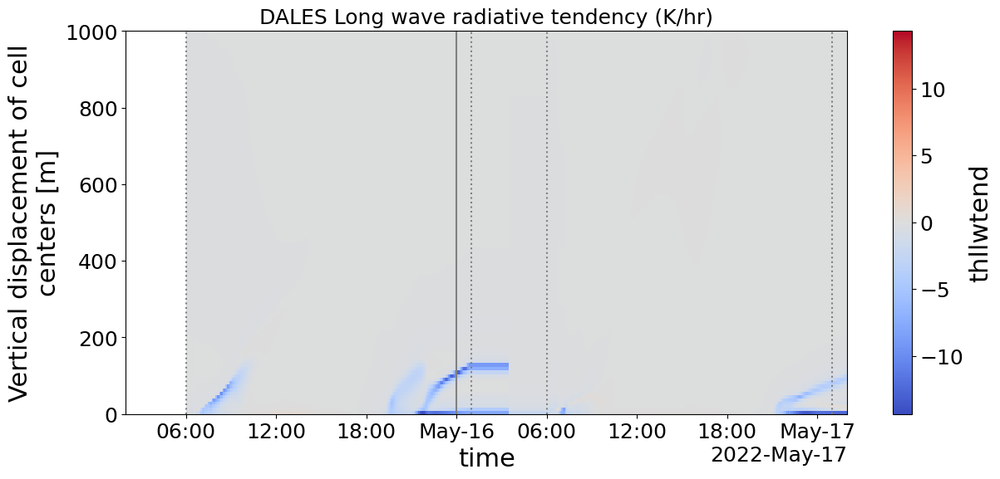

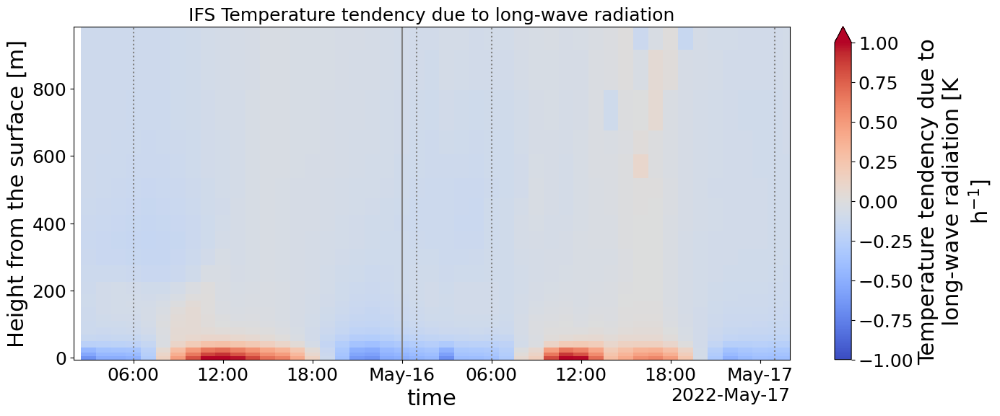

In [16]:
## Long wave tendency
norm = TwoSlopeNorm(vmin=-13, vcenter=0, vmax=1)
plt.figure(figsize=[14,6])
(profiles['thllwtend'] * 3600).sel(zt=slice(0,1000)).plot(
    x='time',
    cmap='coolwarm')
plt.title('DALES Long wave radiative tendency (K/hr)',fontsize=18)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')


plt.figure(figsize=[16,6])
z_fc_slab_dict[exp_names[0][0]]['trta'].sel(height=slice(0,1000)).isel(time=slice(0,48))\
    .plot(x='time',vmin = -1, vmax= 1, cmap='coolwarm')
plt.title('IFS Temperature tendency due to long-wave radiation',fontsize=18)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')


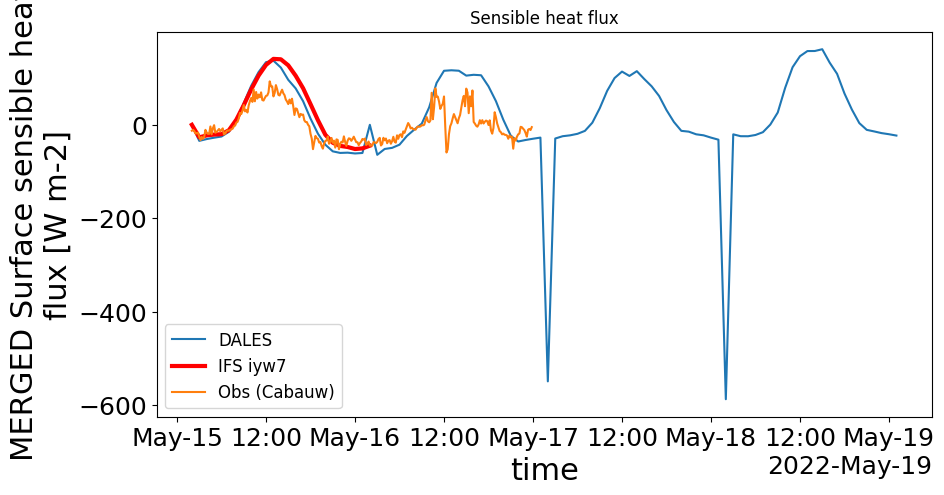

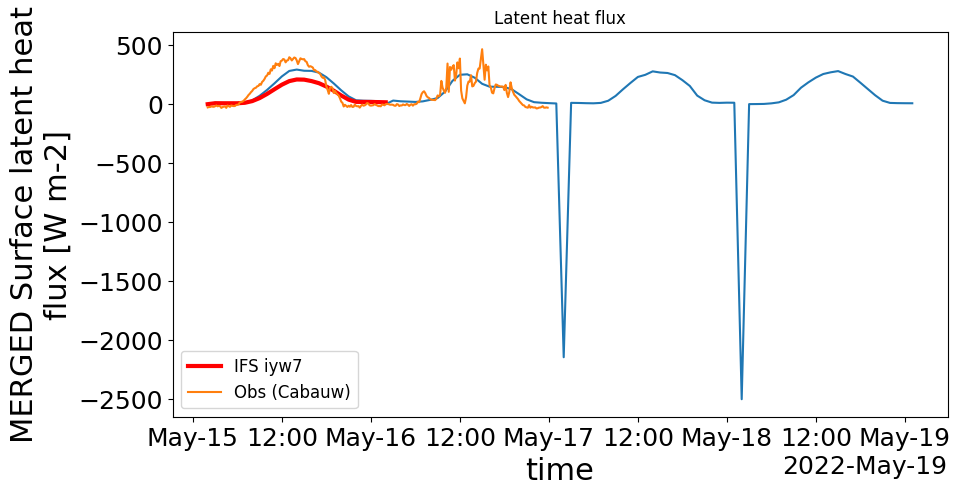

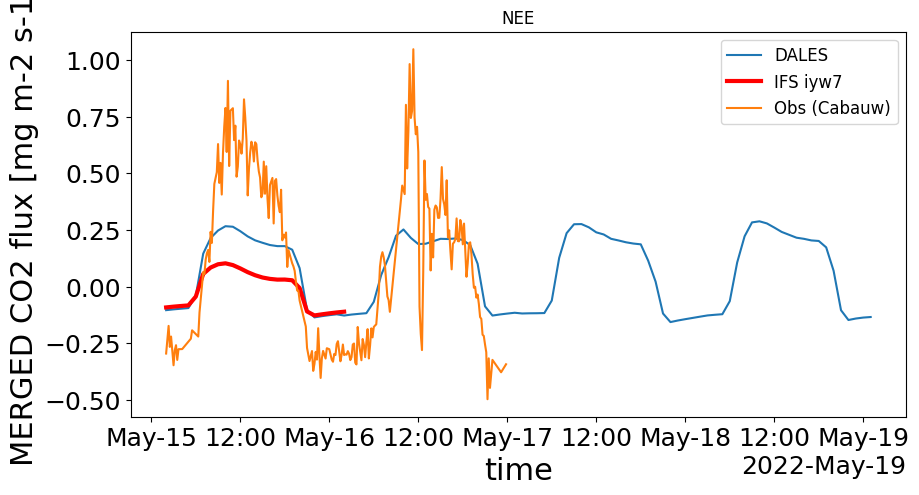

In [ ]:
plt.figure(figsize=(10,5))
input['SH'].plot(label='DALES')
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'), -ds_iyw7['sshf'],c='r',lw=3,label='IFS iyw7')
obs_surf_flx['H'].sel(time=slice('2022-05-15','2022-05-16')).plot(label='Obs (Cabauw)')
plt.title('Sensible heat flux')
plt.legend()

plt.figure(figsize=(10,5))
input['LH'].plot()
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'), -ds_iyw7['slhf'],c='r',lw=3,label='IFS iyw7')
obs_surf_flx['LE'].sel(time=slice('2022-05-15','2022-05-16')).plot(label='Obs (Cabauw)')
plt.title('Latent heat flux')
plt.legend()

plt.figure(figsize=(10,5))
(-1000000*input['fco2nee']).plot(label='DALES')
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'), 1000000*ds_iyw7['fco2nee'],c='r',lw=3,label='IFS iyw7')
(-obs_surf_flx['FC']).sel(time=slice('2022-05-15','2022-05-16')).plot(label='Obs (Cabauw)')
plt.title('NEE')
plt.legend()



In [12]:
from my_functions import concentration_to_ppm

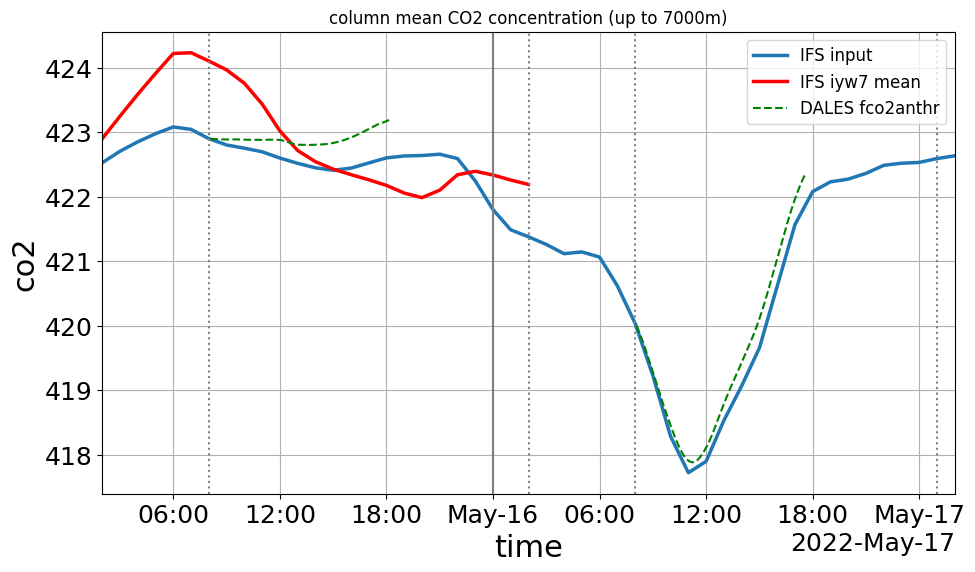

In [ ]:
### column integrated CO2 concentration
z = 7000
## total moisture
plt.figure(figsize=[11,6])
(mfun.concentration_to_ppm('co2',input['co2'])).sel(z=slice(0,z)).mean(dim='z').plot(x='time',label='IFS input',lw=2.5)
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'),(mfun.concentration_to_ppm('co2',ds_iyw7['co2'])).sel(height=slice(0,z)).mean(dim='height'),c='r',lw=2.5,label='IFS iyw7 mean')

# (z_fc_slab_dict['ctrl']['co2']).sel(height=slice(0,z)).mean(dim='height').isel(time=slice(0,48)).plot(x='time',label='IFS ctrl',lw=2, ls='-')
# (z_fc_slab_dict['ctrl_9km']['co2']).sel(height=slice(0,z)).mean(dim='height').isel(time=slice(0,48)).plot(x='time',label='IFS ctrl 9km',lw=2, ls=':')


# (concentration_to_ppm('co2',profiles_ru08['co2'])).sel(zt=slice(0,z)).mean(dim='zt').sel(time=slice(np.datetime64('2022-05-15'),np.datetime64('2022-05-15T20'))).plot(x='time',label='DALES ru 0.8',ls='--',c='orange')
# (concentration_to_ppm('co2',profiles_ru08['co2'])).sel(zt=slice(0,z)).mean(dim='zt').sel(time=slice(np.datetime64('2022-05-16'),np.datetime64('2022-05-16T20'))).plot(x='time',ls='--',c='orange')
(mfun.concentration_to_ppm('co2',profiles_fco2anthr['co2'])).sel(zt=slice(0,z)).mean(dim='zt').sel(time=slice(np.datetime64('2022-05-15'),np.datetime64('2022-05-15T20'))).plot(x='time',label='DALES fco2anthr',ls='--',c='g')
(mfun.concentration_to_ppm('co2',profiles_fco2anthr['co2'])).sel(zt=slice(0,z)).mean(dim='zt').sel(time=slice(np.datetime64('2022-05-16'),np.datetime64('2022-05-16T20'))).plot(x='time',ls='--',c='g')

plt.legend()
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T02:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T08:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T08:00:00'),c='grey',ls=':')
plt.title(f"column mean CO2 concentration (up to {z}m)")

plt.grid()

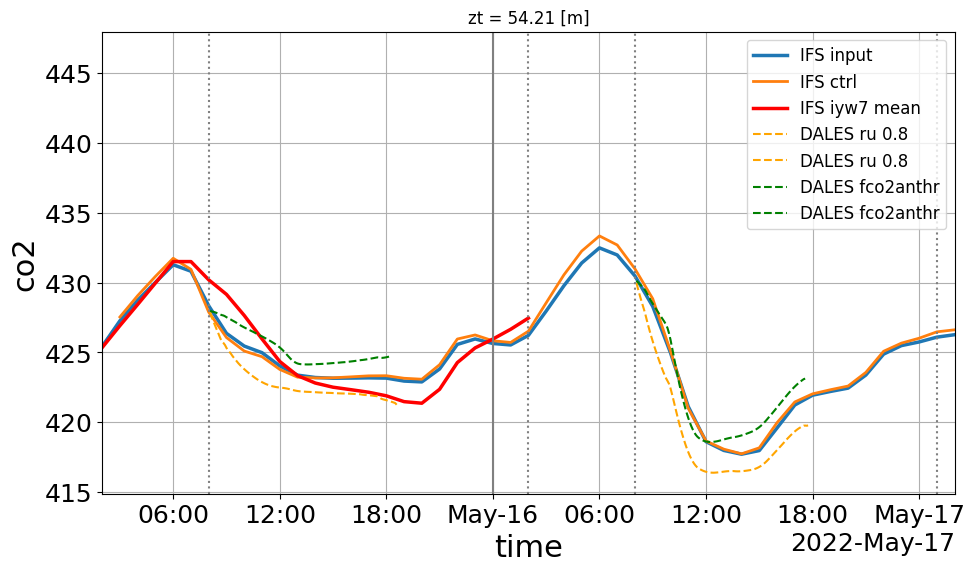

In [50]:
z = 50
## total moisture
plt.figure(figsize=[11,6])
(concentration_to_ppm('co2',input['co2'])).sel(z=z,method='nearest').plot(x='time',label='IFS input',lw=2.5)
(z_fc_slab_dict['ctrl']['co2']).sel(height=z,method='nearest').isel(time=slice(0,48)).plot(x='time',label='IFS ctrl',lw=2, ls='-')
plt.plot(ds_mean.time + ds_mean.step+np.timedelta64(2,'h'), (mfun.concentration_to_ppm('co2',ds_mean['co2'])).sel(height=z,method='nearest'),c='r',lw=2.5,label='IFS iyw7 mean')

# (profiles_norad['qt']*1000).sel(zt=z,method='nearest').plot(x='time',label='DALES no rad')
# (profiles_0600lt['qt']*1000).sel(zt=z,method='nearest').plot(x='time',label='DALES 006LT')
# (profiles_halfhour['qt']*1000).sel(zt=z,method='nearest').plot(x='time',label='DALES 30min',ls='--')
# (profiles_interpls['qt']*1000).sel(zt=z,method='nearest').plot(x='time',label='DALES interpls',ls='--')
# (profiles_ru1['co2']*1000).sel(zt=z,method='nearest').plot(x='time',label='DALES ru 1',ls='-')
(concentration_to_ppm('co2',profiles_ru08['co2'])).sel(zt=z,method='nearest').sel(time=slice(np.datetime64('2022-05-15'),np.datetime64('2022-05-15T20'))).plot(x='time',label='DALES ru 0.8',ls='--',c='orange')
(concentration_to_ppm('co2',profiles_ru08['co2'])).sel(zt=z,method='nearest').sel(time=slice(np.datetime64('2022-05-16'),np.datetime64('2022-05-16T20'))).plot(x='time',label='DALES ru 0.8',ls='--',c='orange')
(concentration_to_ppm('co2',profiles_fco2anthr['co2'])).sel(zt=z,method='nearest').sel(time=slice(np.datetime64('2022-05-15'),np.datetime64('2022-05-15T20'))).plot(x='time',label='DALES fco2anthr',ls='--',c='g')
(concentration_to_ppm('co2',profiles_fco2anthr['co2'])).sel(zt=z,method='nearest').sel(time=slice(np.datetime64('2022-05-16'),np.datetime64('2022-05-16T20'))).plot(x='time',label='DALES fco2anthr',ls='--',c='g')

plt.legend()
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T02:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T08:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T08:00:00'),c='grey',ls=':')

plt.grid()

In [22]:
input['rho'] = mfun.calc_rho(input['p'], input['T'], input['qt'])
ds_iyw7['rho'] = mfun.calc_rho(ds_iyw7['p'],ds_iyw7['t'],ds_iyw7['qt'])

In [21]:
ds_iyw7

<xarray.Dataset> Size: 83kB
Dimensions:          (step: 25, height: 41)
Coordinates:
    number           int64 8B ...
    time             datetime64[ns] 8B ...
  * step             (step) timedelta64[ns] 200B 00:00:00 ... 1 days 00:00:00
    surface          float64 8B ...
    valid_time       (step) datetime64[ns] 200B ...
  * height           (height) float64 328B 0.0 20.0 40.0 ... 5e+03 5.5e+03 6e+03
Data variables: (12/25)
    skt              (step) float32 100B 283.9 283.8 283.2 ... 288.9 288.3 287.9
    sshf             (step) float32 100B 0.0 26.92 22.6 ... 51.82 50.48 44.74
    slhf             (step) float32 100B 0.0 -8.106 -7.531 ... -17.5 -15.93
    fco2nee          (step) float32 100B -9.232e-08 -8.894e-08 ... -1.113e-07
    co2_emiss_tot    (step) float32 100B -2.617e-08 -1.015e-07 ... -1.268e-07
    w                (step, height) float32 4kB -0.01159 -0.008704 ... -0.05778
    ...               ...
    LW_heating_rate  (step, height) float32 4kB 0.0 0.0 0.0 ... -1.346 -1.335
    u                (step, height) float32 4kB -2.324 -3.118 ... 3.326 3.483
    v                (step, height) float32 4kB -0.8232 -1.027 ... 8.806 7.173
    ql               (step, height) float32 4kB 0.0 0.0 ... 4.287e-06 1.095e-05
    qt               (step, height) float32 4kB 0.007005 0.006958 ... 0.001631
    p                (step, height) float32 4kB 1.021e+05 ... 4.949e+04
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-02-03T11:05 GRIB to CDM+CF via cfgrib-0.9.1...

In [62]:
input

<xarray.Dataset> Size: 3MB
Dimensions:              (time: 96, z: 180, zs: 4, lev: 138, lay: 137)
Coordinates:
  * time                 (time) datetime64[ns] 768B 2022-05-15T02:00:00 ... 2...
  * z                    (z) float64 1kB 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zs                   (zs) float64 32B -0.035 -0.175 -0.64 -1.945
  * lev                  (lev) int64 1kB 0 1 2 3 4 5 ... 132 133 134 135 136 137
  * lay                  (lay) int64 1kB 0 1 2 3 4 5 ... 131 132 133 134 135 136
Data variables: (12/34)
    thl                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    T                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    qt                   (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    u                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    v                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wls                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    ...                   ...
    fco2rec              (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    h2o_lay              (time, lay) float64 105kB dask.array<chunksize=(96, 137), meta=np.ndarray>
    co2_antrop_emission  (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    wspd                 (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wdir                 (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    rho                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
Attributes:
    fc:           0.00011487960315944262
    central_lon:  4.927
    central_lat:  51.971
    area:         0.75°×0.75° spatial average
    source:       IFS + (LS)²D
    description:  Generated by (LS)²D (adapted): https://github.com/LS2D & ht...
    reference:    van Stratum et al. (2023). The benefits and challenges of d...

Text(0.5, 1.0, 'CO$_2$ emissions in IFS')

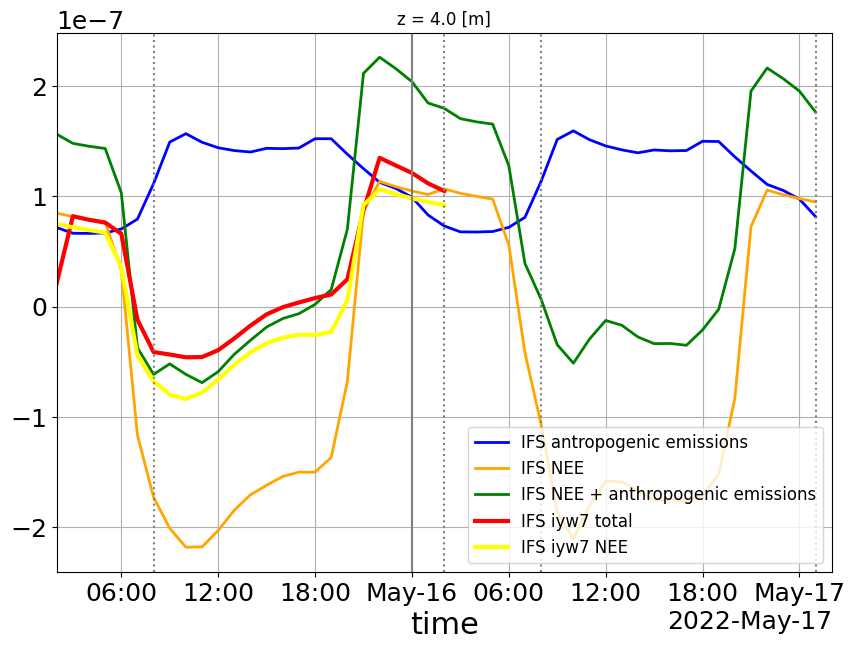

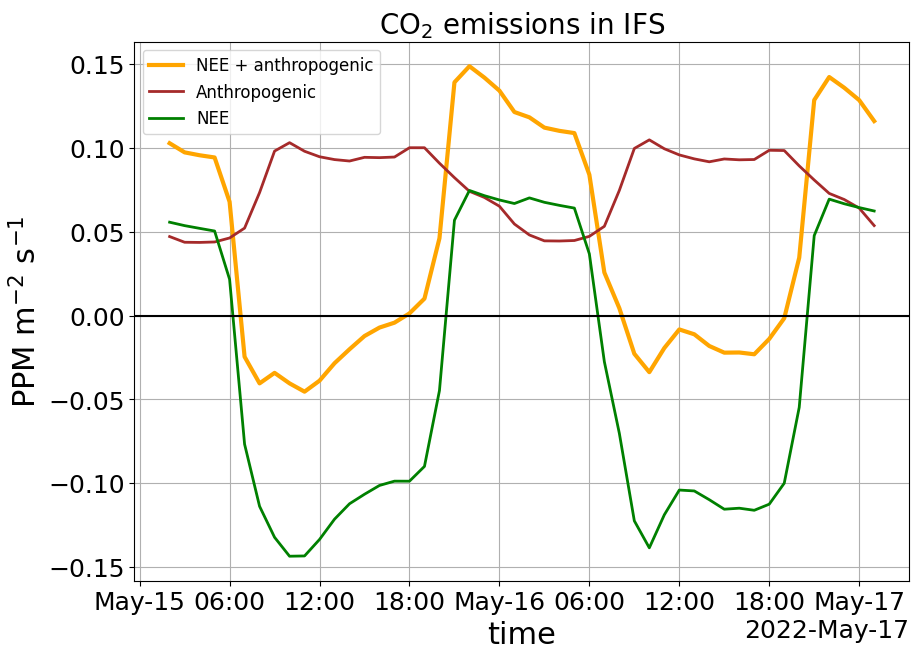

In [26]:
plt.figure()
(input['co2_antrop_emission']/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(label='IFS antropogenic emissions', lw=2, c= 'b')
(input['fco2nee']/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(label='IFS NEE', lw=2 ,c='orange')
((input['fco2nee'] + input['co2_antrop_emission'])/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(label='IFS NEE + anthropogenic emissions', lw=2,c='g')
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'), (-ds_iyw7['co2_emiss_tot']/ds_iyw7['rho']).isel(height=0),c='r',lw=3,label='IFS iyw7 total')
plt.plot(ds_iyw7.time + ds_iyw7.step+np.timedelta64(2,'h'), (-ds_iyw7['fco2nee']/ds_iyw7['rho']).isel(height=0),c='yellow',lw=3,label='IFS iyw7 NEE')


plt.grid()
plt.legend()
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T02:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T08:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T08:00:00'),c='grey',ls=':')

plt.figure()
concentration_to_ppm('co2',(input['fco2nee'] + input['co2_antrop_emission'])/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(label='NEE + anthropogenic', lw=3,c='orange')
(concentration_to_ppm('co2',input['co2_antrop_emission'])/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(label='Anthropogenic', lw=2, c= 'brown')
(concentration_to_ppm('co2',input['fco2nee'])/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(label='NEE', lw=2 ,c='g')
# (-srf_fc_slab_dict['ctrl']['fco2nee']/input['rho'].isel(z=0)).isel(time=slice(0,48)).plot(x='time',label='IFS ctrl',lw=2, ls='--',c='orange')
plt.axhline(0,c='k')
plt.grid()  
plt.legend()
plt.ylabel(r'PPM m$^{-2}$ s$^{-1}$')
plt.title(f"CO$_2$ emissions in IFS",fontsize=20)


  

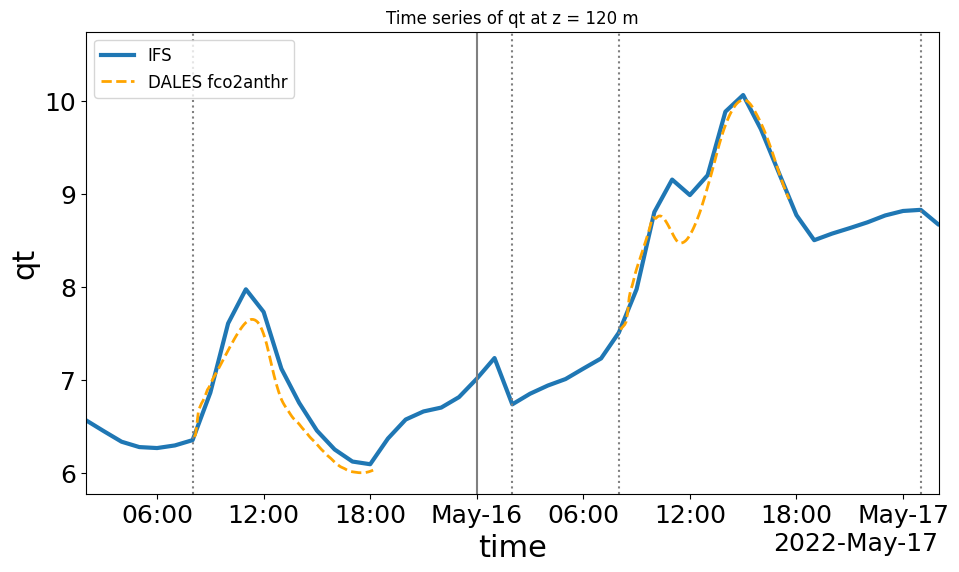

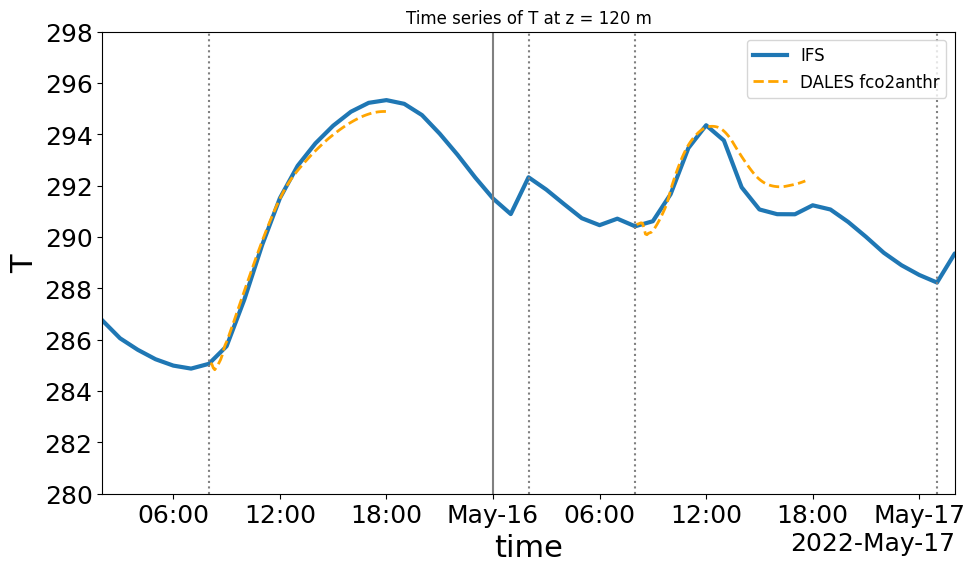

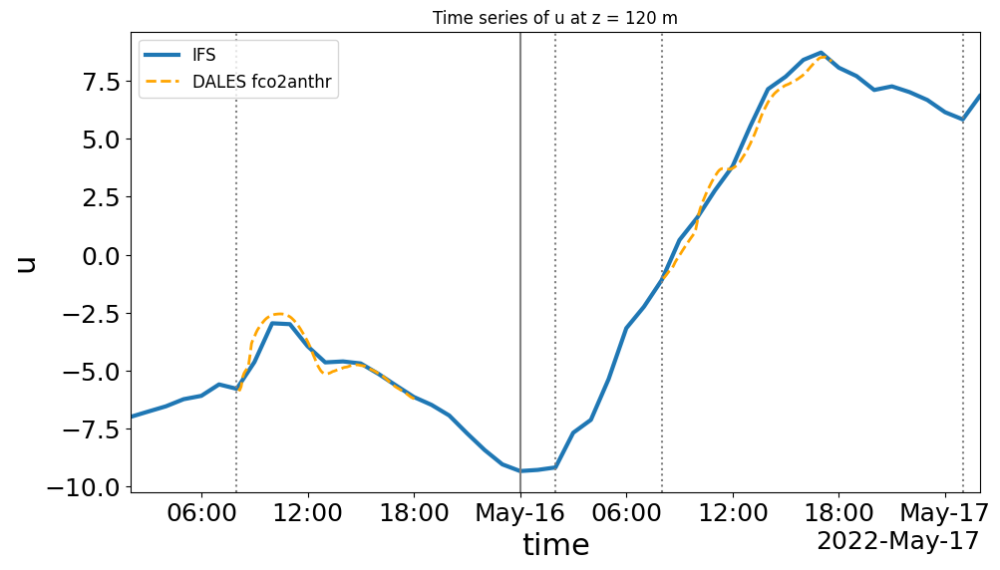

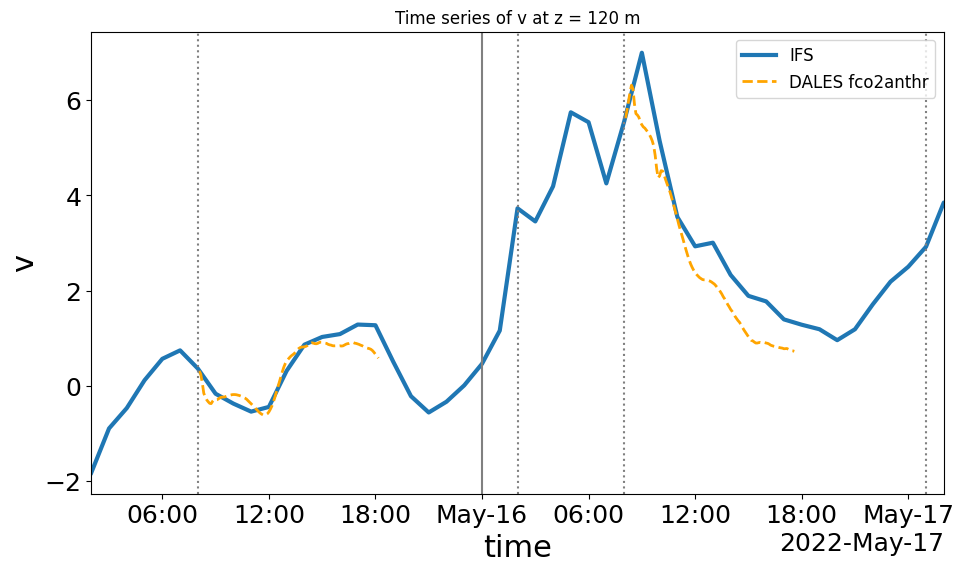

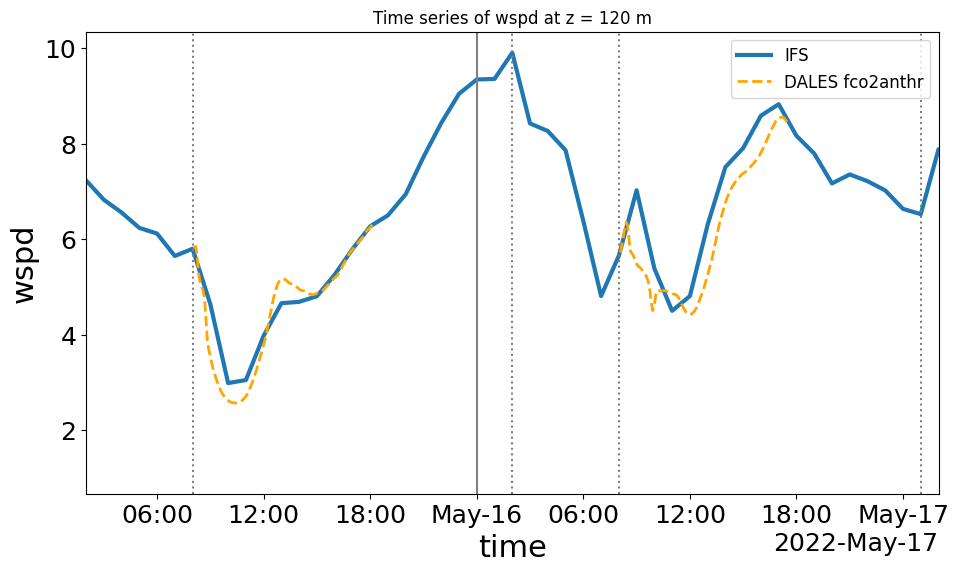

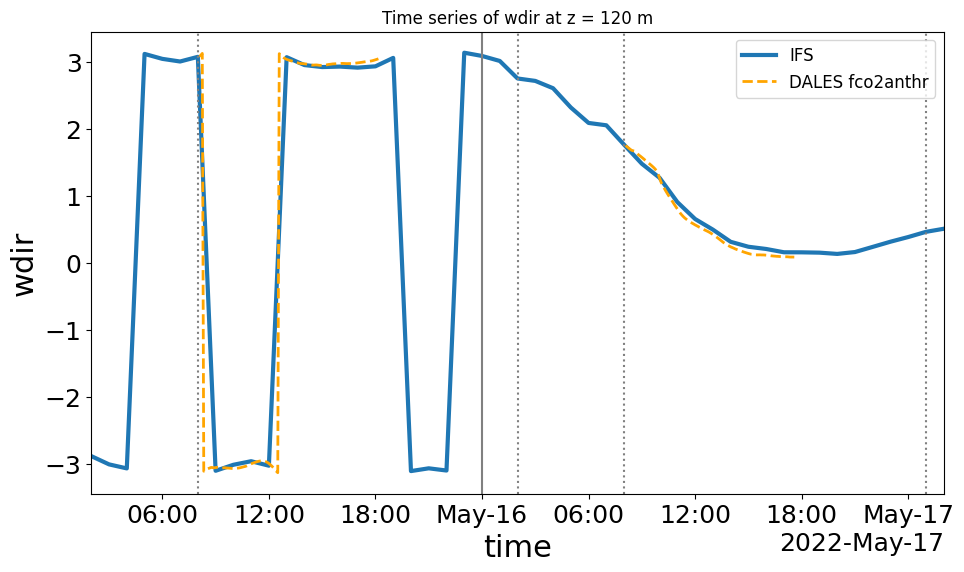

In [11]:
# --- Common settings ---
time_start = np.datetime64('2022-05-15T02:00:00')
time_end = np.datetime64('2022-05-17T02:00:00')
vertical_lines = [
    (np.datetime64('2022-05-16T00:00:00'), 'grey', '-'),
    (np.datetime64('2022-05-16T02:00:00'), 'grey', ':'),
    (np.datetime64('2022-05-17T01:00:00'), 'grey', ':'),
    (np.datetime64('2022-05-15T08:00:00'), 'grey', ':'),
    (np.datetime64('2022-05-16T08:00:00'), 'grey', ':')
]

def plot_variable(var, z, factor=1.0, ylim=None):
    """
    Plot a given variable at height `z` for all datasets.
    Parameters
    ----------
    var : str
        Variable name to plot (e.g., 'qt', 'T', 'u', 'v', 'wspd', 'wdir').
    z : float
        Height level to select (nearest).
    factor : float, optional
        Scaling factor applied to the data before plotting (default is 1).
        Example: use 1000 for qt to convert kg/kg -> g/kg.
    ylim : tuple, optional
        y-axis limits, e.g., (0, 10).
    """
    plt.figure(figsize=[11, 6])
    # --- Apply scaling factor ---
    input_data = input[var] * factor
    ru1_data = profiles_ru1[var] * factor
    ru08_data = profiles_ru08[var] * factor
    fco2anthr_data = profiles_fco2anthr[var] * factor
    

    # --- Base IFS input ---
    input_data.sel(z=z, method='nearest').plot(x='time', label='IFS', lw=3)

    # --- DALES ru 1 ---
    # ru1_data.sel(zt=z, method='nearest').plot(x='time', label='DALES ru 1', ls='-')
    # --- DALES ru 0.8 split into two time windows (only one label) ---
    time_windows = [
        ('2022-05-15', '2022-05-15T20'),
        ('2022-05-16', '2022-05-16T20')
    ]
    # for i, (start, end) in enumerate(time_windows):
    #     label = 'DALES' if i == 0 else None  # Label only first segment
    #     ru08_data.sel(zt=z, method='nearest').sel(
    #         time=slice(np.datetime64(start), np.datetime64(end))
    #     ).plot(x='time', label=label, ls='--', c='r',lw=2)

    for i, (start, end) in enumerate(time_windows):
        label = 'DALES fco2anthr' if i == 0 else None  # Label only first segment
        fco2anthr_data.sel(zt=z, method='nearest').sel(
            time=slice(np.datetime64(start), np.datetime64(end))
        ).plot(x='time', label=label, ls='--', c='orange',lw=2)


    # # --- Loobos observations (only for wind speed and wind direction) ---
    # if var == 'wspd':
    #     ds_loobos['Meteorology']['WS_2_1_1'].resample(time="1H").mean().sel(
    #         time=slice('2022-05-15', '2022-05-17')
    #     ).plot(x='time', label='Loobos obs', c='k', lw=2, ls=':')
    # elif var == 'wdir':
    #     ds_loobos['Meteorology']['WD_2_1_1'].resample(time="1H").mean().sel(
    #         time=slice('2022-05-15', '2022-05-17')
    #     ).plot(x='time', label='Loobos obs', c='k', lw=2, ls=':')

    # --- Formatting ---
    plt.legend()
    plt.xlim([time_start, time_end])
    # Vertical reference lines
    for x, colour, style in vertical_lines:
        plt.axvline(x, c=colour, ls=style)
    if ylim:
        plt.ylim(ylim)
    plt.title(f"Time series of {var} at z = {z} m")

# --- Example usage ---
z = 120

# qt with factor 1000 (kg/kg → g/kg)
plot_variable('qt', z, factor=1000,)
# Other variables with factor 1 (no scaling)
plot_variable('T', z, factor=1, ylim=(280, 298))
plot_variable('u', z, factor=1)
plot_variable('v', z, factor=1)
plot_variable('wspd', z, factor=1)
plot_variable('wdir', z, factor=1)

In [38]:
input

<xarray.Dataset> Size: 3MB
Dimensions:              (time: 96, z: 180, zs: 4, lev: 138, lay: 137)
Coordinates:
  * time                 (time) datetime64[ns] 768B 2022-05-15T02:00:00 ... 2...
  * z                    (z) float64 1kB 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zs                   (zs) float64 32B -0.035 -0.175 -0.64 -1.945
  * lev                  (lev) int64 1kB 0 1 2 3 4 5 ... 132 133 134 135 136 137
  * lay                  (lay) int64 1kB 0 1 2 3 4 5 ... 131 132 133 134 135 136
Data variables: (12/34)
    thl                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    T                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    qt                   (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    u                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    v                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wls                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    ...                   ...
    fco2rec              (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    h2o_lay              (time, lay) float64 105kB dask.array<chunksize=(96, 137), meta=np.ndarray>
    co2_antrop_emission  (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    wspd                 (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wdir                 (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    rho                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
Attributes:
    fc:           0.00011487960315944262
    central_lon:  4.927
    central_lat:  51.971
    area:         0.75°×0.75° spatial average
    source:       IFS + (LS)²D
    description:  Generated by (LS)²D (adapted): https://github.com/LS2D & ht...
    reference:    van Stratum et al. (2023). The benefits and challenges of d...

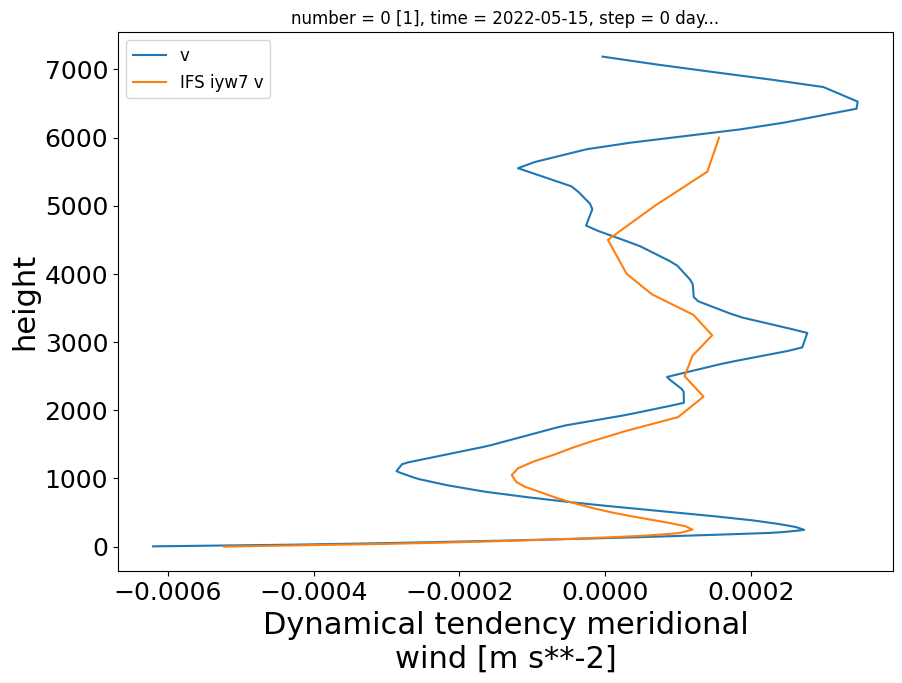

In [42]:
plt.figure()
# input['dTdt_dyn'].isel(time=2).plot(label='T',y='z')
# input['dqdt_dyn'].isel(time=2).plot(label='q',y='z')
# input['dudt_dyn'].isel(time=2).plot(label='u',y='z')
input['dvdt_dyn'].isel(time=2).plot(label='v',y='z')
# input['dco2dt_dyn'].isel(time=2).plot(label='co2',y='z')

# ds_iyw7['dtdt_dyn'].isel(step=4).plot(label='IFS iyw7 T',y='height')
# ds_iyw7['dqdt_dyn'].isel(step=4).plot(label='IFS iyw7 q',y='height')
# ds_iyw7['dudt_dyn'].isel(step=4).plot(label='IFS iyw7 u',y='height')
ds_iyw7['dvdt_dyn'].isel(step=4).plot(label='IFS iyw7 v',y='height')
# ds_iyw7['dco2dt_dyn'].isel(step=4).plot(label='IFS iyw7 co2',y='height')


plt.legend()

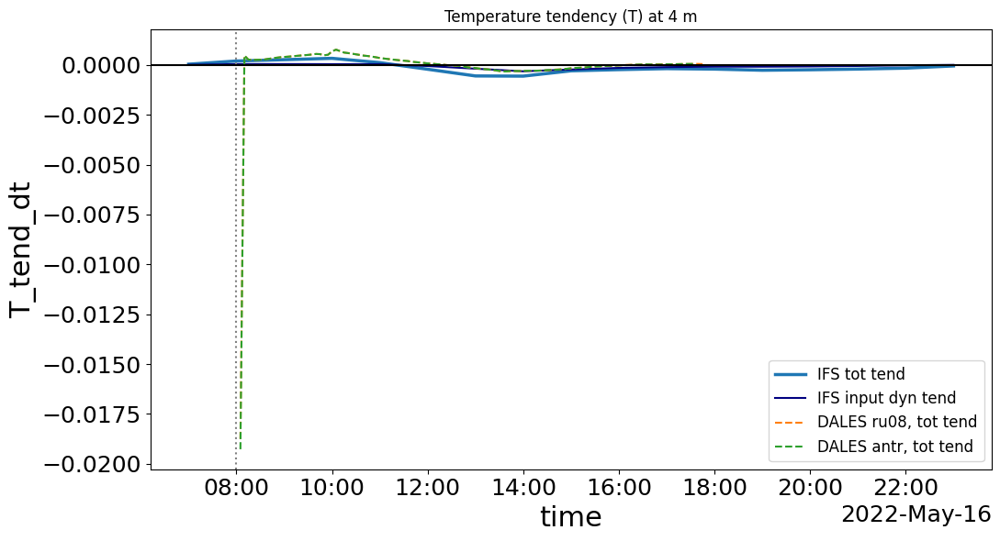

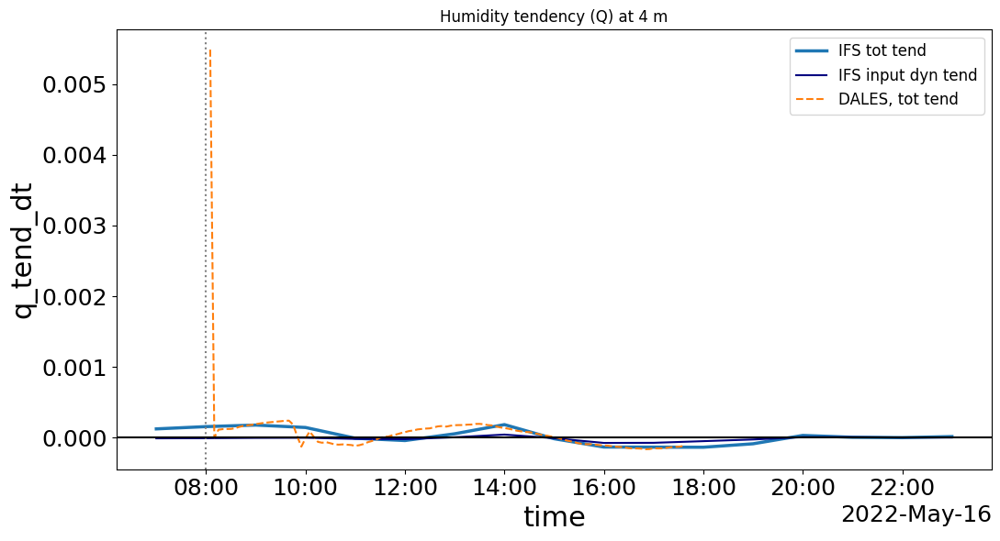

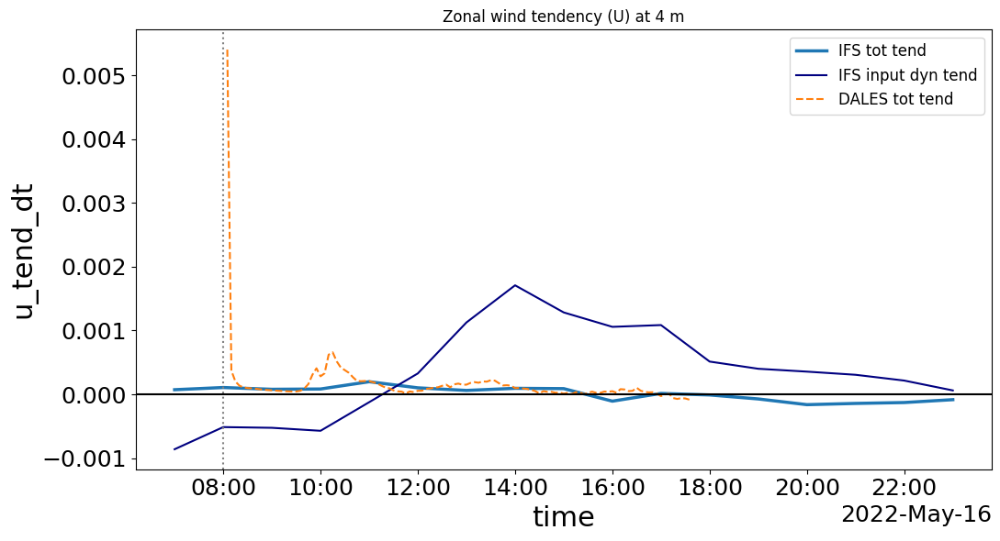

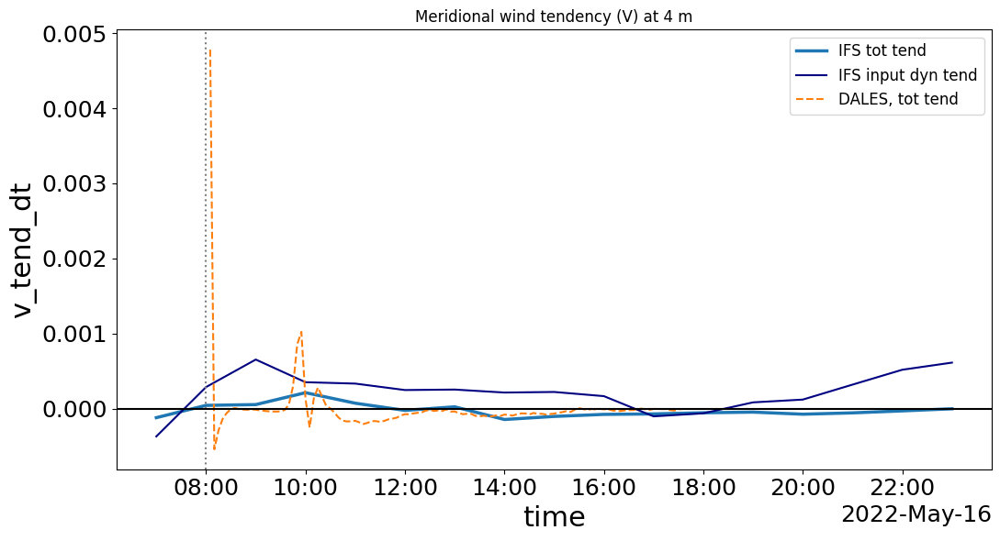

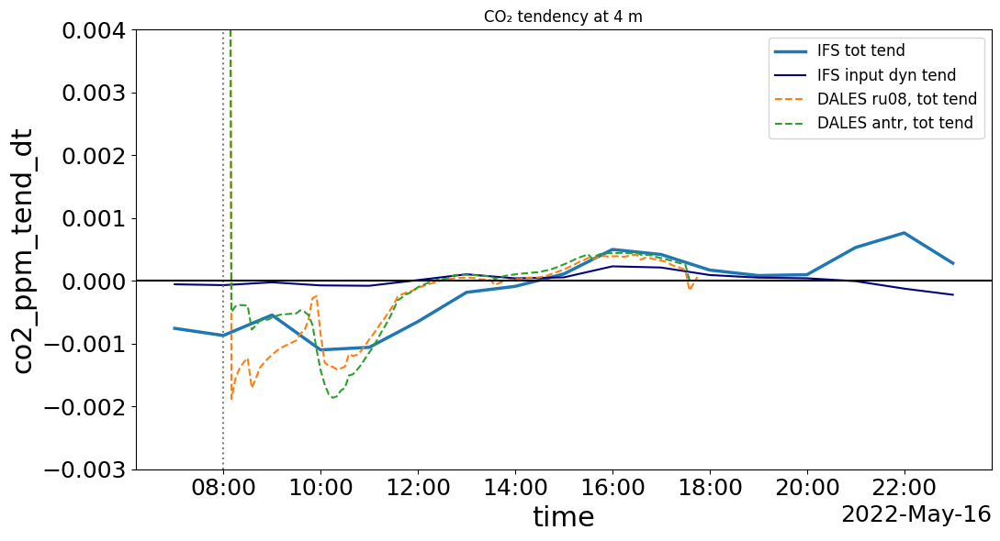

In [87]:
# Define common parameters
time_interval = [np.datetime64('2022-05-16T07:00:00'), np.datetime64('2022-05-16T23:00:00')]
z = 4
exp0 = exp_names[0][0]

def plot_tendency(
    main_var, input_var, profiles, labels, unit_factor=1.0, 
    title=None, add_conversion=None, ylim=None
):
    """
    General plotting function for tendencies.
    """
    plt.figure(figsize=[11, 6])

    # Main IFS total tendency
    (z_fc_slab_dict[exp0][main_var] / 3600).sel(height=z, method='nearest')\
        .sel(time=slice(*time_interval))\
        .plot(x='time', label='IFS tot tend', lw=2.5)
    # IFS input dynamic tendency
    dyn_data = input[input_var]
    if add_conversion:
        dyn_data = add_conversion(dyn_data)
    (unit_factor * dyn_data).sel(z=z, method='nearest')\
        .sel(time=slice(*time_interval))\
        .plot(x='time', label='IFS input dyn tend', c='navy')
    # DALES profiles
    for profile, label in zip(profiles, labels):
        (unit_factor * profile).sel(zt=z, method='nearest')\
            .sel(time=slice(*time_interval))\
            .plot(x='time', label=label, ls='--')
    # Markers for reference times
    # plt.axvline(np.datetime64('2022-05-16T00:00:00'), c='grey')
    plt.axvline(np.datetime64('2022-05-16T08:00:00'), c='grey', ls=':')
    plt.axhline(0, c='black', ls='-')
    if title:
        plt.title(title + f" at {z} m")
    plt.legend()
    if ylim:
        plt.ylim(ylim)
    plt.tight_layout()

# ----- Plot T -----
plot_tendency(
    main_var='dTdt_tot',
    input_var='dTdt_dyn',
    profiles=[profiles_ru08['T_tend_dt'],profiles_fco2anthr['T_tend_dt']],
    labels=['DALES ru08, tot tend','DALES antr, tot tend'],
    title='Temperature tendency (T)'
)

# ----- Plot Q -----
plot_tendency(
    main_var='dqdt_tot',
    input_var='dqdt_dyn',
    # profiles=[profiles_ru08['q_tend_dt'],],
    profiles=[profiles_fco2anthr['q_tend_dt'],],
    labels=['DALES, tot tend', ],
    unit_factor=1000,
    title='Humidity tendency (Q)'
)

# ----- Plot U -----
plot_tendency(
    main_var='dudt_tot',
    input_var='dudt_dyn',
    # profiles=[profiles_ru08['u_tend_dt'],],
    profiles=[profiles_fco2anthr['u_tend_dt'],],
    labels=['DALES tot tend',],
    title='Zonal wind tendency (U)'
)

# ----- Plot V -----
plot_tendency(
    main_var='dvdt_tot',
    input_var='dvdt_dyn',
    # profiles=[profiles_ru08['v_tend_dt'],],
    profiles=[profiles_fco2anthr['v_tend_dt'],],
    labels=['DALES, tot tend', ],
    title='Meridional wind tendency (V)'
)

# ----- Plot CO₂ -----
plot_tendency(
    main_var='dco2dt_tot',
    input_var='dco2dt_dyn',
    profiles=[profiles_ru08['co2_ppm_tend_dt'],profiles_fco2anthr['co2_ppm_tend_dt'],],
    labels=['DALES ru08, tot tend','DALES antr, tot tend'],
    add_conversion=lambda data: mfun.concentration_to_ppm('co2', data),
    title='CO₂ tendency',
    ylim=[-0.003,0.004]
)

(-0.003, 6000.0)

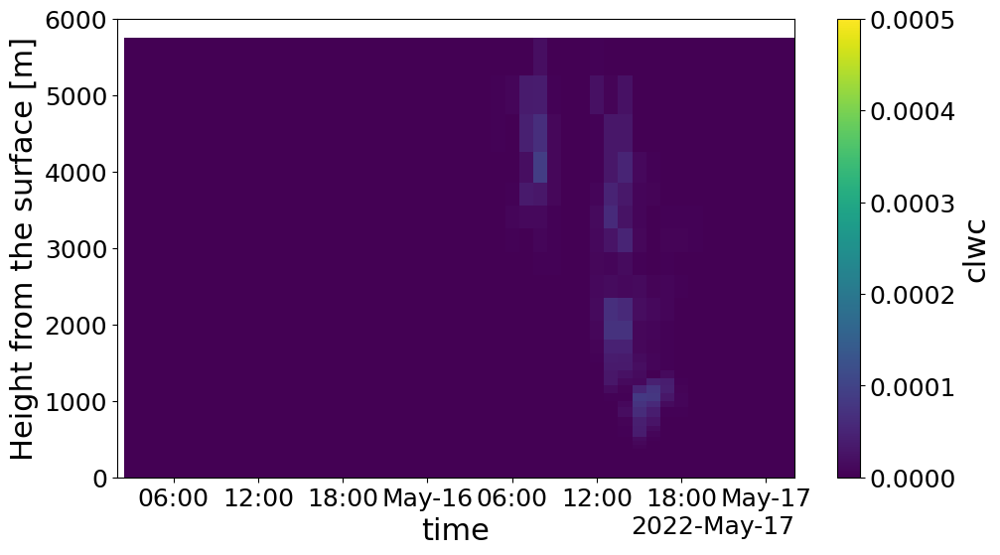

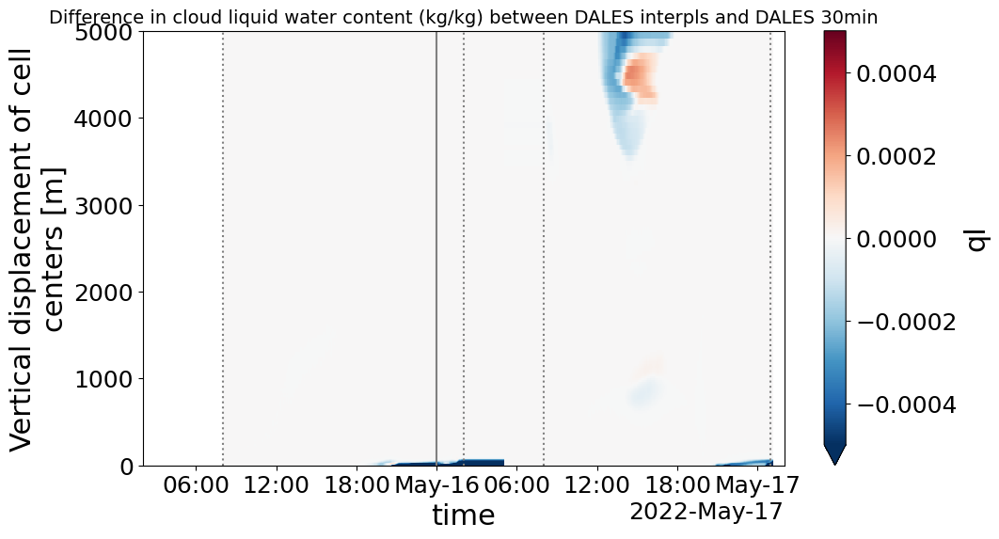

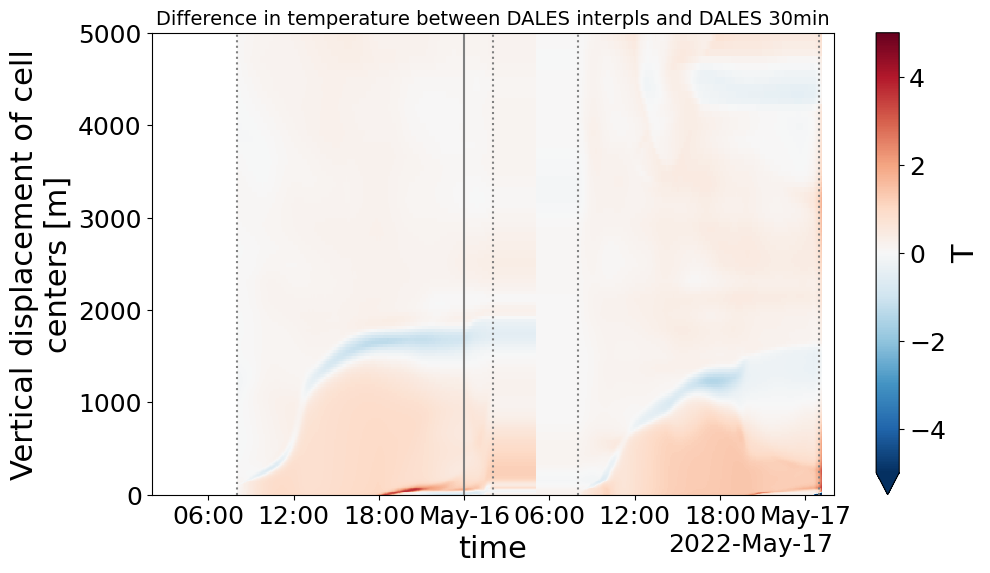

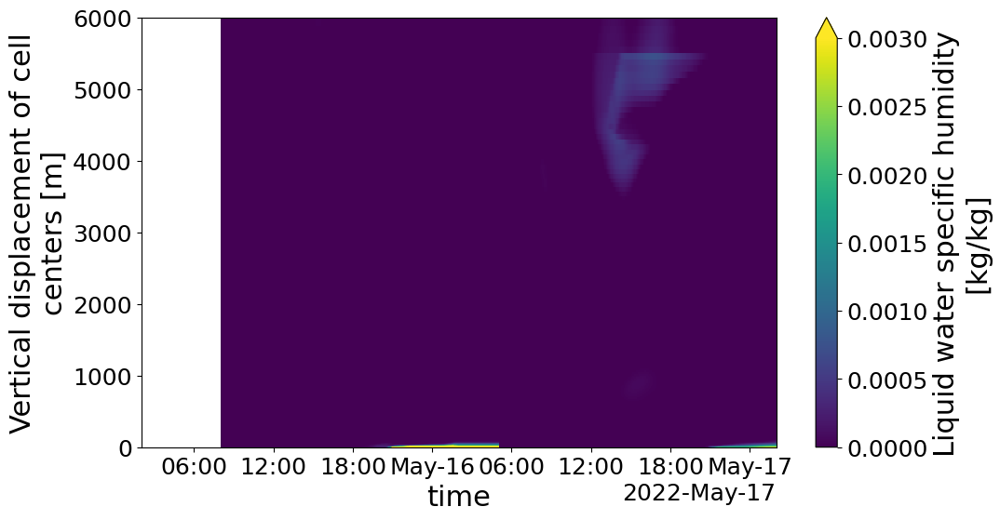

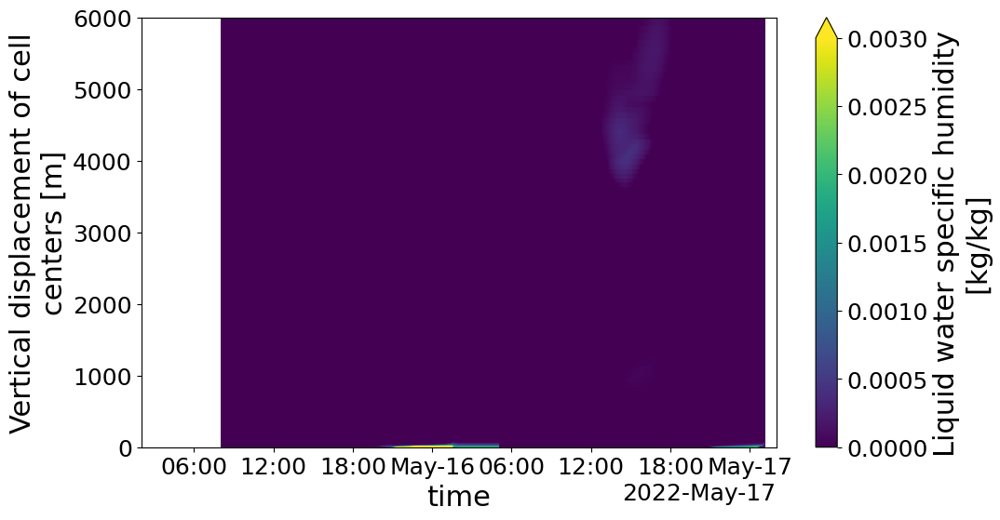

In [65]:
plt.figure(figsize=[11,6])
(z_fc_slab_dict[exp_names[0][0]]['clwc']/1000).isel(time=slice(0,48)).plot(x='time',vmax=0.0005)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])   
plt.ylim([-0.003,6000])

# plt.figure(figsize=[11,6])
# profiles['ql'].plot(x='time',vmax=0.003)
# plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
# plt.ylim([-0.003,6000])

# plt.figure(figsize=[11,6])
# profiles_norad['ql'].plot(x='time',vmax=0.003)
# plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
# plt.ylim([-0.003,6000])

# plt.figure(figsize=[11,6])
# profiles_0600lt['ql'].plot(x='time',vmax=0.003)
# plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
# plt.ylim([-0.003,6000])

plt.figure(figsize=[11,6])
(profiles_interpls['ql'] - profiles_halfhour['ql']) .plot(x='time',vmax=0.0005)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.ylim([-0.003,5000])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T02:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T08:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T08:00:00'),c='grey',ls=':')
plt.title('Difference in cloud liquid water content (kg/kg) between DALES interpls and DALES 30min', fontsize=14)

plt.figure(figsize=[11,6])
(profiles_interpls['T'] - profiles_halfhour['T']) .plot(x='time',vmax=5)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.ylim([-0.003,5000])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T02:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T08:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T08:00:00'),c='grey',ls=':')
plt.title('Difference in temperature between DALES interpls and DALES 30min', fontsize=14)


plt.figure(figsize=[11,6])
profiles_halfhour['ql'].plot(x='time',vmax=0.003)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.ylim([-0.003,6000])

plt.figure(figsize=[11,6])
profiles_interpls['ql'].plot(x='time',vmax=0.003)
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.ylim([-0.003,6000])

In [14]:
profiles_fco2anthr

<xarray.Dataset> Size: 12MB
Dimensions:          (zt: 180, zm: 180, time: 237)
Coordinates:
  * zt               (zt) float32 720B 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zm               (zm) float32 720B 0.0 8.0 16.12 ... 7.017e+03 7.13e+03
  * time             (time) datetime64[ns] 2kB 2022-05-15T08:05:00 ... 2022-0...
Data variables: (12/70)
    rhof             (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    rhobf            (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    rhobh            (time, zm) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    presh            (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    u                (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    v                (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    ...               ...
    u_tend_dt        (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    v_tend_dt        (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    wspd             (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    wdir             (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    co2_ppm          (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    co2_ppm_tend_dt  (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
Attributes:
    title:    profiles.001.nc
    history:  Created on 20251017 at 100931.390
    Source:   DALES 4.4.2 git: v4.4.1-989-geae6c4-dirty
    Author:

Text(0.5, 0, 'K')

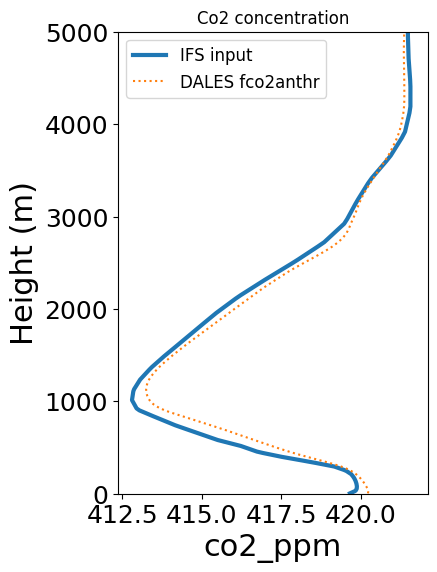

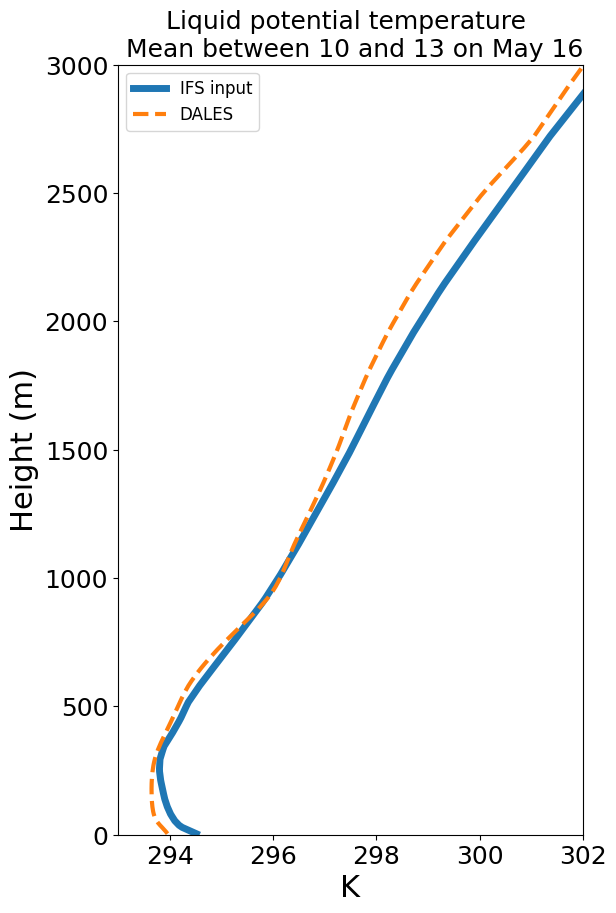

In [59]:
#mean profiles
time_interval = [np.datetime64('2022-05-16T10:05:00'),np.datetime64('2022-05-16T12:50:00')]

var = 'co2'
plt.figure(figsize=[4,6])
mfun.concentration_to_ppm('co2',input['co2']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='IFS input',lw=3)
# profiles_ru08['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 0.8',ls='--')
profiles_fco2anthr['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES fco2anthr',ls=':')
plt.title('Co2 concentration')
plt.legend()
plt.ylabel('Height (m)')
plt.ylim([0,5000])

var = 'thl'
plt.figure(figsize=[6,10])
input['thl'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='IFS input',lw=5)
profiles_fco2anthr['thl'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES',ls='--',lw=3)
plt.title(f"Liquid potential temperature \n Mean between 10 and 13 on May 16",fontsize=18)
plt.legend()
plt.ylabel('Height (m)')
plt.ylim([0,3000])
plt.xlim([293,302])
plt.xlabel("K")


In [37]:
profiles_fco2anthr

<xarray.Dataset> Size: 12MB
Dimensions:          (zt: 180, zm: 180, time: 237)
Coordinates:
  * zt               (zt) float32 720B 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zm               (zm) float32 720B 0.0 8.0 16.12 ... 7.017e+03 7.13e+03
  * time             (time) datetime64[ns] 2kB 2022-05-15T08:05:00 ... 2022-0...
Data variables: (12/70)
    rhof             (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    rhobf            (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    rhobh            (time, zm) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    presh            (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    u                (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    v                (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    ...               ...
    u_tend_dt        (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    v_tend_dt        (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    wspd             (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    wdir             (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    co2_ppm          (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
    co2_ppm_tend_dt  (time, zt) float32 171kB dask.array<chunksize=(1, 180), meta=np.ndarray>
Attributes:
    title:    profiles.001.nc
    history:  Created on 20251017 at 100931.390
    Source:   DALES 4.4.2 git: v4.4.1-989-geae6c4-dirty
    Author:

IFS time: 2022-05-16T08:00:00.000000000
DALES time: 2022-05-16T08:05:00.000000000
Cabauw time: 2022-05-16T08:00:00.000000000
________________________
IFS time: 2022-05-16T09:00:00.000000000
DALES time: 2022-05-16T09:00:00.000000000
Cabauw time: 2022-05-16T09:00:00.000000000
________________________
IFS time: 2022-05-16T10:00:00.000000000
DALES time: 2022-05-16T10:00:00.000000000
Cabauw time: 2022-05-16T10:00:00.000000000
________________________
IFS time: 2022-05-16T11:00:00.000000000
DALES time: 2022-05-16T11:00:00.000000000
Cabauw time: 2022-05-16T11:00:00.000000000
________________________
IFS time: 2022-05-16T12:00:00.000000000
DALES time: 2022-05-16T12:00:00.000000000
Cabauw time: 2022-05-16T12:00:00.000000000
________________________
IFS time: 2022-05-16T13:00:00.000000000
DALES time: 2022-05-16T13:00:00.000000000
Cabauw time: 2022-05-16T13:00:00.000000000
________________________
IFS time: 2022-05-16T14:00:00.000000000
DALES time: 2022-05-16T14:00:00.000000000
Cabauw time: 2022-

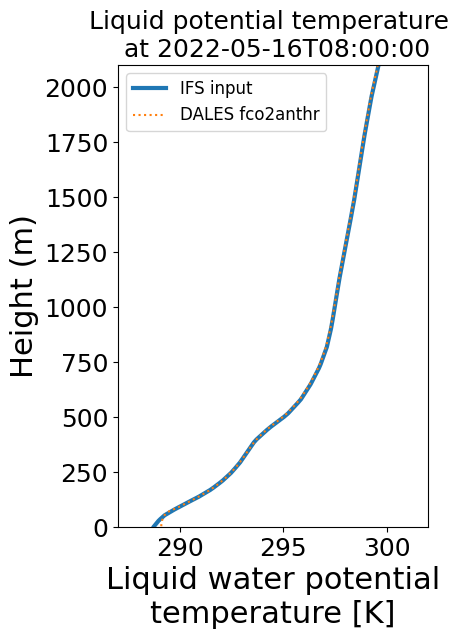

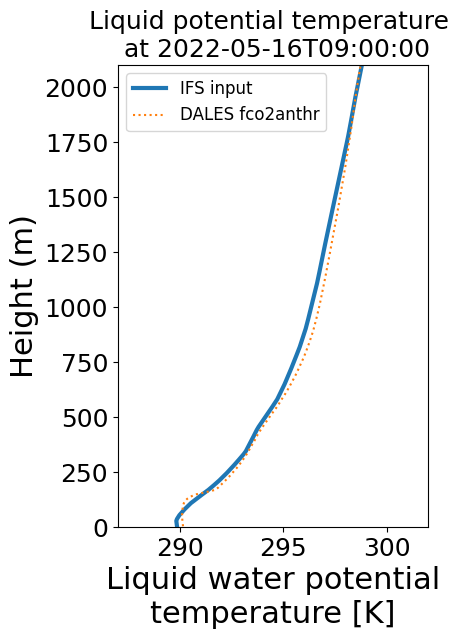

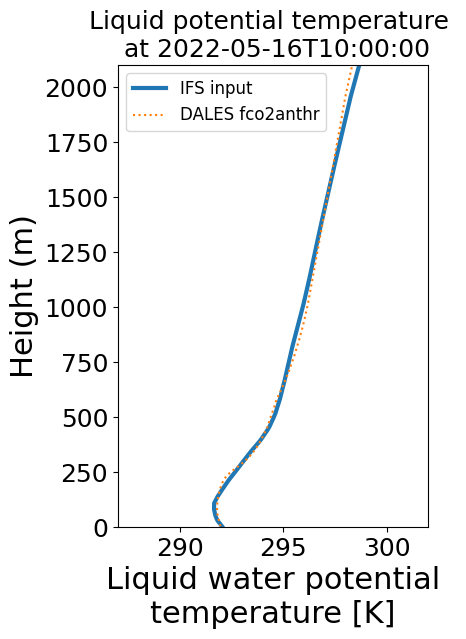

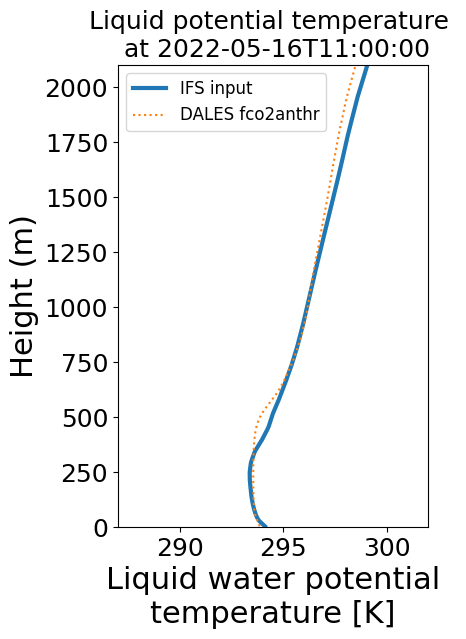

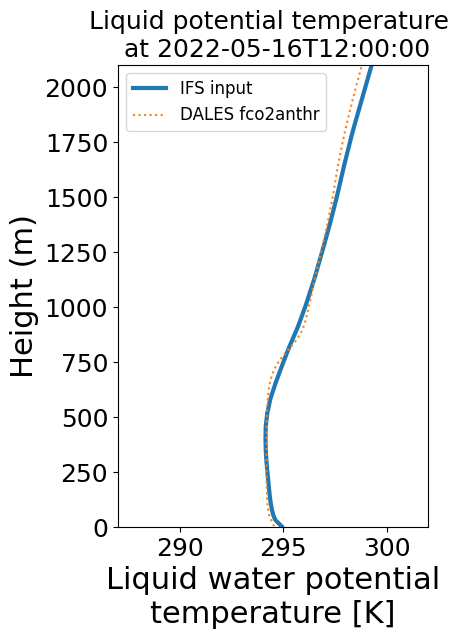

...

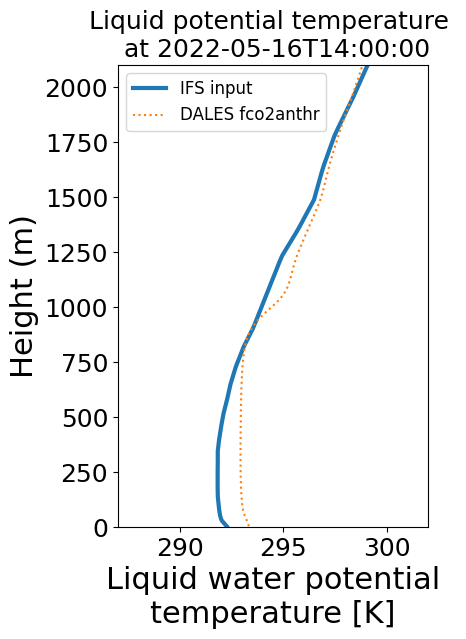

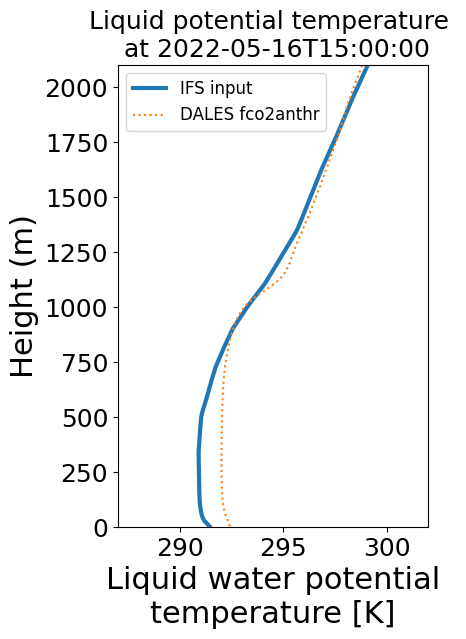

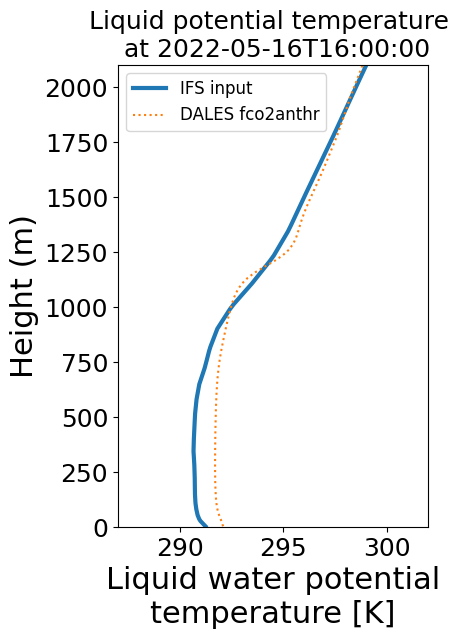

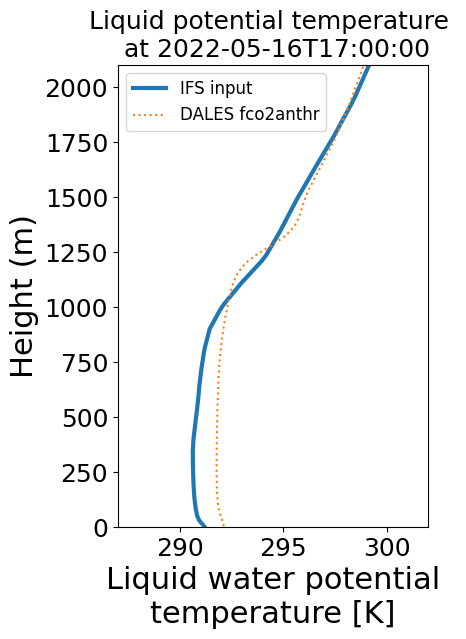

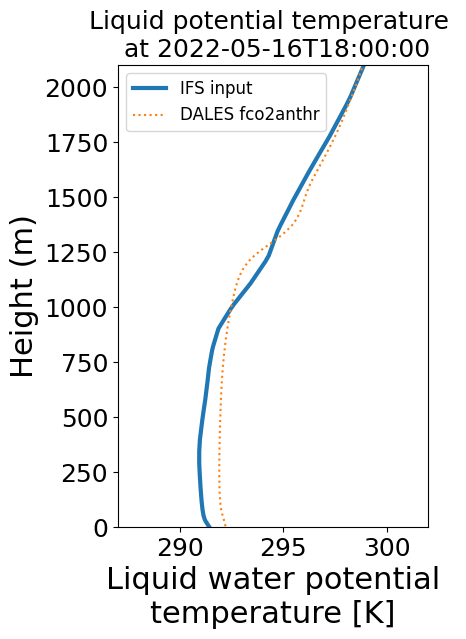

In [42]:
#### potential temperature thl ####

for hour in ['08','09','10','11','12','13','14','15','16','17','18']:
    sel_time = np.datetime64(f'2022-05-16T{hour}:00:00')

    plt.figure(figsize=[4,6])
    input['thl'].sel(time=sel_time,method='nearest').plot(y='z',label='IFS input ',lw=3)
    # (z_fc_slab_dict['ctrl']['co2']).sel(time=sel_time,method='nearest').plot(y='height',label='IFS ctrl',ls='--',c='g',lw=2)

    profiles_fco2anthr['thl'].sel(time=sel_time,method='nearest').plot(y='zt',label='DALES fco2anthr',ls=':')
    # plt.scatter(ds_cabauw['obs_tower_meteo'].sel(time=sel_time,method='nearest')['Q'],ds_cabauw['obs_tower_meteo']['z'],c='r',label='Cabauw')

    plt.title(f'Liquid potential temperature \n at {sel_time}',fontsize=18)
    plt.ylabel('Height (m)')
    plt.legend()
    plt.ylim([0,2100])
    plt.xlim([287,302])

    print(f"IFS time: {input.sel(time=sel_time,method='nearest')['time'].values}")
    print(f"DALES time: {profiles_fco2anthr.sel(time=sel_time,method='nearest')['time'].values}")
    print(f"Cabauw time: {ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['time'].values}")
    print(f'________________________')

In [52]:
ds_mean.isel(step=8)

<xarray.Dataset> Size: 4kB
Dimensions:          (height: 41)
Coordinates:
    number           int64 8B 0
    time             datetime64[ns] 8B 2022-05-15
    step             timedelta64[ns] 8B 08:00:00
    surface          float64 8B 0.0
    valid_time       datetime64[ns] 8B 2022-05-15T08:00:00
  * height           (height) float64 328B 0.0 20.0 40.0 ... 5e+03 5.5e+03 6e+03
Data variables: (12/25)
    skt              float32 4B 291.6
    sshf             float32 4B -75.59
    slhf             float32 4B -86.77
    fco2nee          float32 4B 1.023e-07
    co2_emiss_tot    float32 4B 5.616e-08
    w                (height) float32 164B -0.01211 -0.008083 ... 0.1201 0.1245
    ...               ...
    LW_heating_rate  (height) float32 164B -0.4441 -0.5489 ... -0.5735 -0.58
    u                (height) float32 164B -2.4 -2.988 -3.576 ... 9.452 10.87
    v                (height) float32 164B -0.263 -0.2739 ... 0.6446 1.228
    ql               (height) float32 164B 0.0 0.0 0.0 ... 1.508e-08 2.745e-08
    qt               (height) float32 164B 0.007692 0.007602 ... 0.001219
    p                (height) float32 164B 1.02e+05 1.018e+05 ... 4.954e+04

In [ ]:
int(sel_time

IFS time: 2022-05-15T03:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T03:00:00.000000000
________________________
IFS time: 2022-05-15T04:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T04:00:00.000000000
________________________
IFS time: 2022-05-15T05:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T05:00:00.000000000
________________________
IFS time: 2022-05-15T06:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T06:00:00.000000000
________________________
IFS time: 2022-05-15T07:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T07:00:00.000000000
________________________
IFS time: 2022-05-15T08:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T08:00:00.000000000
________________________
IFS time: 2022-05-15T09:00:00.000000000
DALES time: 2022-05-15T09:00:00.000000000
Cabauw time: 2022-

/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.48851960/ipykernel_1655400/1344148061.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=[4,6])


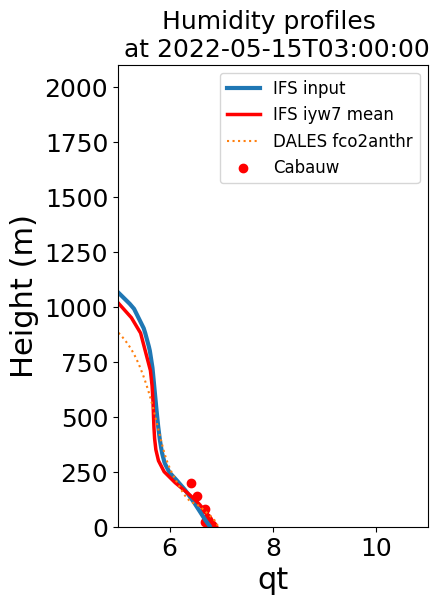

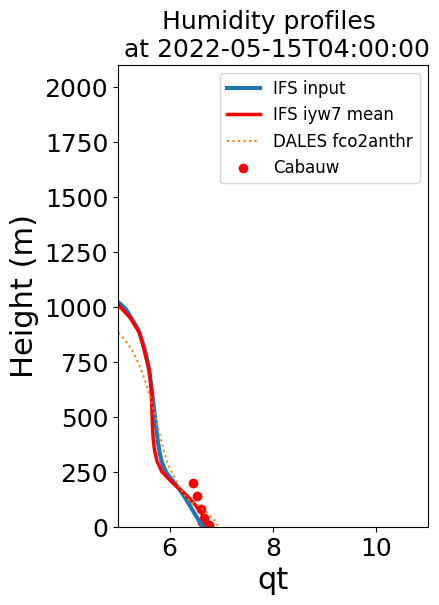

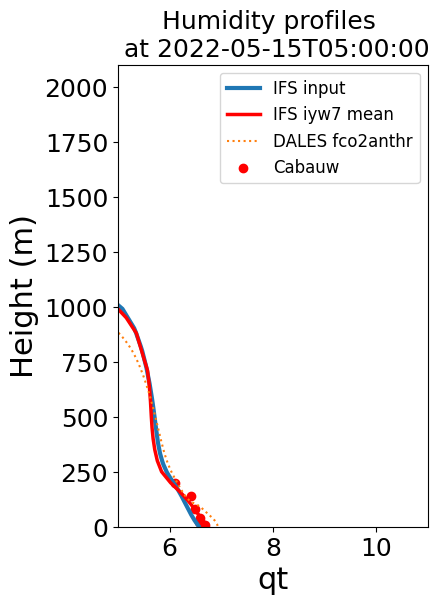

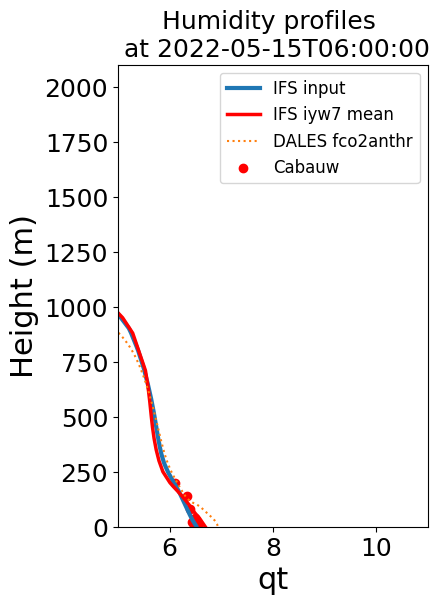

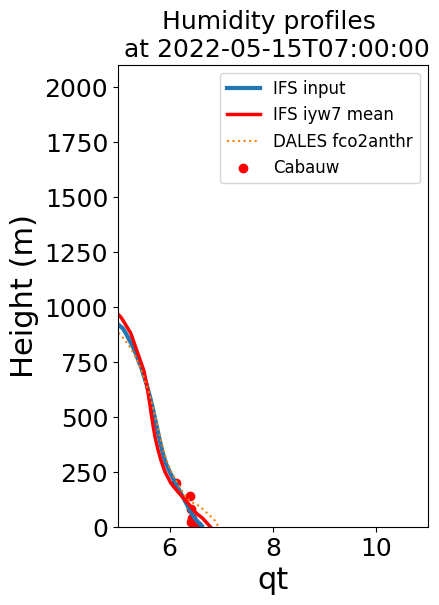

...

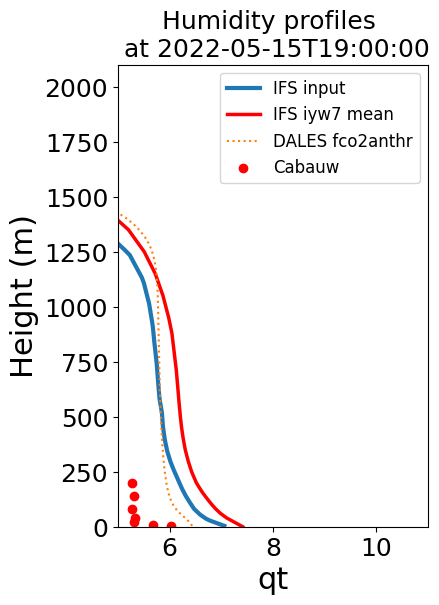

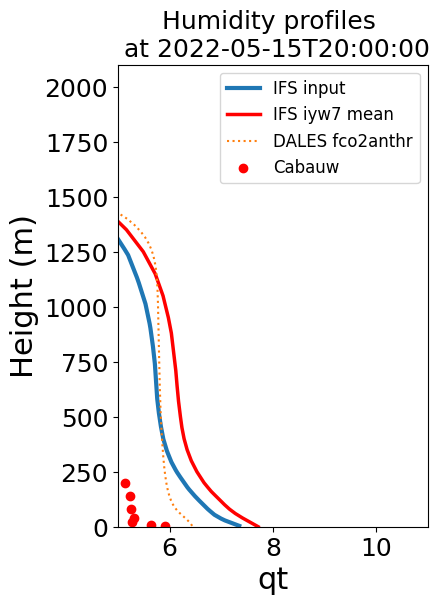

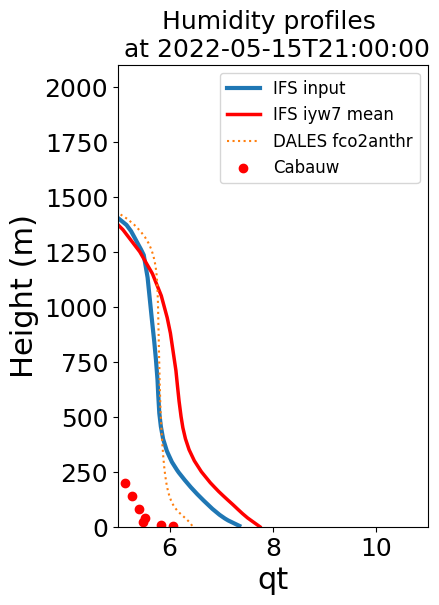

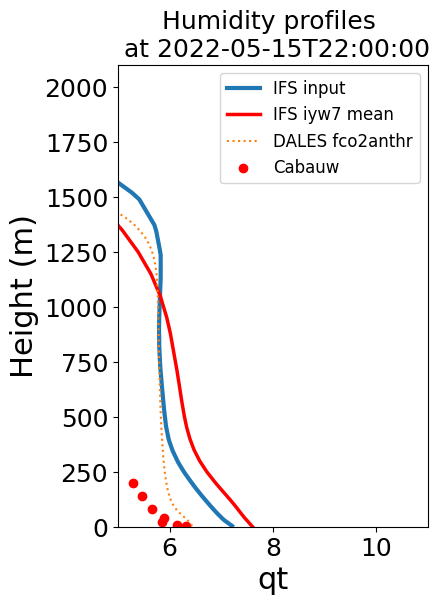

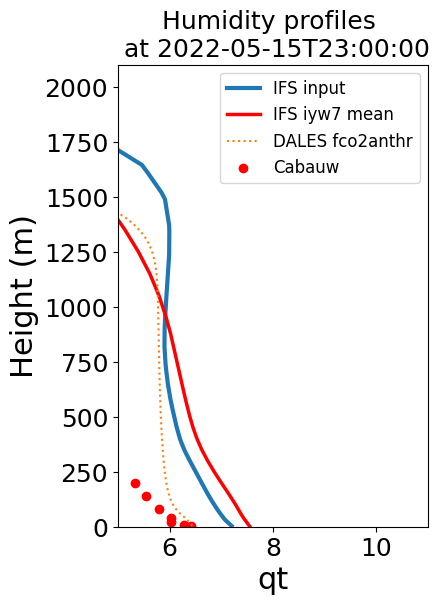

In [56]:
#### humidity rofiles q ####

for hour in ['03','04','05','06','07','08','09','10','11','12','13','14','15','16','17','18','19','20','21','22','23']:
    sel_time = np.datetime64(f'2022-05-15T{hour}:00:00')

    plt.figure(figsize=[4,6])
    (1000*input['qt']).sel(time=sel_time,method='nearest').plot(y='z',label='IFS input ',lw=3)
    (1000*ds_mean['qt']).isel(step=int(hour)-2).plot(y='height',label='IFS iyw7 mean',c='r',lw=2.5 )
    # (z_fc_slab_dict['ctrl']['q']).sel(time=sel_time,method='nearest').plot(y='height',label='IFS ctrl',ls='--',c='g',lw=2)

    (1000*profiles_fco2anthr['qt']).sel(time=sel_time,method='nearest').plot(y='zt',label='DALES fco2anthr',ls=':')
    plt.scatter(ds_cabauw['obs_tower_meteo'].sel(time=sel_time,method='nearest')['Q'],ds_cabauw['obs_tower_meteo']['z'],c='r',label='Cabauw')

    plt.title(f'Humidity profiles \n at {sel_time}',fontsize=18)
    plt.ylabel('Height (m)')
    plt.legend()
    plt.ylim([0,2100])
    plt.xlim([5,11])

    print(f"IFS time: {input.sel(time=sel_time,method='nearest')['time'].values}")
    print(f"DALES time: {profiles_fco2anthr.sel(time=sel_time,method='nearest')['time'].values}")
    print(f"Cabauw time: {ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['time'].values}")
    print(f'________________________')

IFS time: 2022-05-15T03:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T03:00:00.000000000
________________________
IFS time: 2022-05-15T04:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T04:00:00.000000000
________________________
IFS time: 2022-05-15T05:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T05:00:00.000000000
________________________
IFS time: 2022-05-15T06:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T06:00:00.000000000
________________________
IFS time: 2022-05-15T07:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T07:00:00.000000000
________________________
IFS time: 2022-05-15T08:00:00.000000000
DALES time: 2022-05-15T08:05:00.000000000
Cabauw time: 2022-05-15T08:00:00.000000000
________________________
IFS time: 2022-05-15T09:00:00.000000000
DALES time: 2022-05-15T09:00:00.000000000
Cabauw time: 2022-

/etc/ecmwf/ssd/ssd1/jupyterhub/paaa-jupyterhub/tmpdirs/paaa.31997449/ipykernel_1549797/1728758757.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=[4,6])


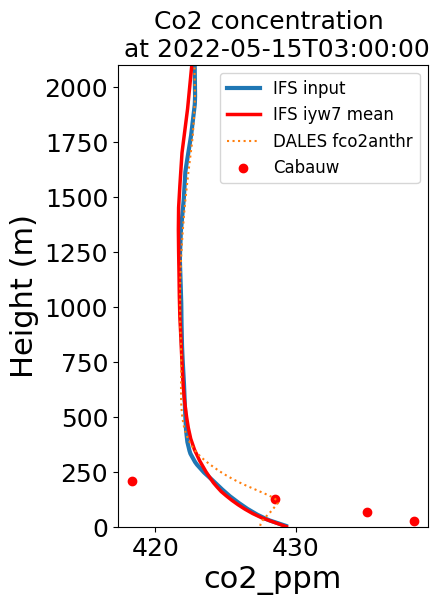

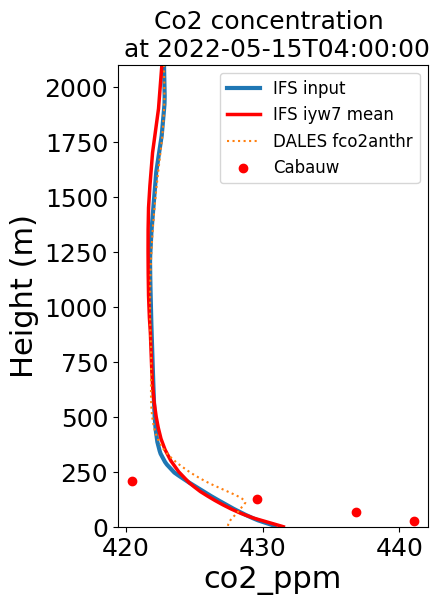

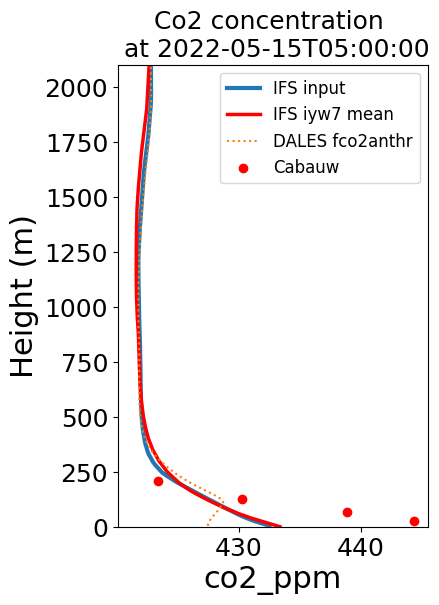

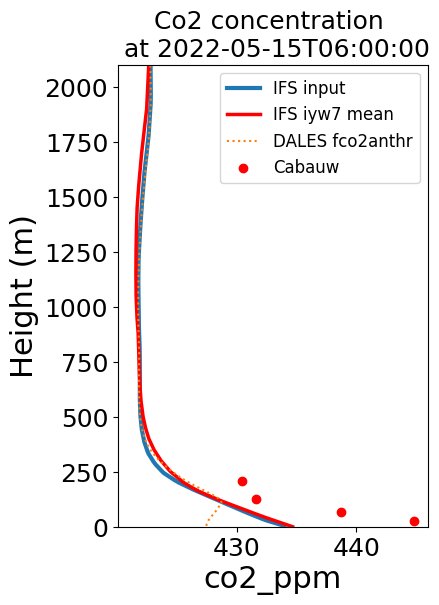

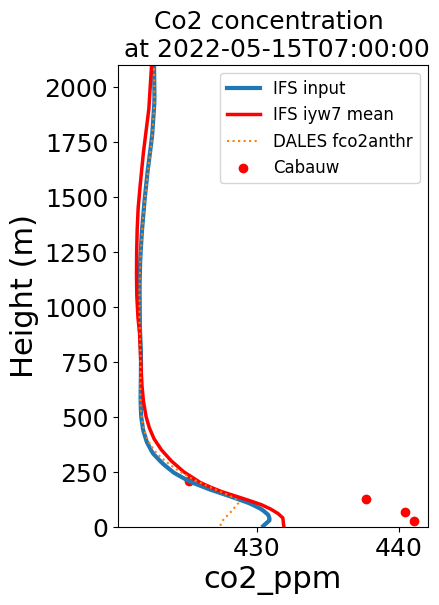

...

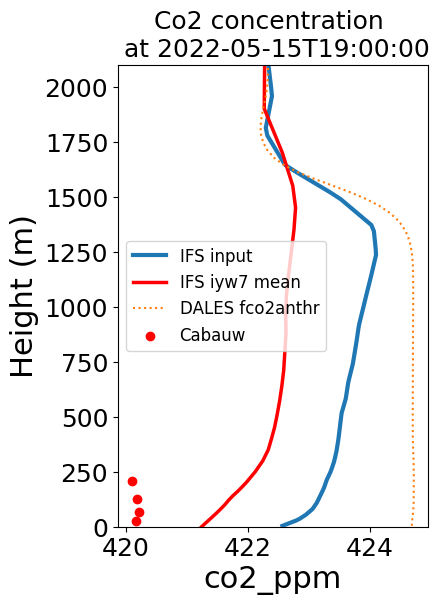

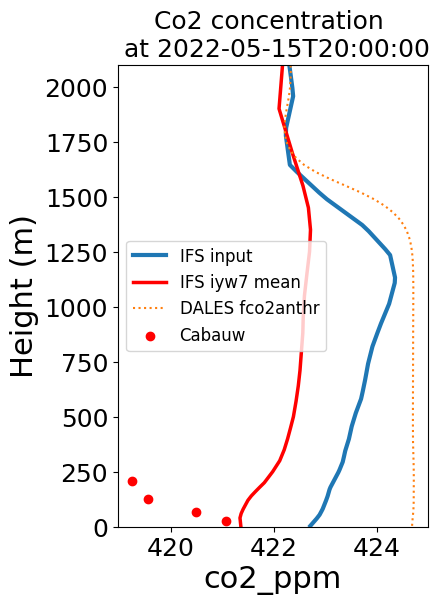

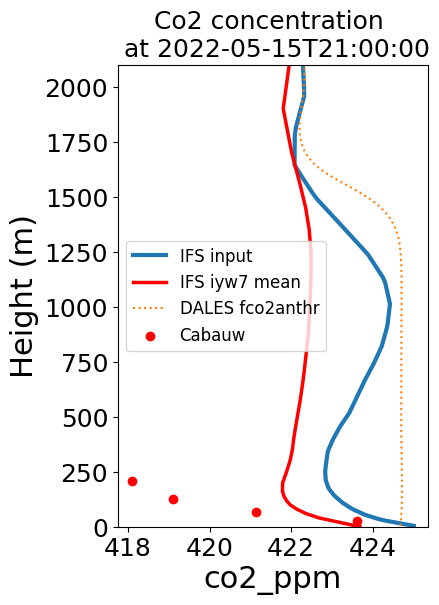

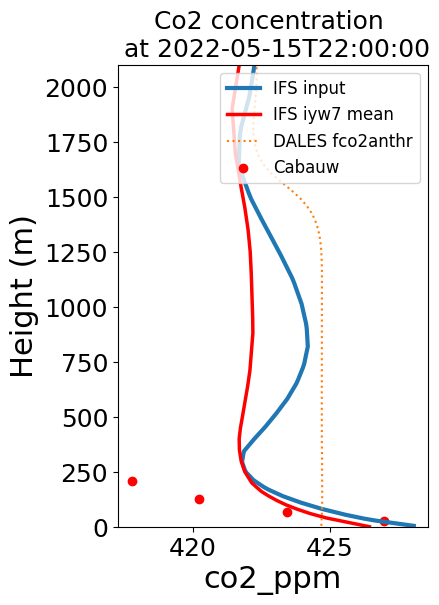

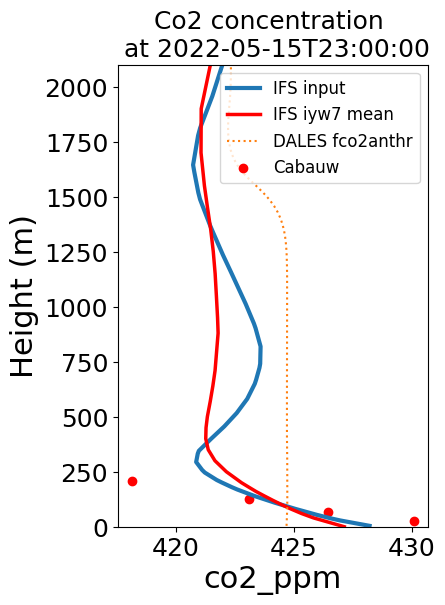

In [63]:
for hour in ['03','04','05','06','07','08','09','10','11','12','13','14','15','16','17','18','19','20','21','22','23']:
    sel_time = np.datetime64(f'2022-05-15T{hour}:00:00')

    plt.figure(figsize=[4,6])
    mfun.concentration_to_ppm('co2',input['co2']).sel(time=sel_time,method='nearest').plot(y='z',label='IFS input ',lw=3)
    (mfun.concentration_to_ppm('co2',ds_iyw7['co2'])).isel(step=int(hour)-2).plot(y='height',label='IFS iyw7 mean',c='r',lw=2.5 )

    # (z_fc_slab_dict['ctrl']['co2']).sel(time=sel_time,method='nearest').plot(y='height',label='IFS ctrl',ls='--',c='g',lw=2)

    # profiles_ru08['co2_ppm'].sel(time=sel_time,method='nearest').plot(y='zt',label='DALES ru 0.8',ls='-')
    # profiles_ru1['co2_ppm'].sel(time=sel_time,method='nearest').plot(y='zt',label='DALES ru 1',ls='--')
    # profiles_ru1['co2_ppm'].sel(time=sel_time,method='nearest').plot(y='zt',label='DALES')
    profiles_fco2anthr['co2_ppm'].sel(time=sel_time,method='nearest').plot(y='zt',label='DALES fco2anthr',ls=':')
    plt.scatter(ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['co2_207m'],207,c='r',label='Cabauw')
    plt.scatter(ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['co2_127m'],127,c='r')
    plt.scatter(ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['co2_67m'],67,c='r')
    plt.scatter(ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['co2_27m'],27,c='r')

    plt.title(f'Co2 concentration \n at {sel_time}',fontsize=18)
    plt.ylabel('Height (m)')
    plt.legend()
    plt.ylim([0,2100])

    print(f"IFS time: {input.sel(time=sel_time,method='nearest')['time'].values}")
    print(f"DALES time: {profiles_fco2anthr.sel(time=sel_time,method='nearest')['time'].values}")
    print(f"Cabauw time: {ds_cabauw['Cabauw_CO2_May2022'].sel(time=sel_time,method='nearest')['time'].values}")
    print(f'________________________')



<xarray.Dataset> Size: 24kB
Dimensions:  (time: 237)
Coordinates:
  * time     (time) datetime64[ns] 2kB 2022-05-15T08:05:00 ... 2022-05-16T17:...
Data variables: (12/23)
    cfrac    (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    zb       (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    zc_av    (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    zc_max   (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    zi       (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    we       (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    ...       ...
    wtheta   (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    wthetav  (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    wq       (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    twp_bar  (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    rwp_bar  (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
    pr       (time) float32 948B dask.array<chunksize=(122,), meta=np.ndarray>
Attributes:
    title:    tmser.001.nc
    history:  Created on 20251017 at 100931.377
    Source:   DALES 4.4.2 git: v4.4.1-989-geae6c4-dirty
    Author:

(0.0, 1000.0)

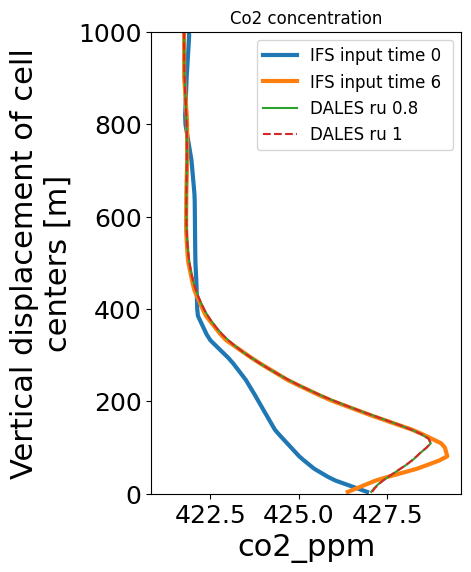

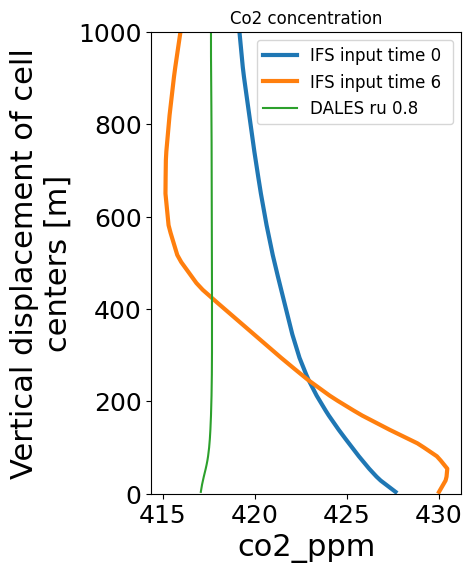

In [ ]:
### proiles at specific time ##
plt.figure(figsize=[4,6])
mfun.concentration_to_ppm('co2',input['co2']).isel(time=0).plot(y='z',label='IFS input time 0 ',lw=3)
# mfun.concentration_to_ppm('co2',input['co2']).isel(time=2).plot(y='z',label='IFS input',lw=3)
mfun.concentration_to_ppm('co2',input['co2']).isel(time=6).plot(y='z',label='IFS input time 6',lw=3)
profiles_ru08['co2_ppm'].isel(time=0).plot(y='zt',label='DALES ru 0.8',ls='-')
profiles_ru1['co2_ppm'].isel(time=0).plot(y='zt',label='DALES ru 1',ls='--')
# (mfun.concentration_to_ppm('co2',input['co2'])).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='input')
plt.title('Co2 concentration')
plt.legend()
plt.ylim([0,1000])

plt.figure(figsize=[4,6])
mfun.concentration_to_ppm('co2',input['co2']).isel(time=24).plot(y='z',label='IFS input time 0 ',lw=3)
# mfun.concentration_to_ppm('co2',input['co2']).isel(time=2).plot(y='z',label='IFS input',lw=3)
mfun.concentration_to_ppm('co2',input['co2']).isel(time=24+6).plot(y='z',label='IFS input time 6',lw=3)
profiles_ru08['co2_ppm'].isel(time=18*12).plot(y='zt',label='DALES ru 0.8',ls='-')
# (mfun.concentration_to_ppm('co2',input['co2'])).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='input')
plt.title('Co2 concentration')
plt.legend()
plt.ylim([0,1000])

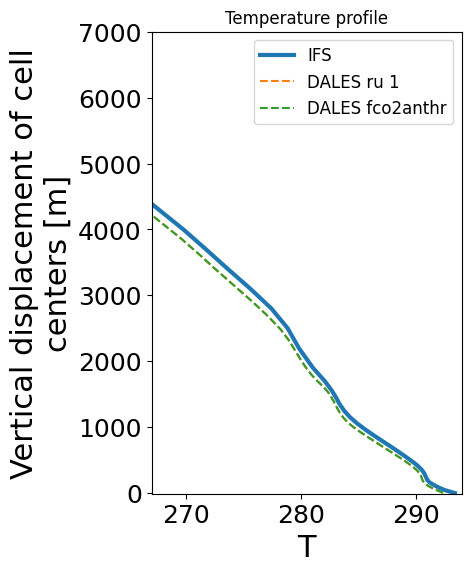

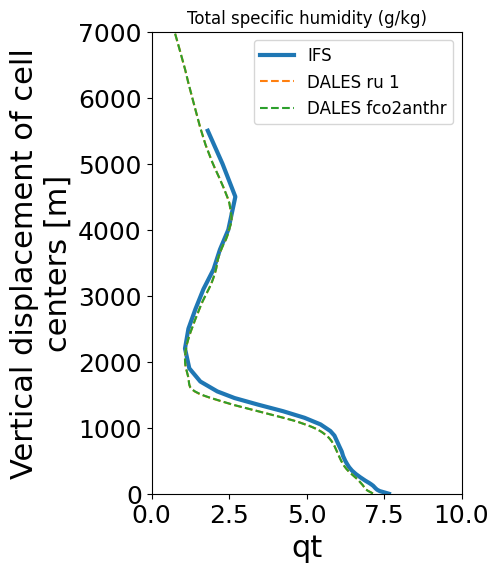

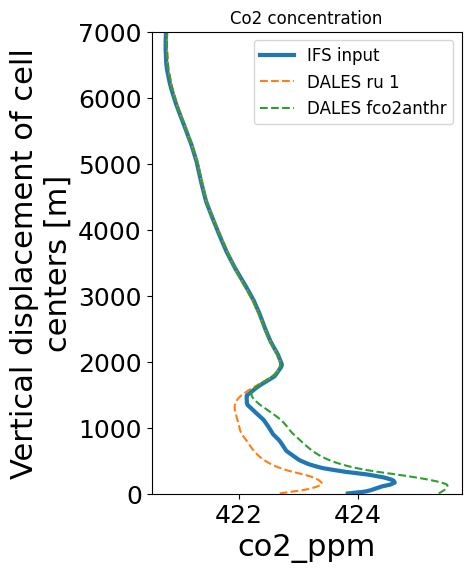

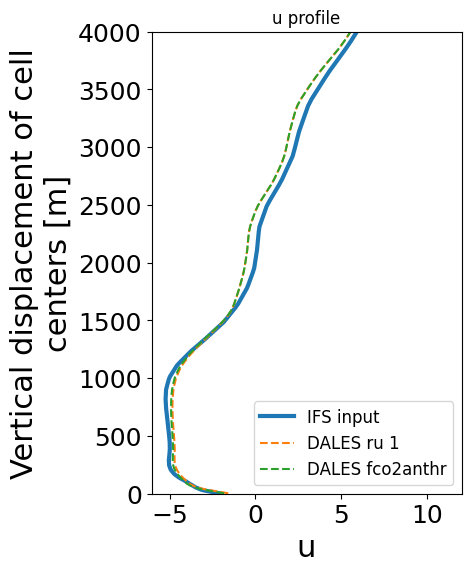

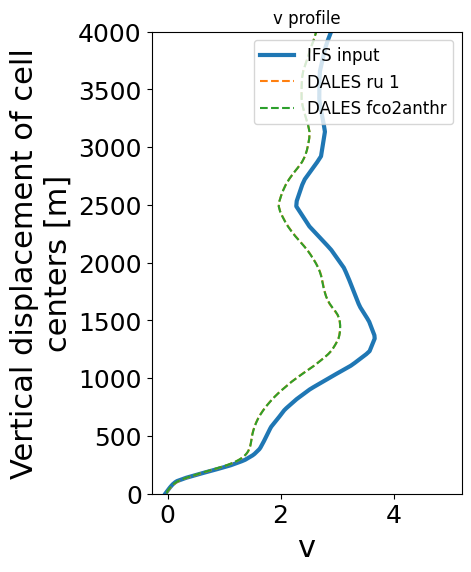

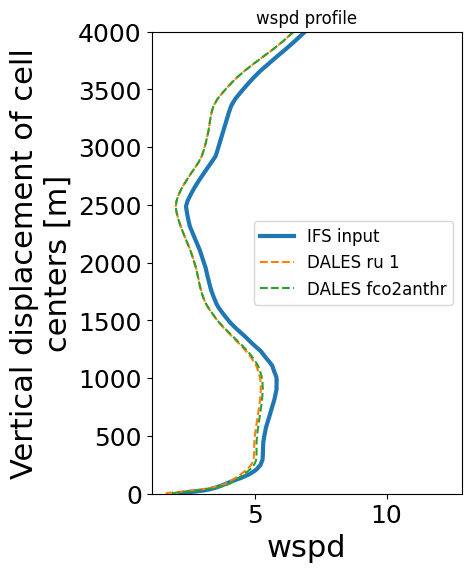

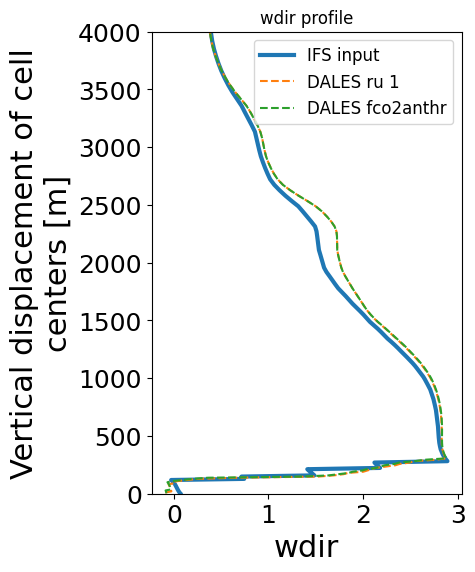

In [ ]:
#mean profiles
time_interval = [np.datetime64('2022-05-15T08:05:00'),np.datetime64('2022-05-15T16:50:00')]

####

plt.figure(figsize=[4,6])
z_fc_slab_dict[exp_names[0][0]]['t'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS',lw=3)
# profiles['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES',c='k')
# profiles_norad['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES norad')
# profiles_0600lt['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES 0600LT')
# profiles_halfhour['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES 30min',ls='--')
# profiles_interpls['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES interpls',ls='--')
# profiles_ru08['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 0.8',ls='--')
profiles_ru1['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 1',ls='--')
profiles_fco2anthr['T'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES fco2anthr',ls='--')
plt.title('Temperature profile')
plt.ylim([-10,4000])
plt.xlim([267,294])
plt.legend()

# Total specific humidity profiles
plt.figure(figsize=[4,6])
(z_fc_slab_dict[exp_names[0][0]]['q']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS',lw=3)
# (1000*profiles['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES')
# (1000*profiles_norad['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES no rad')
# (1000*profiles_0600lt['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES 0600LT')
# (1000*profiles_halfhour['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES 30min',ls='--')
# (1000*profiles_interpls['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES interpls',ls='--')
# (1000*profiles_ru08['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 0.8',ls='--')
(1000*profiles_ru1['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 1',ls='--')
(1000*profiles_fco2anthr['qt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES fco2anthr',ls='--')
plt.title('Total specific humidity (g/kg)')
plt.xlim([0,10])
plt.legend()
plt.ylim([0,4000])

plt.figure(figsize=[4,6])
# z_fc_slab_dict[exp_names[0][0]]['co2'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS',lw=3)
mfun.concentration_to_ppm('co2',input['co2']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='IFS input',lw=3)
# profiles['co2_ppm'].sel(time=time_select]).plot(y='zt',label = 'DALES')
# profiles_norad['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES no rad')
# profiles_0600lt['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES 0600LT')
# profiles_halfhour['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES 30min',ls='--')
# profiles_interpls['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES interpls',ls='--')
# profiles_ru08['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 0.8',ls='--')
profiles_ru1['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 1',ls='--')
profiles_fco2anthr['co2_ppm'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES fco2anthr',ls='--')
# (mfun.concentration_to_ppm('co2',input['co2'])).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='input')
plt.title('Co2 concentration')
plt.legend()
plt.ylim([0,7000])


# Wind profiles
for var in ['u', 'v', 'wspd', 'wdir']:
    plt.figure(figsize=[4,6])
    input[var].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='IFS input',lw=3)
    # (profiles[var]).isel(time=0).plot(y='zt',label = 'DALES')
    # (profiles_norad[var]).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES no rad')
    # (profiles_0600lt[var]).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES 0600LT')
    # (profiles_halfhour[var]).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES 30min',ls='--')
    # (profiles_interpls[var]).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label = 'DALES interpls',ls='--')
    # profiles_ru08[var].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 0.8',ls='--')
    profiles_ru1[var].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES ru 1',ls='--')
    profiles_fco2anthr[var].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES fco2anthr',ls='--')
    plt.title(f'{var} profile') 
    plt.legend()
    plt.ylim([0,4000])

(0.0, 4000.0)

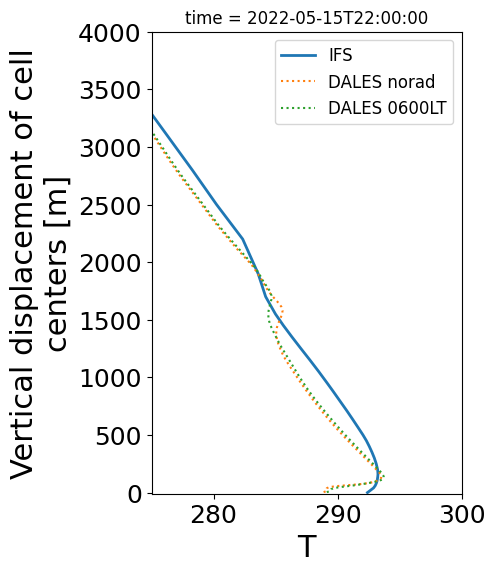

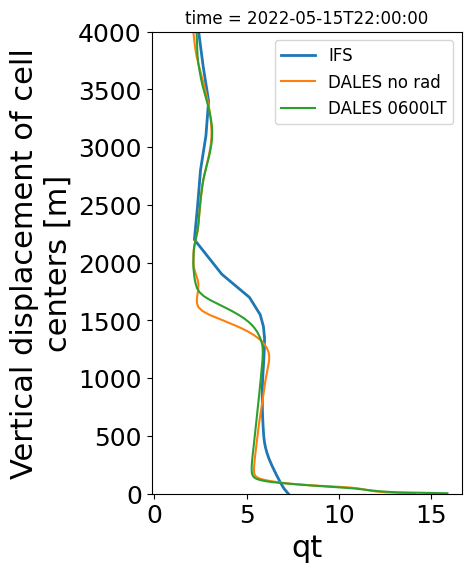

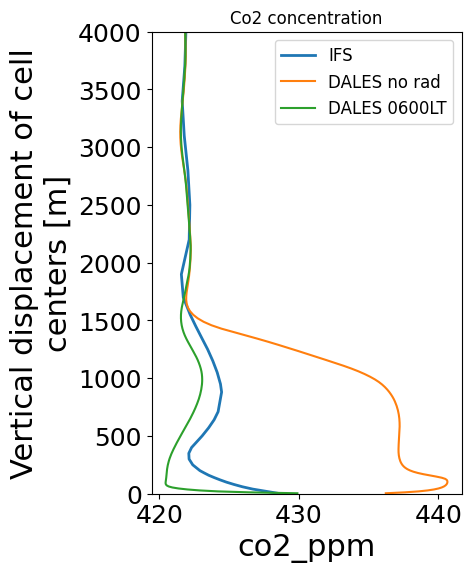

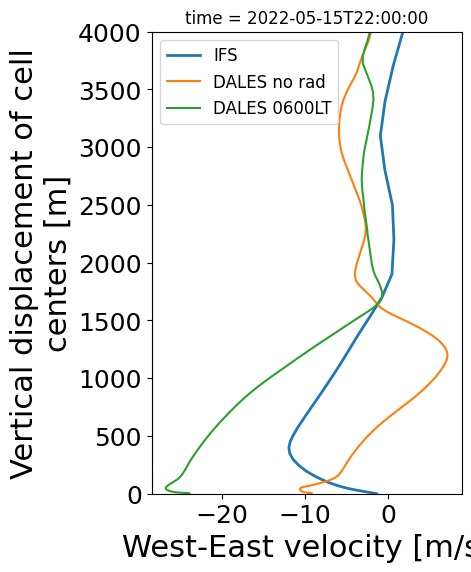

In [61]:
## Temperature profiles
time_select = np.datetime64('2022-05-15T22:00:00')

plt.figure(figsize=[4,6])
z_fc_slab_dict[exp_names[0][0]]['t'].sel(time=time_select).plot(y='height',label='IFS',lw=2)
# profiles['T'].sel(time=time_select).plot(y='zt',label='DALES',c='k')
profiles_norad['T'].sel(time=time_select).plot(y='zt',label='DALES norad',ls=':')
profiles_0600lt['T'].sel(time=time_select).plot(y='zt',label='DALES 0600LT',ls=':')
plt.ylim([-10,4000])
plt.xlim([275,300])
plt.legend()

# Total specific humidity profiles
plt.figure(figsize=[4,6])
(z_fc_slab_dict[exp_names[0][0]]['q']).sel(time=time_select).plot(y='height',label='IFS',lw=2)
# (1000*profiles['qt']).sel(time=time_select).plot(y='zt',label = 'DALES')
(1000*profiles_norad['qt']).sel(time=time_select).plot(y='zt',label = 'DALES no rad')
(1000*profiles_0600lt['qt']).sel(time=time_select).plot(y='zt',label = 'DALES 0600LT')
# (mfun.concentration_to_ppm('co2',input['co2'])).sel(time=time_select).plot(y='z',label='input')
plt.legend()
plt.ylim([0,4000])



plt.figure(figsize=[4,6])
z_fc_slab_dict[exp_names[0][0]]['co2'].sel(time=time_select).plot(y='height',label='IFS',lw=2)
# profiles['co2_ppm'].sel(time=time_select]).plot(y='zt',label = 'DALES')
profiles_norad['co2_ppm'].sel(time=time_select).plot(y='zt',label = 'DALES no rad')
profiles_0600lt['co2_ppm'].sel(time=time_select).plot(y='zt',label = 'DALES 0600LT')
# (mfun.concentration_to_ppm('co2',input['co2'])).sel(time=time_select).plot(y='z',label='input')
plt.title('Co2 concentration')
plt.legend()
plt.ylim([0,4000])


# Wind profiles
plt.figure(figsize=[4,6])
(z_fc_slab_dict[exp_names[0][0]]['u']).sel(time=time_select).plot(y='height',label='IFS',lw=2)
# (profiles['u']).sel(time=time_select).plot(y='zt',label = 'DALES')
(profiles_norad['u']).sel(time=time_select).plot(y='zt',label = 'DALES no rad')
(profiles_0600lt['u']).sel(time=time_select).plot(y='zt',label = 'DALES 0600LT')
# (mfun.concentration_to_ppm('co2',input['co2'])).sel(time=time_select).plot(y='z',label='input')
plt.legend()
plt.ylim([0,4000])

Text(0.5, 1.0, 'Surface temperature in IFS')

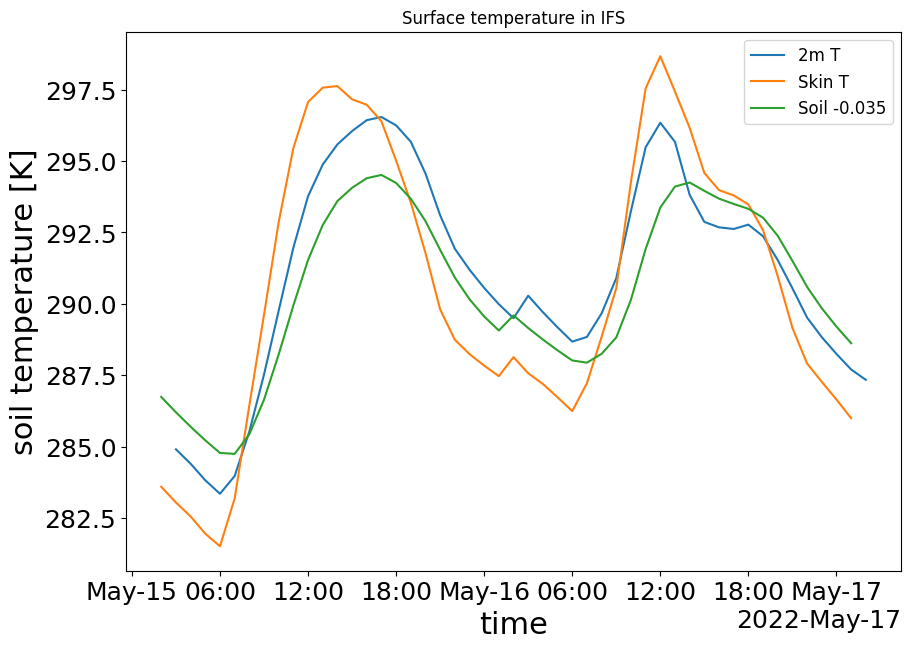

In [101]:
plt.figure()
srf_fc_slab_dict[exp_names[0][0]]['t2m'].isel(time=slice(0,48)).plot(label='2m T')
input['ts'].plot(label='Skin T')
input['t_soil'].sel(zs=-0.035).plot(label='Soil -0.035')

# input['t_soil'].sel(zs=-0.175).plot(label='input l2')
# input['t_soil'].sel(zs=-0.64).plot(label='input l3')
plt.legend()
plt.title('Surface temperature in IFS')

(0.0, 4000.0)

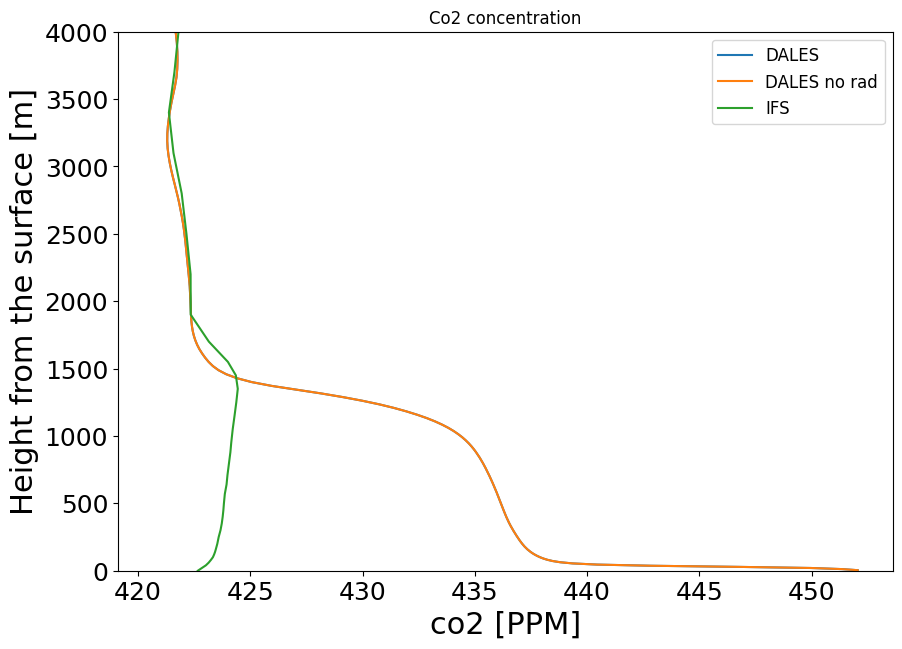

In [ ]:


# plt.figure()
# (3600*profiles_norad['wco2t']).isel(time=155).plot(y='zm',label = 'DALES_norad tot flux')
# (3600*profiles['wco2t']).isel(time=155).plot(y='zm',label = 'DALES tot flux')

# # (3600*profiles_norad['wco2r']).isel(time=155).plot(y='zm',label = 'DALES_norad resolved flx')

# # z_fc_slab_dict[exp_names[0][0]]['dco2dt_dyn'].isel(time=16).plot(y='height',label='IFS')
# # input['dco2dt_dyn'].isel(time=16).plot(y='z',label='input')
# plt.legend()

(0.0, 4000.0)

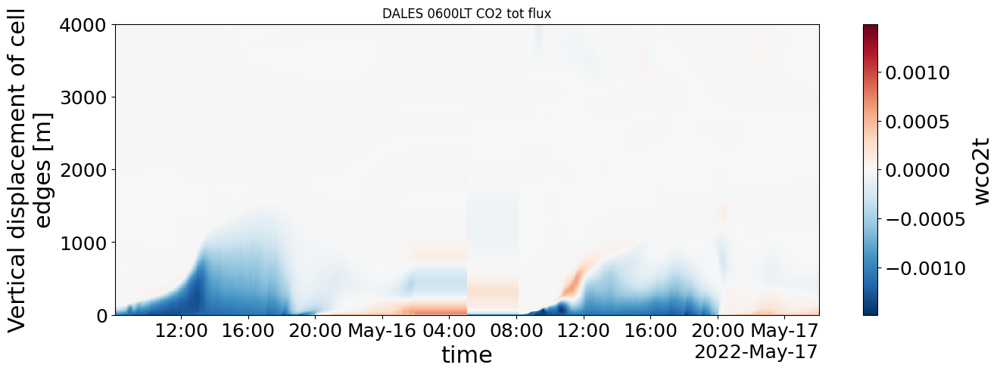

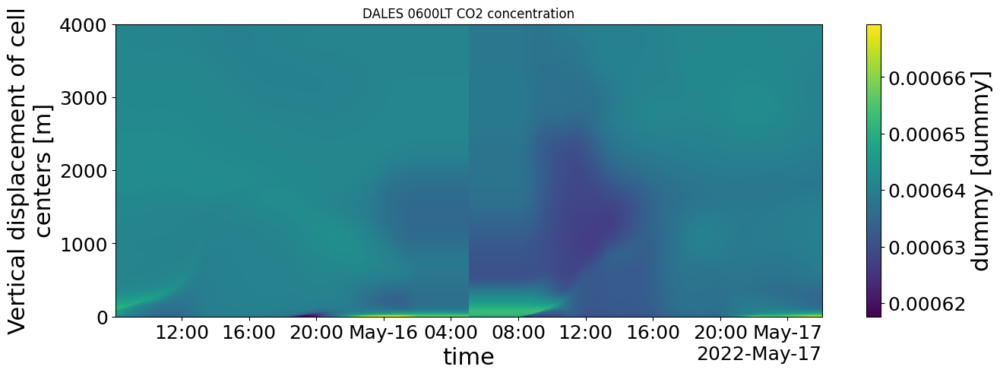

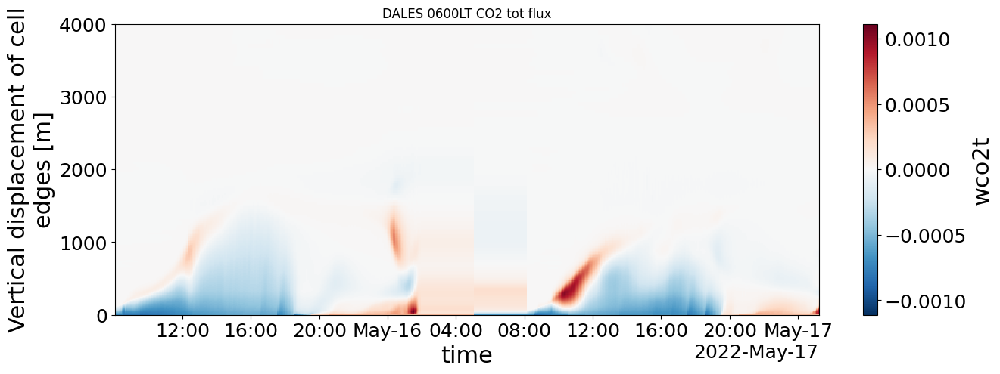

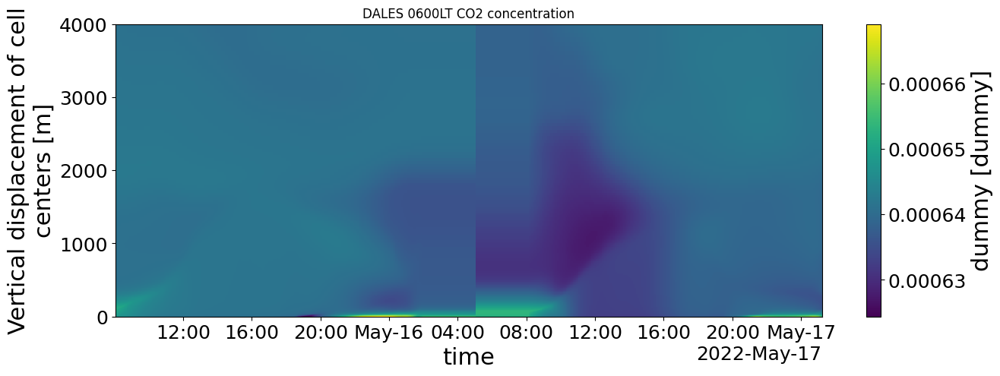

In [66]:
## flux and concentration of CO2 
# plt.figure(figsize=(15,5))
# (3600*profiles_norad['wco2t']).plot(y='zm')
# plt.title('DALES-norad CO2 tot flux')
# plt.ylim([0,4000])
# plt.figure(figsize=(15,5))
# (profiles_norad['co2']).plot(y='zt')
# plt.title('DALES-norad CO2 concentration')
# plt.ylim([0,4000])

plt.figure(figsize=(15,5))
(3600*profiles_0600lt['wco2t']).plot(y='zm')
plt.title('DALES 0600LT CO2 tot flux')
plt.ylim([0,4000])
plt.figure(figsize=(15,5))
(profiles_0600lt['co2']).plot(y='zt')
plt.title('DALES 0600LT CO2 concentration')
plt.ylim([0,4000])

plt.figure(figsize=(15,5))
(3600*profiles_interpls['wco2t']).plot(y='zm')
plt.title('DALES 0600LT CO2 tot flux')
plt.ylim([0,4000])
plt.figure(figsize=(15,5))
(profiles_interpls['co2']).plot(y='zt')
plt.title('DALES 0600LT CO2 concentration')
plt.ylim([0,4000])

Text(0.5, 1.0, 'T Total tendencies (dT/dt) DALES 0600LT')

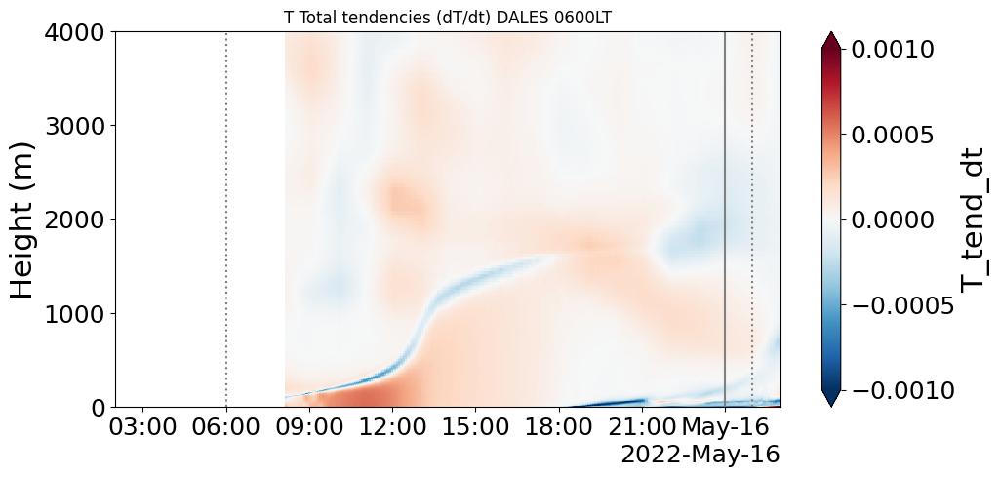

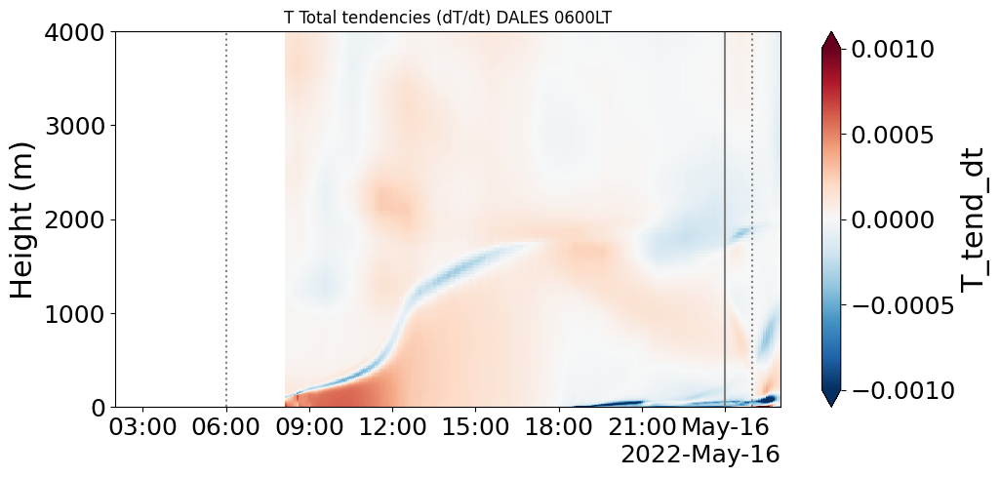

In [67]:
plt.figure(figsize=(11,5))
(profiles_0600lt['T_tend_dt']).plot(y='zt',vmax= 0.001)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-16T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('T Total tendencies (dT/dt) DALES 0600LT')

plt.figure(figsize=(11,5))
(profiles_interpls['T_tend_dt']).plot(y='zt',vmax= 0.001)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-16T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('T Total tendencies (dT/dt) DALES 0600LT')

Text(0.5, 1.0, 'CO2 Total tendencies IFS')

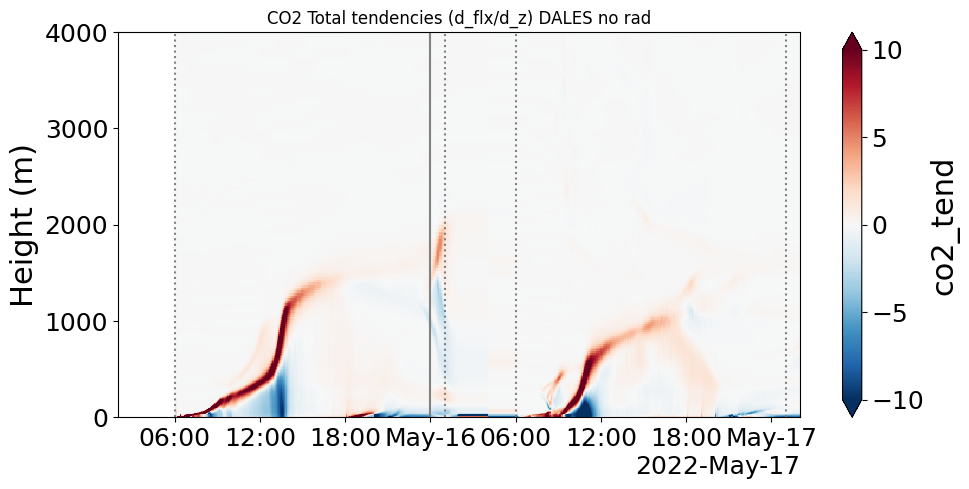

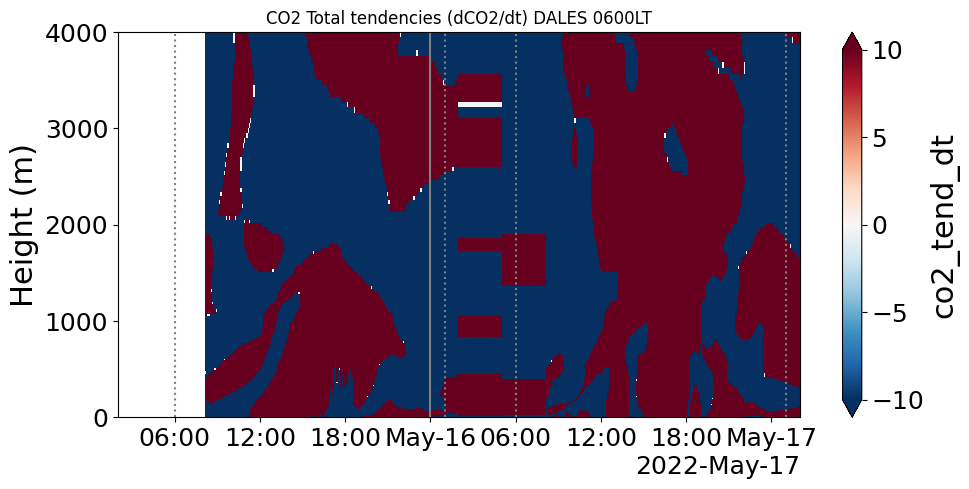

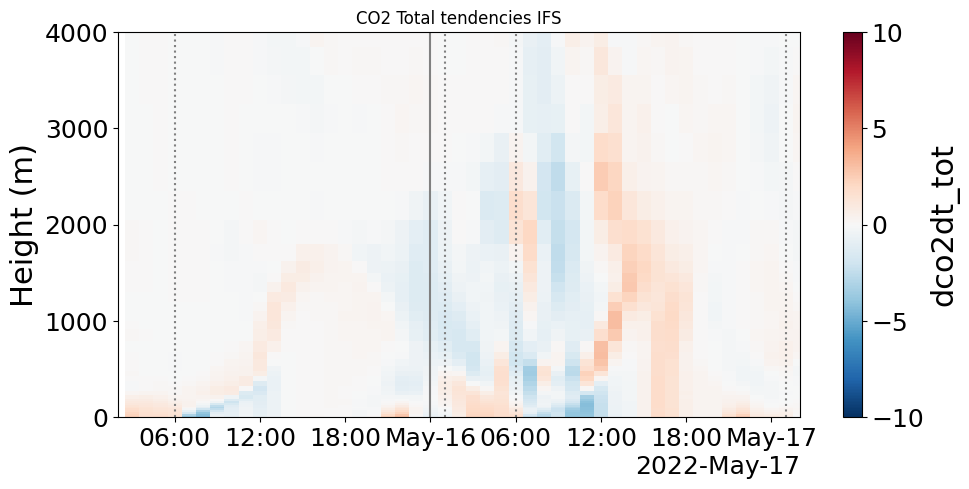

In [ ]:
vmax = 10
plt.figure(figsize=(11,5))
(3600*(mfun.concentration_to_ppm('co2',profiles_norad['co2_tend']))).plot(y='zm',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('CO2 Total tendencies (d_flx/d_z) DALES no rad')

plt.figure(figsize=(11,5))
(3600*(mfun.concentration_to_ppm('co2',profiles_norad['co2_tend_dt']))).plot(y='zt',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('CO2 Total tendencies (dC/dt) DALES no rad')

plt.figure(figsize=(11,5))
z_fc_slab_dict[exp_names[0][0]]['dco2dt_tot'].isel(time=slice(0,48)).plot(y='height',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('CO2 Total tendencies IFS')


In [97]:
z_fc_slab_dict[exp_names[0][0]]

<xarray.Dataset> Size: 3MB
Dimensions:       (time: 144, height: 41)
Coordinates:
  * time          (time) datetime64[ns] 1kB 2022-05-15T03:00:00 ... 2022-05-2...
  * height        (height) int64 328B 0 10 20 40 60 ... 3700 4000 4500 5000 5500
Data variables: (12/55)
    crwc          (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dudt_dyn      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dvdt_dyn      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dTdt_dyn      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dqdt_dyn      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dudt_diff     (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    ...            ...
    dqdt_tot      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dTdt_tot      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dudt_tot      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dvdt_tot      (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dco2dt_tot    (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>
    dch4dt_tot    (time, height) float64 47kB dask.array<chunksize=(144, 41), meta=np.ndarray>

In [31]:
input

<xarray.Dataset> Size: 3MB
Dimensions:     (time: 96, z: 180, zs: 4, lev: 138, lay: 137)
Coordinates:
  * time        (time) datetime64[ns] 768B 2022-05-15T02:00:00 ... 2022-05-19...
  * z           (z) float64 1kB 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zs          (zs) float64 32B -0.035 -0.175 -0.64 -1.945
  * lev         (lev) int64 1kB 0 1 2 3 4 5 6 7 ... 131 132 133 134 135 136 137
  * lay         (lay) int64 1kB 0 1 2 3 4 5 6 7 ... 130 131 132 133 134 135 136
Data variables: (12/32)
    thl         (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    T           (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    qt          (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    u           (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    v           (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wls         (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    ...          ...
    fco2nee     (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    fco2gpp     (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    fco2rec     (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    h2o_lay     (time, lay) float64 105kB dask.array<chunksize=(96, 137), meta=np.ndarray>
    wspd        (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wdir        (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
Attributes:
    fc:           0.00011487960315944262
    central_lon:  4.927
    central_lat:  51.971
    area:         0.75°×0.75° spatial average
    source:       IFS + (LS)²D
    description:  Generated by (LS)²D (adapted): https://github.com/LS2D & ht...
    reference:    van Stratum et al. (2023). The benefits and challenges of d...

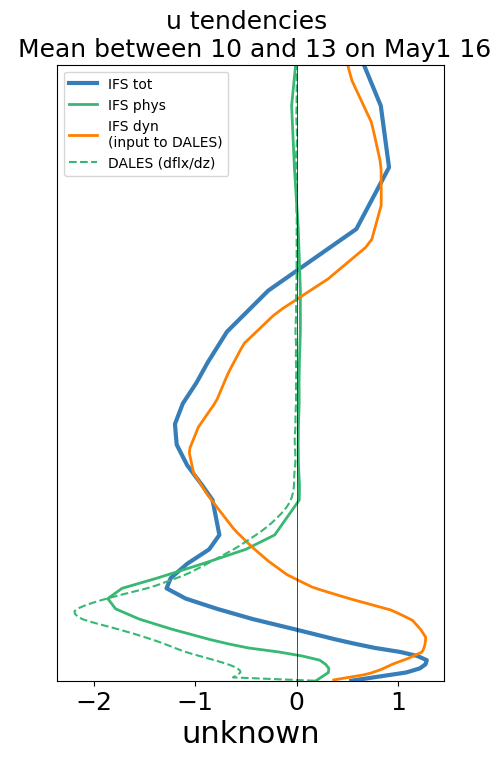

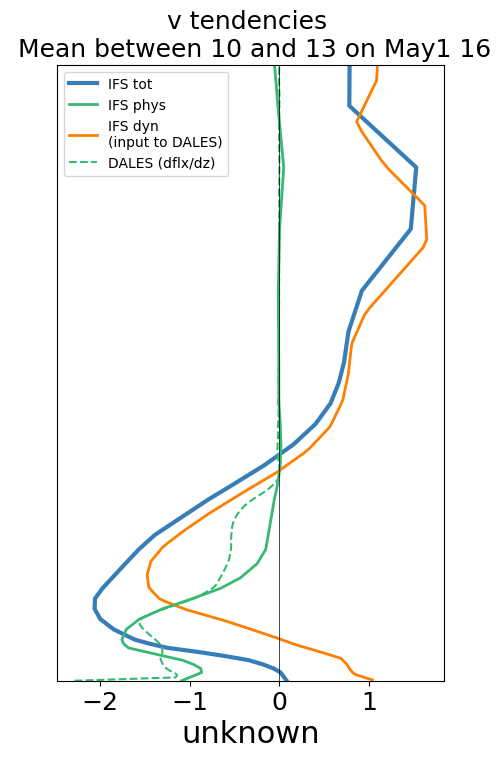

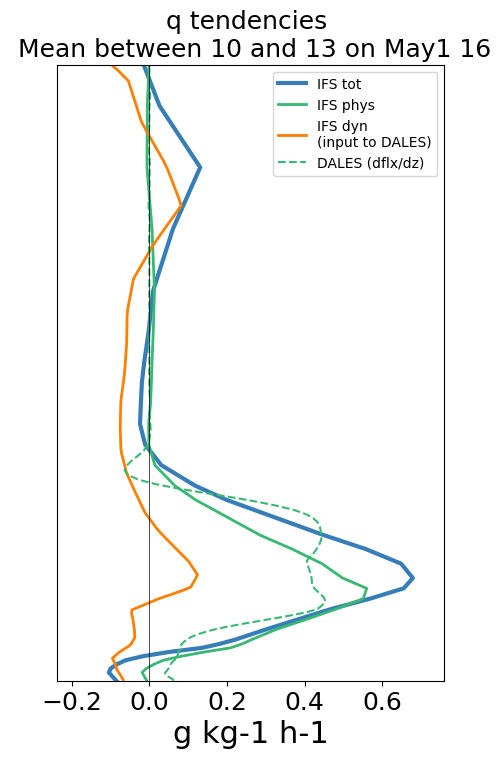

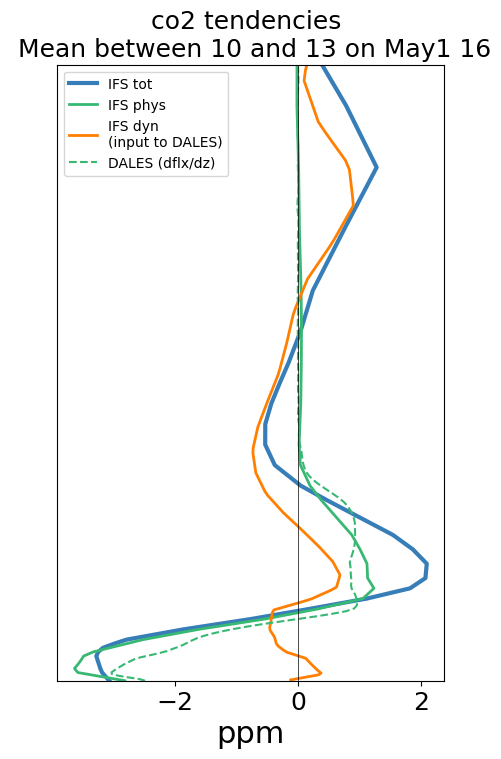

In [62]:
## DALES budget profiles
time_interval = [np.datetime64('2022-05-16T10:05:00'),np.datetime64('2022-05-16T12:50:00')]

for var in ['u','v','q','co2']:
    if var == 'q':
        factor =1000
        unit = "g kg-1 h-1"
    elif var == 'co2':
        factor = mfun.concentration_to_ppm('co2',1)
        unit="ppm"
    else:
        factor = 1
        unit="unknown"
    
    plt.figure(figsize=(5,8))
    z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_tot'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',lw=3,label='IFS tot',c='#377eb8')
    # z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_dyn'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS dyn',c='navy')
    (z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_conv'] + z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_diff']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(
        y='height',label='IFS phys',c='#37b873',lw=2)
    (3600*factor*input[f'd{var}dt_dyn']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label=f'IFS dyn\n(input to DALES)',lw=2,c="#ff7f00")

    ######
    (3600*factor*profiles_fco2anthr[f'{var}_tend']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zm',ls='--',label='DALES (dflx/dz)',c="#37b873")
    # (3600*factor*\
    #  (input[f'd{var}dt_dyn']+profiles_fco2anthr[f'{var}_tend'].interp(zm=input['z'],method='nearest')))\
    #     .sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='z',label='DALES tot\n(dyn - dflx/dz)',lw=2,ls='--',c='#377eb8')
    # (3600*factor*profiles_fco2anthr[f'{var}_tend_dt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',ls='--',label='DALES tot',c='#377eb8')
    ######


    plt.axvline(0,c='k',lw=0.5)
    # plt.ylabel('Height (m)')
    plt.ylabel('')
    plt.yticks([])

    plt.xlabel(unit)
    plt.title(f'{var} tendencies \n Mean between 10 and 13 on May1 16',fontsize=18)
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.legend(fontsize=10)
    plt.ylim([0,3000])

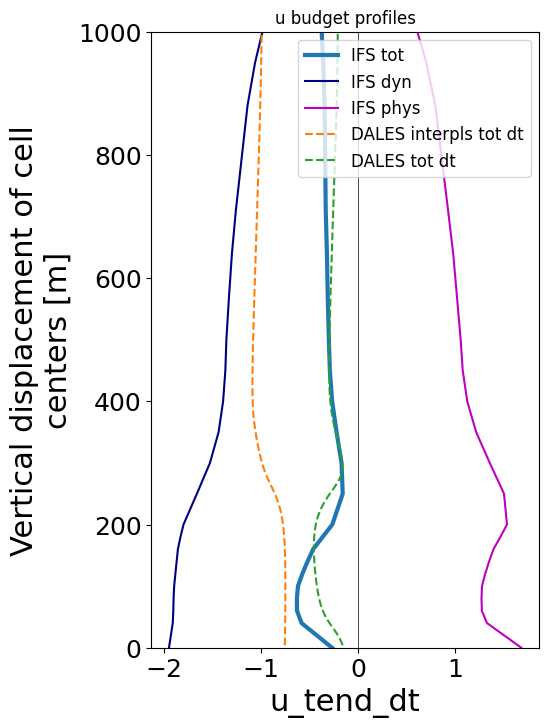

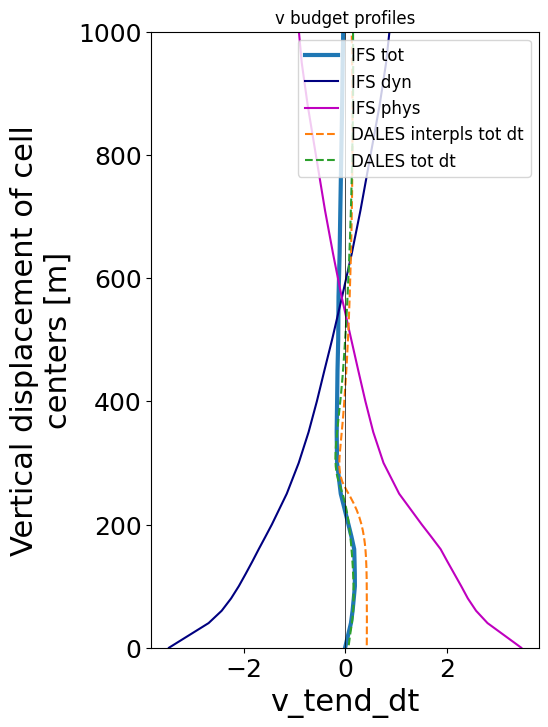

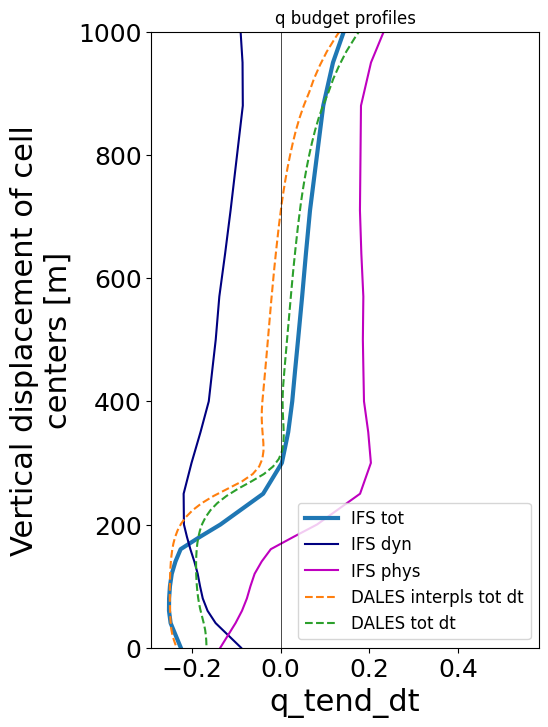

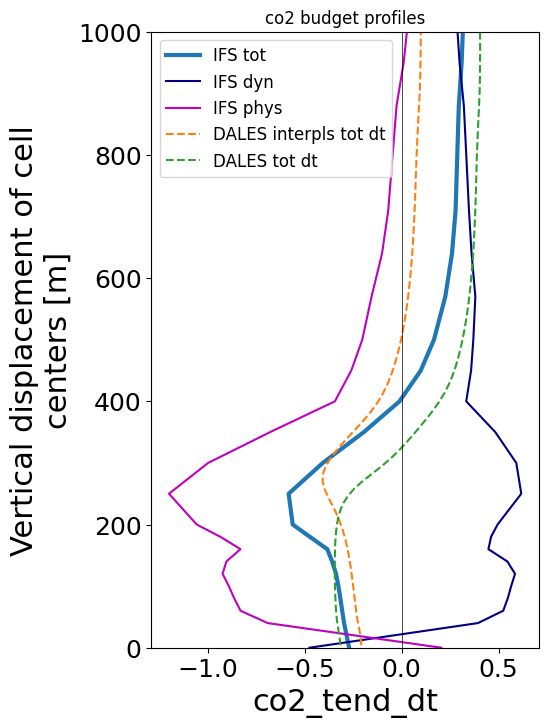

In [41]:
## budget profiles
time_interval = [np.datetime64('2022-05-15T10:05:00'),np.datetime64('2022-05-15T16:50:00')]

for var in ['u','v','q','co2']:
    if var == 'q':
        factor =1000
    elif var == 'co2':
        factor = mfun.concentration_to_ppm('co2',1)
    else:
        factor = 1
    
    plt.figure(figsize=(5,8))
    z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_tot'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',lw=3,label='IFS tot')
    z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_dyn'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS dyn',c='navy')
    (z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_conv'] + z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_diff']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS phys',c='m')
    # z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_conv'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS conv')
    # z_fc_slab_dict[exp_names[0][0]][f'd{var}dt_diff'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='height',label='IFS diff')
    # (3600*factor*profiles_0600lt[f'{var}_tend_dt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES 006LT tot dt')
    # (3600*factor*profiles_halfhour[f'{var}_tend_dt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',ls='--',label='DALES 30min tot dt')
    (3600*factor*profiles_interpls[f'{var}_tend_dt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',ls='--',label='DALES interpls tot dt')
    (3600*factor*profiles_fco2anthr[f'{var}_tend_dt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',ls='--',label='DALES tot dt')

    
    # (3600*factor*profiles_0600lt[f'{var}_tend']).sel(time=slice(time_interval[0],'time_interval[1])).mean('time').plot(y='zm',ls=':',label='DALES 006LT tot dz')

    # (3600*factor*profiles_norad[f'{var}_tend_dt']).sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(y='zt',label='DALES norad tot dt')

    plt.axvline(0,c='k',lw=0.5)
    plt.title(f'{var} budget profiles')
    plt.legend()
    plt.ylim([0,1000])

Text(0.5, 1.0, 'Q Tot tendencies IFS')

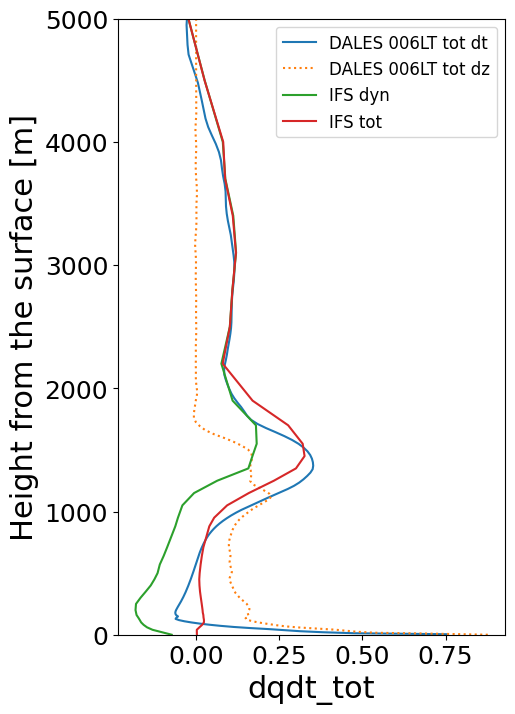

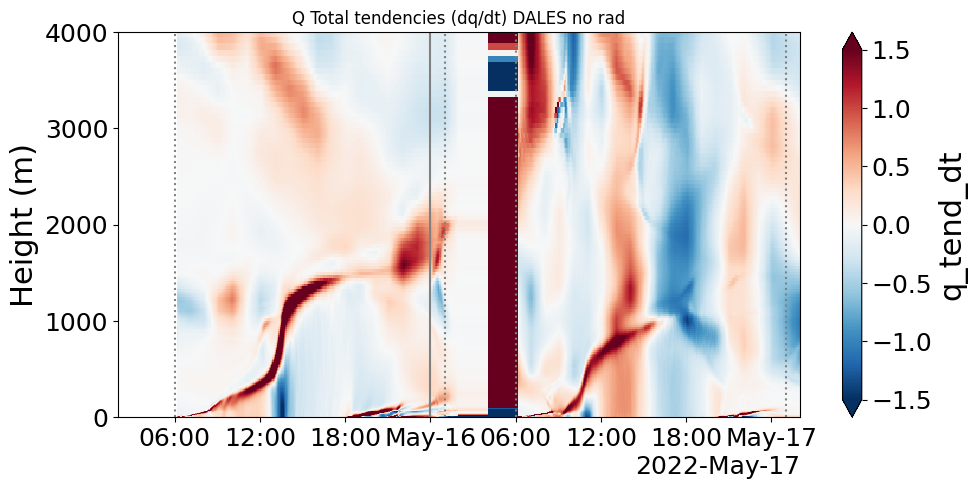

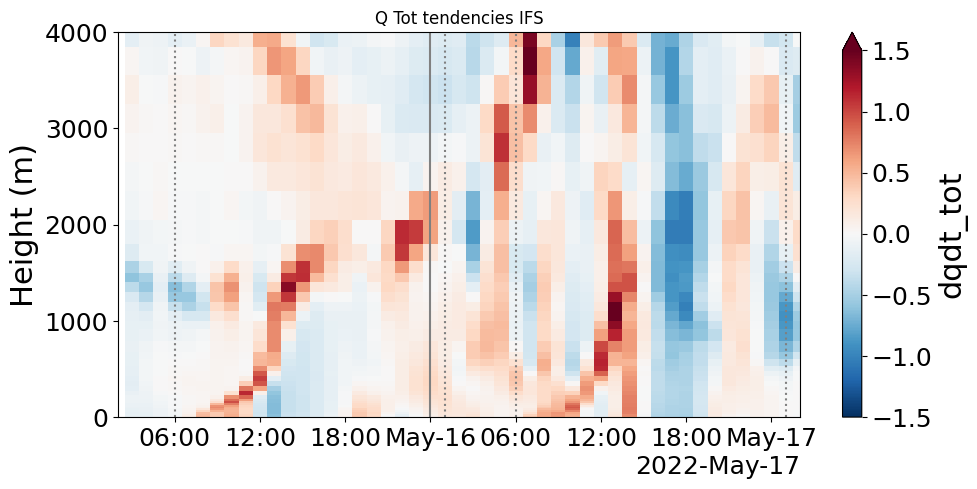

In [ ]:
vmax = 1.5
# plt.figure(figsize=(11,5))
# (3600*1000*profiles_norad['q_tend']).plot(y='zm',vmax= vmax)
# plt.ylim([0,4000])
# plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
# plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
# plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
# plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
# plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
# plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
# plt.ylabel('Height (m)')
# plt.xlabel('')
# plt.title('Q Total tendencies DALES (d_flx/d_z) no rad')

plt.figure(figsize=(11,5))
(3600*1000*profiles_norad['q_tend_dt']).plot(y='zt',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('Q Total tendencies (dq/dt) DALES no rad')

plt.figure(figsize=(11,5))
z_fc_slab_dict[exp_names[0][0]]['dqdt_tot'].isel(time=slice(0,48)).plot(y='height',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('Q Tot tendencies IFS')


Text(0.5, 1.0, 'T Tot tendencies IFS')

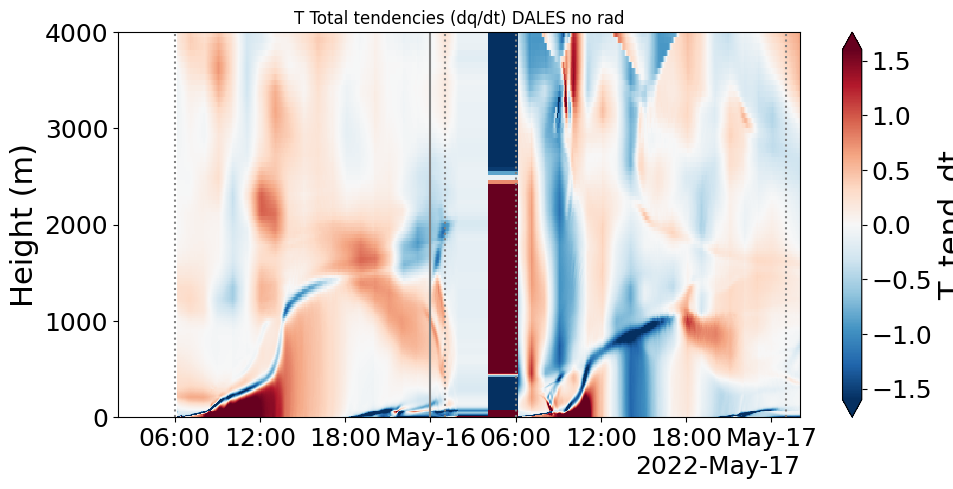

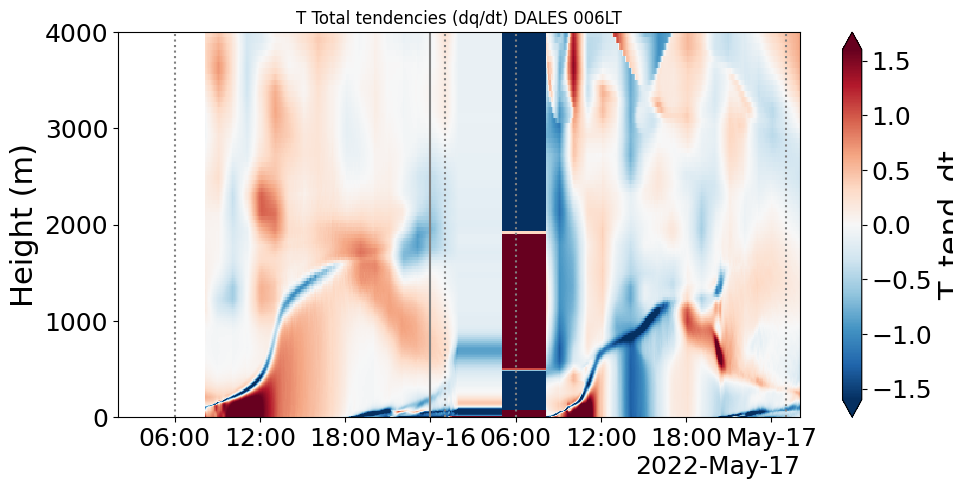

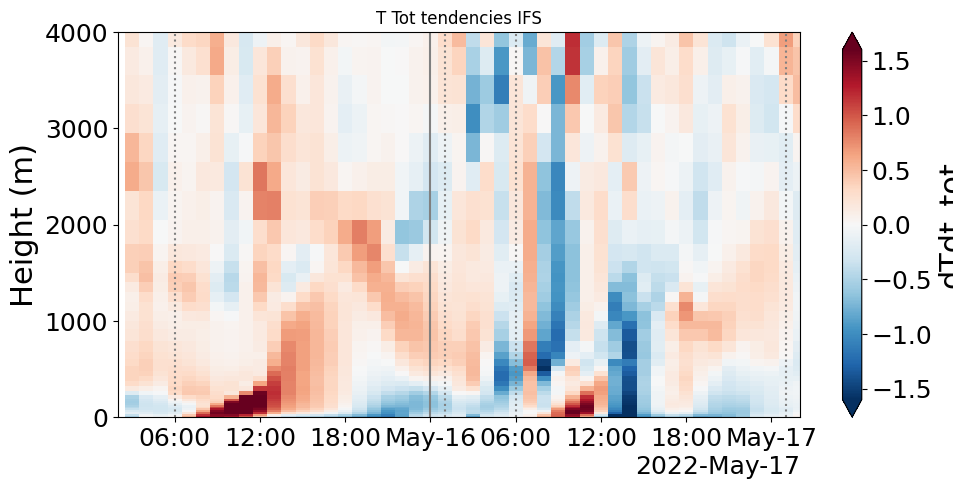

In [94]:
vmax= 1.6
plt.figure(figsize=(11,5))
(3600*profiles_norad['T_tend_dt']).plot(y='zt',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('T Total tendencies (dq/dt) DALES no rad')

plt.figure(figsize=(11,5))
(3600*profiles_0600lt['T_tend_dt']).plot(y='zt',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('T Total tendencies (dq/dt) DALES 006LT')

plt.figure(figsize=(11,5))
z_fc_slab_dict[exp_names[0][0]]['dTdt_tot'].isel(time=slice(0,48)).plot(y='height',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('T Tot tendencies IFS')



Text(0.5, 1.0, 'U Tot tendencies IFS')

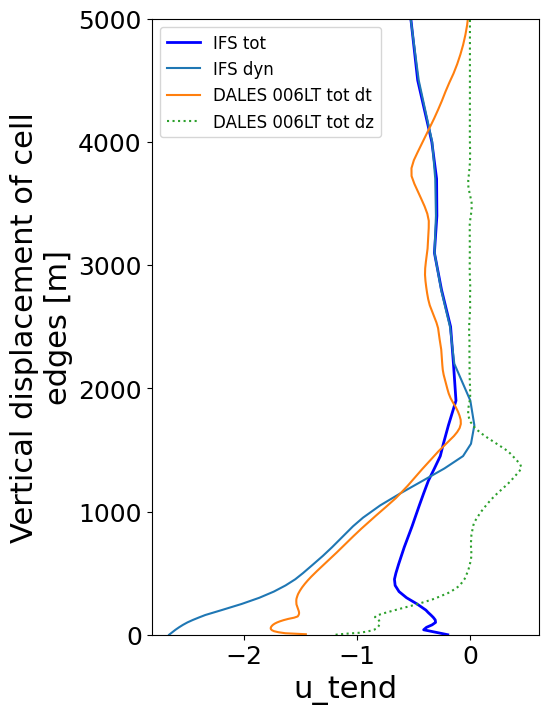

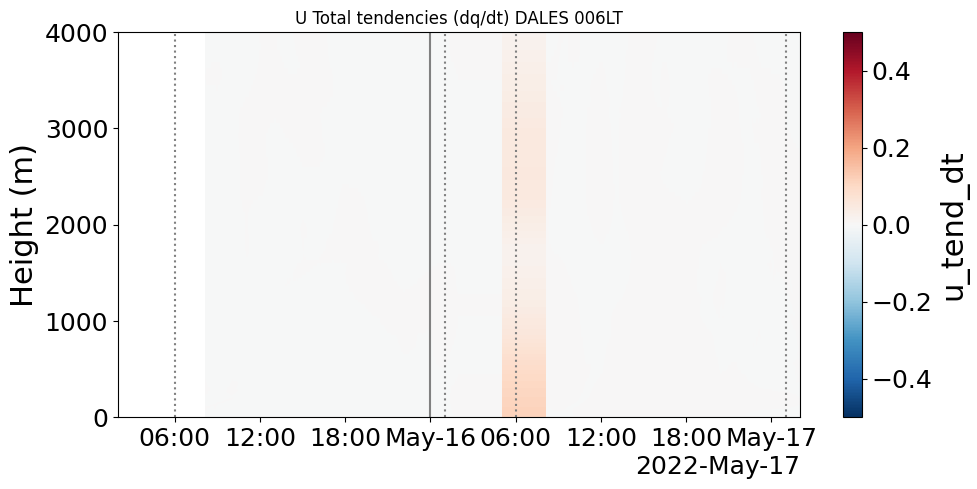

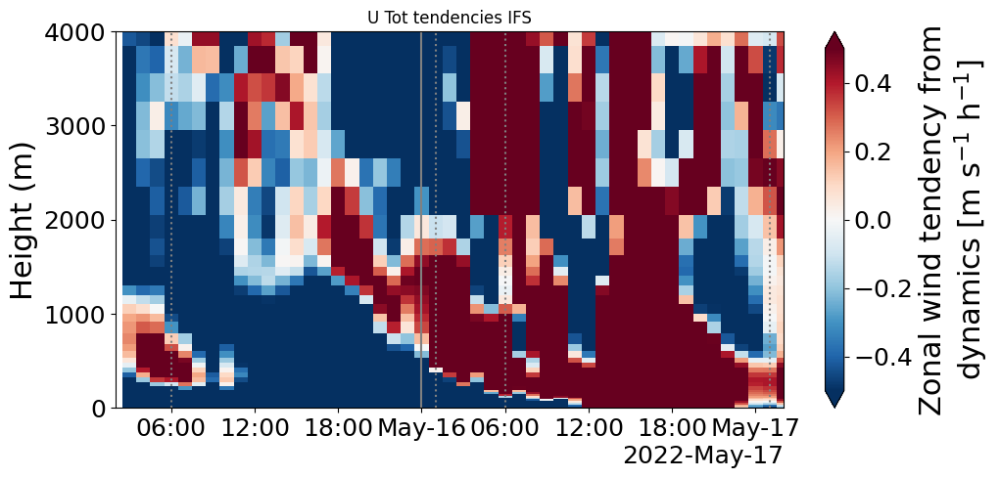

In [ ]:
vmax = 0.5
plt.figure(figsize=(11,5))
(profiles_0600lt['u_tend_dt']).plot(y='zt',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('U Total tendencies (dq/dt) DALES 006LT')

plt.figure(figsize=(11,5))
z_fc_slab_dict[exp_names[0][0]]['dudt_dyn'].isel(time=slice(0,48)).plot(y='height',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('U Tot tendencies IFS')


Text(0.5, 1.0, 'CO2 dynaics tendencies IFS')

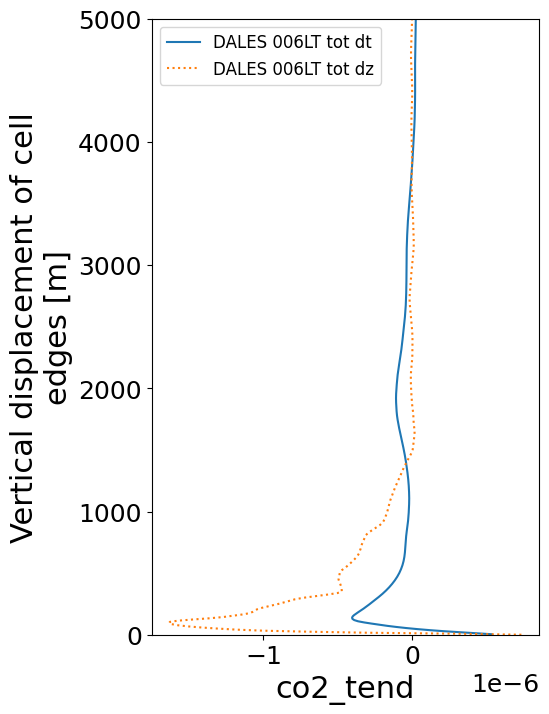

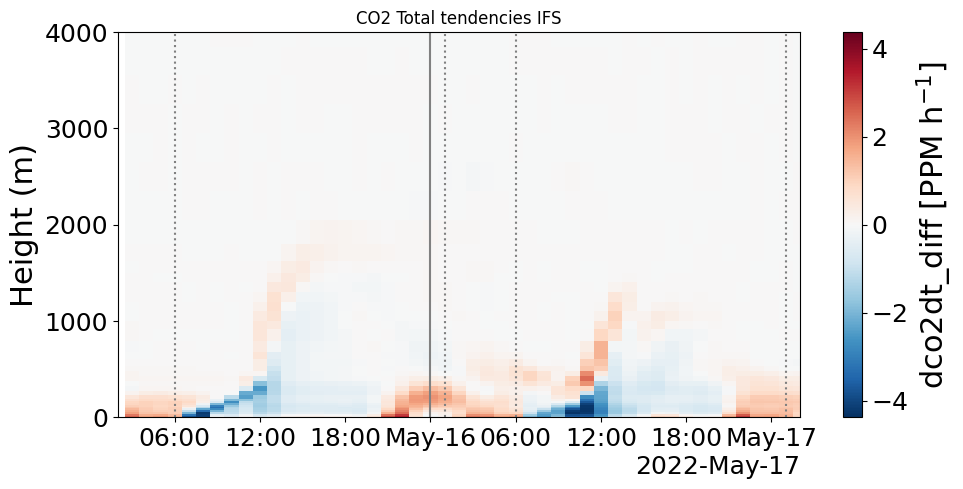

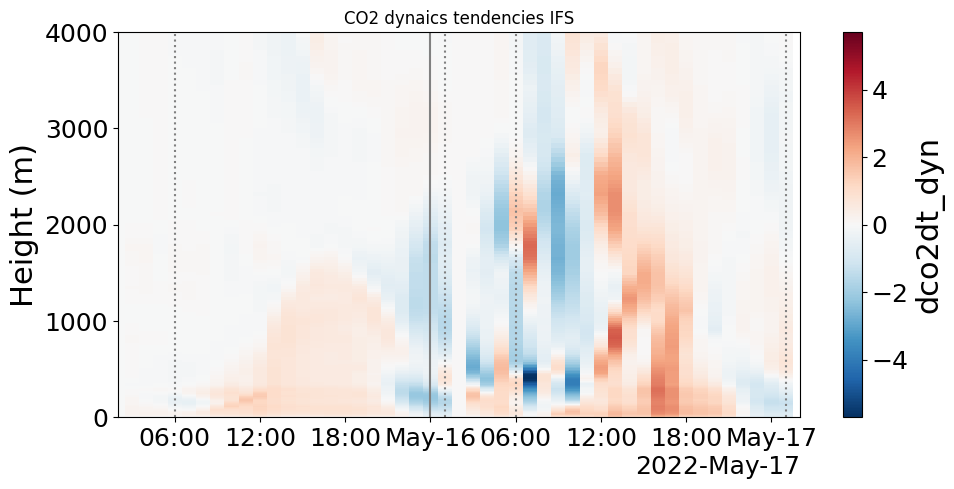

In [ ]:
vmax = None
plt.figure(figsize=(11,5))
z_fc_slab_dict[exp_names[0][0]]['dco2dt_diff'].isel(time=slice(0,48)).plot(y='height',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('CO2 Total tendencies IFS')

plt.figure(figsize=(11,5))
(3600*mfun.concentration_to_ppm('co2',(input['dco2dt_dyn']))).isel(time=slice(0,48)).plot(y='z',vmax= vmax)
plt.ylim([0,4000])
plt.xlim([np.datetime64('2022-05-15T02:00:00'),np.datetime64('2022-05-17T02:00:00')])
plt.axvline(np.datetime64('2022-05-16T00:00:00'),c='grey')
plt.axvline(np.datetime64('2022-05-16T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-17T01:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-15T06:00:00'),c='grey',ls=':')
plt.axvline(np.datetime64('2022-05-16T06:00:00'),c='grey',ls=':')
plt.ylabel('Height (m)')
plt.xlabel('')
plt.title('CO2 dynaics tendencies IFS')



In [ ]:
input['srta'] = z_fc_slab_dict[exp_names[0][0]]['srta'].interp(
    time=input['time'],
    height=input['z']
).reset_coords('height', drop=True)
input['trta'] = z_fc_slab_dict[exp_names[0][0]]['trta'].interp(
    time=input['time'],
    height=input['z']
).reset_coords('height', drop=True)


<xarray.Dataset> Size: 1MB
Dimensions:     (time: 48, z: 180, zs: 4, lev: 138, lay: 137)
Coordinates:
  * time        (time) datetime64[ns] 384B 2022-05-15 ... 2022-05-16T23:00:00
  * z           (z) float64 1kB 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zs          (zs) float64 32B -0.035 -0.175 -0.64 -1.945
  * lev         (lev) int64 1kB 0 1 2 3 4 5 6 7 ... 131 132 133 134 135 136 137
  * lay         (lay) int64 1kB 0 1 2 3 4 5 6 7 ... 130 131 132 133 134 135 136
Data variables: (12/29)
    thl         (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    T           (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    qt          (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    u           (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    v           (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    wls         (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    ...          ...
    fco2nee     (time) float64 384B dask.array<chunksize=(48,), meta=np.ndarray>
    fco2gpp     (time) float64 384B dask.array<chunksize=(48,), meta=np.ndarray>
    fco2rec     (time) float64 384B dask.array<chunksize=(48,), meta=np.ndarray>
    h2o_lay     (time, lay) float64 53kB dask.array<chunksize=(48, 137), meta=np.ndarray>
    stra        (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
    trta        (time, z) float64 69kB dask.array<chunksize=(48, 180), meta=np.ndarray>
Attributes:
    fc:           0.00011487960315944262
    central_lon:  4.927
    central_lat:  51.971
    area:         0.25°×0.25° spatial average
    source:       IFS + (LS)²D
    description:  Generated by (LS)²D (adapted): https://github.com/LS2D & ht...
    reference:    van Stratum et al. (2023). The benefits and challenges of d...

In [51]:
ds_iyw7

<xarray.Dataset> Size: 87kB
Dimensions:          (step: 25, height: 41)
Coordinates:
    number           int64 8B ...
    time             datetime64[ns] 8B ...
  * step             (step) timedelta64[ns] 200B 00:00:00 ... 1 days 00:00:00
    surface          float64 8B ...
    valid_time       (step) datetime64[ns] 200B ...
  * height           (height) float64 328B 0.0 20.0 40.0 ... 5e+03 5.5e+03 6e+03
Data variables: (12/26)
    skt              (step) float32 100B 283.9 283.8 283.2 ... 288.9 288.3 287.9
    sshf             (step) float32 100B 0.0 26.92 22.6 ... 51.82 50.48 44.74
    slhf             (step) float32 100B 0.0 -8.106 -7.531 ... -17.5 -15.93
    fco2nee          (step) float32 100B -9.232e-08 -8.894e-08 ... -1.113e-07
    co2_emiss_tot    (step) float32 100B -2.617e-08 -1.015e-07 ... -1.268e-07
    w                (step, height) float32 4kB -0.01159 -0.008704 ... -0.05778
    ...               ...
    u                (step, height) float32 4kB -2.324 -3.118 ... 3.326 3.483
    v                (step, height) float32 4kB -0.8232 -1.027 ... 8.806 7.173
    ql               (step, height) float32 4kB 0.0 0.0 ... 4.287e-06 1.095e-05
    qt               (step, height) float32 4kB 0.007005 0.006958 ... 0.001631
    p                (step, height) float32 4kB 1.021e+05 ... 4.949e+04
    rho              (step, height) float32 4kB 1.236 1.234 ... 0.7089 0.6719
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-02-03T11:05 GRIB to CDM+CF via cfgrib-0.9.1...

In [52]:
def deaccumulate_var(var_int, dt=3600, dim='step', long_name=None, units=None):
    """
    De-accumulate an xarray DataArray or Dataset along a time/step dimension.
    - var_int: xarray.DataArray or xarray.Dataset
    - dt: divisor (seconds)
    - dim: name of the dimension to diff (default 'step')
    - long_name, units: optional replacements for those attributes

    Keeps all attributes from the input except 'GRIB_name'.
    """

    if isinstance(var_int, xr.Dataset):
        return var_int.map(lambda v: deaccumulate_var(v, dt=dt, dim=dim, long_name=long_name, units=units))

    if not isinstance(var_int, xr.DataArray):
        raise TypeError("var_int must be an xarray.DataArray or xarray.Dataset")

    if dim not in var_int.dims:
        raise ValueError(f"Input must have a '{dim}' dimension")

    # compute differences (result has length N-1 along dim)
    diff = var_int.diff(dim=dim) / dt

    # first timestep is assumed accumulation from zero -> divide first by dt
    first = (var_int.isel({dim: 0}) / dt).expand_dims(dim)

    # concat back to original length and restore original coord values
    result = xr.concat([first, diff], dim=dim)
    result = result.assign_coords({dim: var_int[dim].values})

    # preserve attributes except GRIB_name, allow overriding long_name and units
    attrs = dict(var_int.attrs or {})
    attrs.pop('GRIB_name', None)
    if long_name is not None:
        attrs['long_name'] = long_name
    if units is not None:
        attrs['units'] = units
    result.attrs = attrs
    return result

In [68]:
ds_iyw7

<xarray.Dataset> Size: 83kB
Dimensions:          (step: 25, height: 41)
Coordinates:
    number           int64 8B ...
    time             datetime64[ns] 8B ...
  * step             (step) timedelta64[ns] 200B 00:00:00 ... 1 days 00:00:00
    surface          float64 8B ...
    valid_time       (step) datetime64[ns] 200B ...
  * height           (height) float64 328B 0.0 20.0 40.0 ... 5e+03 5.5e+03 6e+03
Data variables: (12/25)
    skt              (step) float32 100B 283.9 283.8 283.2 ... 288.9 288.3 287.9
    sshf             (step) float32 100B 0.0 26.92 22.6 ... 51.82 50.48 44.74
    slhf             (step) float32 100B 0.0 -8.106 -7.531 ... -17.5 -15.93
    fco2nee          (step) float32 100B -9.232e-08 -8.894e-08 ... -1.113e-07
    co2_emiss_tot    (step) float32 100B -2.617e-08 -1.015e-07 ... -1.268e-07
    w                (step, height) float32 4kB -0.01159 -0.008704 ... -0.05778
    ...               ...
    LW_heating_rate  (step, height) float32 4kB 0.0 0.0 ... -1.632e-05
    u                (step, height) float32 4kB -2.324 -3.118 ... 3.326 3.483
    v                (step, height) float32 4kB -0.8232 -1.027 ... 8.806 7.173
    ql               (step, height) float32 4kB 0.0 0.0 ... 4.287e-06 1.095e-05
    qt               (step, height) float32 4kB 0.007005 0.006958 ... 0.001631
    p                (step, height) float32 4kB 1.021e+05 ... 4.949e+04
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-02-04T13:58 GRIB to CDM+CF via cfgrib-0.9.1...

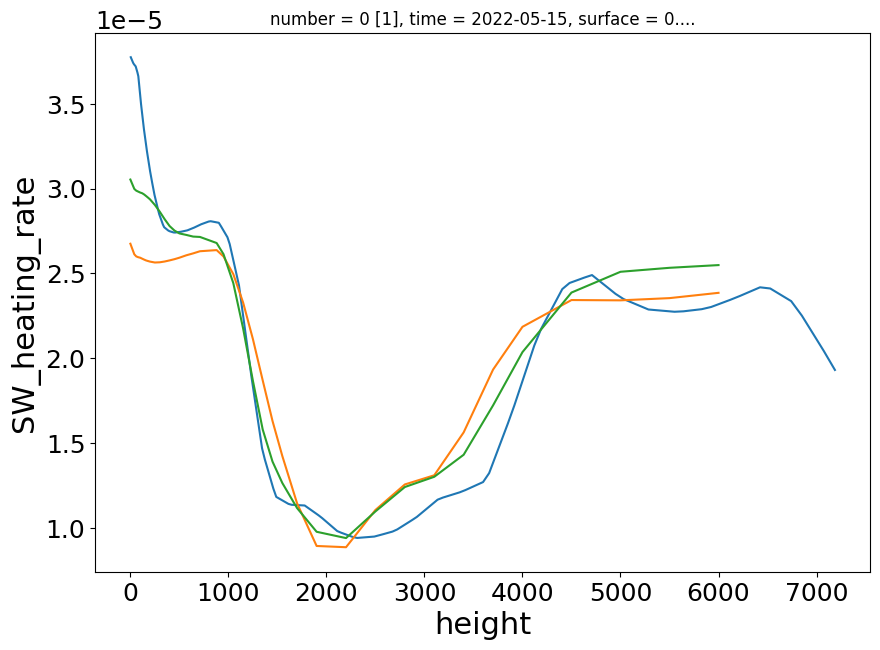

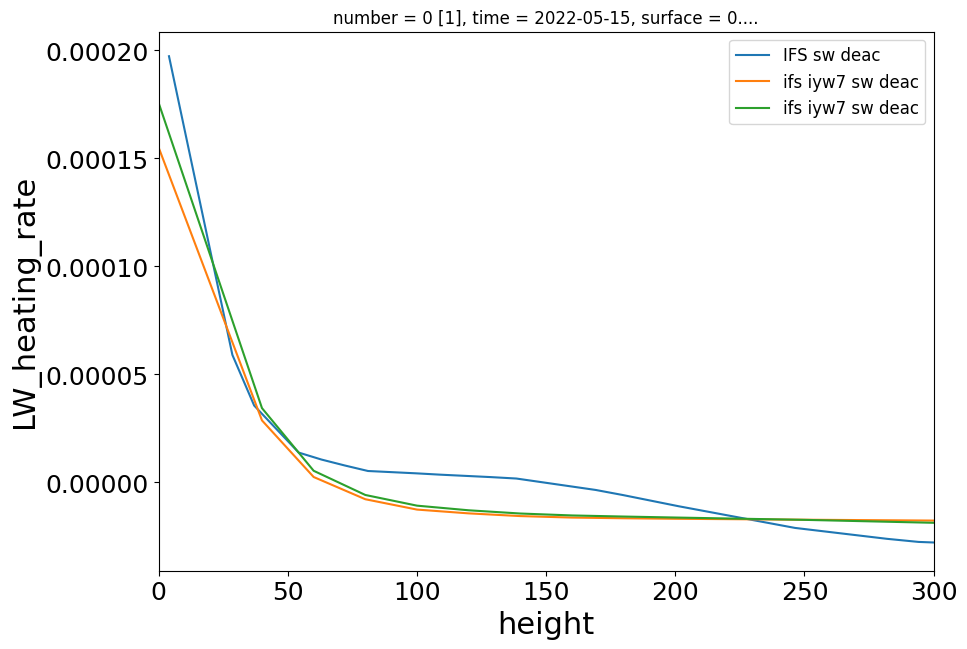

In [67]:
time_interval = [np.datetime64('2022-05-15T10:00:00'),np.datetime64('2022-05-15T12:00:00')]
plt.figure()
input['srta_deac'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(label='IFS sw deac')
ds_iyw7['SW_heating_rate'].isel(step=slice(12,14)).mean('step').plot(label='ifs iyw7 sw deac')
ds_iyw7['SW_heating_rate'].isel(step=slice(10,12)).mean('step').plot(label='ifs iyw7 sw deac')

plt.figure()
input['trta_deac'].sel(time=slice(time_interval[0],time_interval[1])).mean('time').plot(label='IFS sw deac')
ds_iyw7['LW_heating_rate'].isel(step=slice(12,14)).mean('step').plot(label='ifs iyw7 sw deac')
ds_iyw7['LW_heating_rate'].isel(step=slice(10,12)).mean('step').plot(label='ifs iyw7 sw deac')
plt.xlim([0,300])
plt.legend()

In [43]:
input

<xarray.Dataset> Size: 3MB
Dimensions:              (time: 96, z: 180, zs: 4, lev: 138, lay: 137)
Coordinates:
  * time                 (time) datetime64[ns] 768B 2022-05-15T02:00:00 ... 2...
  * z                    (z) float64 1kB 4.0 12.06 20.24 ... 7.073e+03 7.188e+03
  * zs                   (zs) float64 32B -0.035 -0.175 -0.64 -1.945
  * lev                  (lev) int64 1kB 0 1 2 3 4 5 ... 132 133 134 135 136 137
  * lay                  (lay) int64 1kB 0 1 2 3 4 5 ... 131 132 133 134 135 136
Data variables: (12/34)
    thl                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    T                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    qt                   (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    u                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    v                    (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wls                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    ...                   ...
    fco2rec              (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    h2o_lay              (time, lay) float64 105kB dask.array<chunksize=(96, 137), meta=np.ndarray>
    co2_antrop_emission  (time) float64 768B dask.array<chunksize=(96,), meta=np.ndarray>
    wspd                 (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    wdir                 (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
    rho                  (time, z) float64 138kB dask.array<chunksize=(96, 180), meta=np.ndarray>
Attributes:
    fc:           0.00011487960315944262
    central_lon:  4.927
    central_lat:  51.971
    area:         0.75°×0.75° spatial average
    source:       IFS + (LS)²D
    description:  Generated by (LS)²D (adapted): https://github.com/LS2D & ht...
    reference:    van Stratum et al. (2023). The benefits and challenges of d...